In [3]:
import numpy as np
import pandas as pd
import nltk, math
import re
import os
import codecs
from sklearn import feature_extraction

In [4]:
# Read data from file 'NLPKBData.csv' 
data = pd.read_csv('C:/Users/zw903e/Desktop/VmWare/NLPKBData.csv', encoding='windows-1252') 

In [5]:
# Making a copy of DF
df = data

In [6]:
# Preview the first 5 lines of the loaded data 
#df.head()

In [7]:
# Confirm the number of missing values in each column.
#df.info()

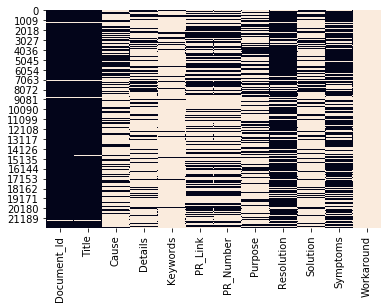

In [9]:
import seaborn as sns
sns.heatmap(df.isnull(), cbar=False)

In [7]:
# from the above heat map we can see that there are missing values for document ids also

In [10]:
df = df[['Document_Id', 'Title', 'Details']]

In [11]:
df.head(10)

,Document_Id,Title,Details
0,2147042,Mirgrating from Windows 7 to Window10 OS in Mi...,NaN
1,2008348,Windows 2008 R2 machine blue screens after ins...,NaN
2,2098081,\xe4\xbd\xbf\xe7\x94\xa8 HP 3PAR Peer Persiste...,NaN
3,2151801,GI service not ready after adding IP address i...,NaN
4,2151113,"VMware ESXi 6.5, Patch Release ESXi-6.5.0-2017...",Profile NameESXi-6.5.0-20171204001-no-toolsBui...
5,2114439,RHEL Guest Operating system reports the warnin...,When you use vCloud Connector to copy a vApp f...
6,2145954,VMware Tools 10.0.x fails to run on Ubuntu 16....,VMware Tools 10.0.x fails to run on Ubuntu 16....
7,2046858,Conversi\xc3\xb3n de m\xc3\xa1quinas f\xc3\xad...,NaN
8,2147406,VMware ESXi 6.0\xe3\x80\x81\xe3\x83\x91\xe3\x8...,NaN
9,2009041,Upgrading vCloud database to 1.5 fails with SQ...,If the vSwitch port limit is set lower than th...


In [12]:
#Delete rows if there are null values in a specific column
#df = df.dropna(axis=0, subset=['Document_Id'])

In [13]:
# drop rows with missing value
df = df.dropna()

In [14]:
len(df)

5589

In [15]:
docuemntID_details_df = df[['Document_Id', 'Details']]

In [16]:
docuemntID_details_df.head(5)

,Document_Id,Details
4,2151113,Profile NameESXi-6.5.0-20171204001-no-toolsBui...
5,2114439,When you use vCloud Connector to copy a vApp f...
6,2145954,VMware Tools 10.0.x fails to run on Ubuntu 16....
9,2009041,If the vSwitch port limit is set lower than th...
12,2120046,"Occasionally, when using the Real-Time Audio-V..."


In [17]:
len(docuemntID_details_df)

5589

In [18]:
# load nltk's English stopwords as variable called 'stopwords'
stop_words = nltk.corpus.stopwords.words('english')

In [19]:
# load nltk's SnowballStemmer as variabled 'stemmer'
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [20]:
def tokenize_and_stem(text):     
    text=text.lower() # lowercase   
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)  # remove tags
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    filtered_tokens = []
    for token in tokens:  
        if re.search('[a-zA-Z]', token):
            if not token in stop_words: #Stop word removal
                filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems

In [21]:
total_details_vocab_stemmed = []
total_details_vocab_stemmed_2 = []
count = 1

for doc in docuemntID_details_df['Details']:
    #print(doc)
    allwords_stemmed = tokenize_and_stem(doc) #for each item in 'synopses', tokenize/stem
    if count <= 3:
        print((allwords_stemmed))
    total_details_vocab_stemmed_2.extend(allwords_stemmed) #extend the 'totalvocab_stemmed' list
    total_details_vocab_stemmed.append(allwords_stemmed) #extend the 'totalvocab_stemmed' list

    #print("********: ", count)
    #print(allwords_stemmed)
    count = count + 1    

['profil', 'nameesxi', 'toolsbuildfor', 'build', 'inform', 'see', 'kb', 'vendorvmwar', 'inc', 'releas', 'datedecemb', 'accept', 'levelpartnersupportedaffect', 'hardwaren', 'aaffect', 'softwaren', 'aaffect', 'vib', 'n', 'tvmware_bootbank_esx', 'base_', 'vmware_bootbank_esx', 'tboot_', 'vmware_bootbank_vsan_', 'vmware_bootbank_vsanhealth_', 'vmw_bootbank_vmkusb_', 'vmw', 'vmw_bootbank_vmkata_', 'vmw', 'vmware_bootbank_esx', 'dvfilter', 'generic', 'fastpath_', 'vmw_bootbank_nvmxnet', 'vmw', 'vmw_bootbank_igbn_', 'vmw', 'vmw_bootbank_ntg', 'vmw', 'vmw_bootbank_misc', 'drivers_', 'vmw_bootbank_nvme_', 'vmw', 'vmware_bootbank_esx', 'ui_', 'n', 'tprs', 'fix', 'relat', 'cve', 'numbersn']
['use', 'vcloud', 'connector', 'copi', 'vapp', 'vcloud', 'director', 'vcd', 'instanc', 'temporari', 'vapp', 'templat', 'vcd', 'automat', 'creat', 'facilit', 'transfer', 'current', 'howev', 'temporari', 'templat', 'catalog', 'item', 'creat', 'automat', 'delet', 'copi', 'complet']
['vmware', 'tool', 'x', 'fail',

In [22]:
# Python code to remove duplicate elements 
def remove_duplicate_word(all_word_list): 
    final_list = [] 
    for num in all_word_list: 
        if num not in final_list: 
            final_list.append(num) 
    return final_list 

In [23]:
uniqueItemsWordBank = remove_duplicate_word(total_details_vocab_stemmed_2)

In [24]:
len(uniqueItemsWordBank)

9939

In [25]:
docs = total_details_vocab_stemmed

In [26]:
len(docs)

5589

In [27]:
# TF(t) = (Number of times term t appears in a document) / (Total number of terms in the document).
def myTF(word, doc):
    total_items_list = doc.count(word)
    total_items_doc = len(doc)
    print("myTF: ", total_items_list, "", total_items_doc)
    if total_items_doc != 0:
        tf = total_items_list/total_items_doc
    return tf   

In [28]:
# IDF(t) = log_e(Total number of documents / Number of documents with term t in it). 
def myIDF(word, docs):
    count = 0
    totalNumberDocs = len(docs)
    for doc in docs:
        if word in doc:
            count = count + 1
        if count != 0:        
            idf = math.log(float(totalNumberDocs) / count)
    print(word, " word found ", count, " times total in all the documents")
    return idf

In [ ]:
tf_idf_matrix = []
for word in uniqueItemsWordBank:
    print("word: ", word)
    tf_idf_col_list = []
    idfFlag = 1 # To avoid idf calculation of a word for each time on the same doc
    for doc in docs:
        #print("doc: ", doc)
        if len(doc) > 0:
            tf = myTF(word, doc)
            if idfFlag == 1:
                idf = myIDF(word, docs)
                idfFlag = 0
            tf_idf = tf * idf
        print("***************")
        tf_idf_col_list.append(tf_idf) 
    tf_idf_matrix.extend(tf_idf_col_list)

word:  profil
myTF:  1  51
profil  word found  331  times total in all the documents
***************
myTF:  0  28
***************
myTF:  0  22
***************
myTF:  0  59
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  8
***************
myTF:  0  21
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  1  105
***************
myTF:  0  17
***************
myTF:  0  53
***************
myTF:  1  38
***************
myTF:  0  41
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  12
***************
myTF:  0  68
***************
myTF:  0  27
***************
myTF:  0  87
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  2  100
***************
myTF:  0  40
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  8
***************
myTF:  1  39
***************
myTF:  0  61
***************
myTF:  0  98
***************
m

myTF:  0  85
***************
myTF:  1  44
***************
myTF:  0  38
***************
myTF:  0  32
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  55
***************
myTF:  0  88
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  93
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  33
***************
myTF:  0  21
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  0  34
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  72
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  12
****

myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  55
***************
myTF:  0  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  31
***************
myTF:  0  50
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  86
***************
myTF:  0  24
***************
myTF:  0  97
***************
myTF:  0  18
***************
myTF:  0  52
***************
myTF:  0  22
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  25

***************
myTF:  0  59
***************
myTF:  0  97
***************
myTF:  1  44
***************
myTF:  0  29
***************
myTF:  0  49
***************
myTF:  0  100
***************
myTF:  0  29
***************
myTF:  1  35
***************
myTF:  1  46
***************
myTF:  0  41
***************
myTF:  0  22
***************
myTF:  0  152
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  1  60
***************
myTF:  0  9
***************
myTF:  0  40
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  21
***************
m

myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  0  51
***************
myTF:  0  25
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  14
***************
myTF:  0  22
***************
myTF:  0  114
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  21
***************
myTF:  0  87
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  28
***************
myTF:  0  18
***************
myTF:  0  4
***************
myTF:  0  167
***************
myTF:  0  75
***************
myTF:  0  13
*

myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  1  34
***************
myTF:  1  49
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  53
***************
myTF:  9  271
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  38
***************
myTF:  0  285
***************
myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  149
***************
myTF:  0  31
***************
myTF:  0  35
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  2

***************
myTF:  0  48
***************
myTF:  0  44
***************
myTF:  0  18
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  46
***************
myTF:  0  53
***************
myTF:  1  70
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  84
***************
myTF:  0  73
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  71
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  140
***************
myTF:  0  102
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  25
***************
myTF:  0  104
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
************

myTF:  0  21
***************
myTF:  1  51
***************
myTF:  0  13
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  121
***************
myTF:  0  83
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  57
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  31
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  122
***************
myTF:  0  169
***************
myTF:  0  51
***************
myTF:  0  35
***************
myTF:  0  7
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  19
*

myTF:  0  38
***************
myTF:  9  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  104
***************
myTF:  0  432
***************
myTF:  0  49
***************
myTF:  2  61
***************
myTF:  0  40
***************
myTF:  0  74
***************
myTF:  0  93
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  1  54
***************
myTF:  0  34
***************
myTF:  0  106
***************
myTF:  0  228
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  139
***************
myTF:  0  88
***************
myTF:  0  17
***************
myTF:  0  34
***************
myTF:  0  15
***************
myTF:  0  45
***************
myTF:  9  189
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  

myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  62
***************
myTF:  0  54
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  232
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  48
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  47
***************
myTF:  1  63
***************
myTF:  0  71
***************
myTF:  0  16
***************
myTF:  0  124
***************
myTF:  0  124
***************
myTF:  0  97
***************
myTF:  0  41
***************
myTF:  0  144
***************
myTF:  0  87
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  125
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  

***************
myTF:  0  173
***************
myTF:  0  29
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  1  47
***************
myTF:  0  139
***************
myTF:  0  86
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  20
***************
myTF:  0  119
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  96
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  141
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
********

myTF:  0  33
***************
myTF:  0  94
***************
myTF:  0  58
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  24
***************
myTF:  0  77
***************
myTF:  0  105
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  22
***************
myTF:  0  3
***************
myTF:  0  32
***************
myTF:  1  49
***************
myTF:  0  424
***************
myTF:  3  33
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  18
***************
myTF:  0  91
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  52
***************
myTF:  0  42
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  18
***

myTF:  0  41
***************
myTF:  0  48
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  1  52
***************
myTF:  0  11
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  61
***************
myTF:  0  30
***************
myTF:  0  21
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  71
***************
myTF:  0  20
***************
myTF:  0  63
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  84
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  1  43
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  81
*

myTF:  0  10
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  72
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  0  143
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  42
***************
myTF:  0  29
***************
myTF:  0  58
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  98
***************
myTF:  0  41
***************
myTF:  0  96
***************
myTF:  0  17
***************
myTF:  0  27
***************
myTF:  0  173
***************
myTF:  0  15
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6
***************
myTF:  0  22


myTF:  0  153
***************
myTF:  0  145
***************
myTF:  0  30
***************
myTF:  0  94
***************
myTF:  0  37
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  97
***************
myTF:  0  12
***************
myTF:  0  53
***************
myTF:  0  10
***************
myTF:  0  10
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  9  198
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  41
***************
myTF:  0  104
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  2

***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  66
***************
myTF:  0  24
***************
myTF:  0  23
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  42
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  65
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  39
***************
myTF:  0  76
***************
myTF:  0  141
***************
myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  33
***************
myTF:  0  26
*************

myTF:  0  62
***************
myTF:  0  42
***************
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  83
***************
myTF:  0  97
***************
myTF:  0  53
***************
myTF:  0  32
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  88
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  43
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  18
***************
myTF:  0  119
***************
myTF:  0  147
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  203
***************
myTF:  0  64
************

myTF:  0  63
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  1  35
***************
myTF:  0  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  132
***************
myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  0  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  34


***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  38
***************
myTF:  0  113
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  164
***************
myTF:  0  86
***************
myTF:  0  8
***************
myTF:  0  11
***************
myTF:  0  119
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  23
***************

myTF:  0  10
***************
myTF:  0  222
***************
myTF:  0  51
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  55
***************
myTF:  1  29
***************
myTF:  0  74
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  17
***************
myTF:  0  65
***************
myTF:  0  56
***************
myTF:  0  38
***************
myTF:  0  88
***************
myTF:  0  37
***************
myTF:  0  48
***************
myTF:  0  13
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  55
***************
myTF:  0  47
***************
myTF:  0  33
***************
myTF:  0  43
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  13
***************
myTF:  0  76


myTF:  0  7
***************
myTF:  0  155
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  80
***************
myTF:  0  80
***************
myTF:  0  18
***************
myTF:  0  2
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  99
***************
myTF:  0  187
***************
myTF:  0  91
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  15
***************
myTF:  0  7
***************
myTF:  0  35
***************
myTF:  0  84
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  334
***************
myTF:  0  34
***************
myTF:  0  29
***************
myTF:  0  38
***************
myTF:  0  496
***************
myTF:  0  61
***************
myTF:  0  40
***************
myTF:  0  61
***************
myTF:  0  36
*

***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  31
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  122
***************
myTF:  0  169
***************
myTF:  0  51
***************
myTF:  0  35
***************
myTF:  0  7
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  19
***************
myTF:  0  75
***************
myTF:  0  80
***************
myTF:  0  191
***************
myTF:  0  85
***************
myTF:  0  11
***************
myTF:  0  73
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  32
***************


myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  106
***************
myTF:  0  228
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  139
***************
myTF:  0  88
***************
myTF:  0  17
***************
myTF:  0  34
***************
myTF:  0  15
***************
myTF:  0  45
***************
myTF:  0  189
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  82
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  49
***************
myTF:  0  113
***************
myTF:  0  111
***************
myTF:  0  85
***************
myTF:  0  41
***************
myTF:  0

myTF:  0  48
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  47
***************
myTF:  0  63
***************
myTF:  0  71
***************
myTF:  0  16
***************
myTF:  0  124
***************
myTF:  0  124
***************
myTF:  0  97
***************
myTF:  0  41
***************
myTF:  0  144
***************
myTF:  0  87
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  125
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  89
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  75
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  13
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  

myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  96
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  141
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  66
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  726
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  

***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  424
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  18
***************
myTF:  0  91
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  52
***************
myTF:  0  42
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  129
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  8
***************
myTF:  0  123
***************
myTF:  0  68
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  65
***************
myTF:  0  28
***************
myTF:  0  44
***************
myTF:  0  22
**************

myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  71
***************
myTF:  0  20
***************
myTF:  0  63
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  84
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  43
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  81
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  159
***************
myTF:  0  13
***************
myTF:  0  140
***************
myTF:  0  33
***************
myTF:  0  189
***************
myTF:  0  105
***************
myTF:  0  62
***************
myTF:  0  37
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  0  27

***************
myTF:  0  29
***************
myTF:  0  58
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  98
***************
myTF:  0  41
***************
myTF:  0  96
***************
myTF:  0  17
***************
myTF:  0  27
***************
myTF:  0  173
***************
myTF:  0  15
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  162
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  61
***************
myTF:  0  11
***************
myTF:  0  33
***************
myTF:  0  37
***************
myTF:  0  24
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  46
***************
myTF:  0  84
*************

***************
myTF:  0  32
***************
myTF:  0  40
***************
myTF:  0  44
***************
myTF:  0  192
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  23
***************
myTF:  0  56
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  122
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  26
************

myTF:  0  42
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  65
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  39
***************
myTF:  0  76
***************
myTF:  0  141
***************
myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  225
***************
myTF:  0  41
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  30
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  31

myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  25
***************
myTF:  0  68
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  57
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  135
***************
myTF:  0  92
***************
myTF:  0  26
***************
myTF:  0  57
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
*

myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  1  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  34
***************
myTF:  0  74
***************
myTF:  0  23
***************
myTF:  0  55
***************
myTF:  0  63
***************
myTF:  0  57
***************
myTF:  0  196
***************
myTF:  0  136
***************
myTF:  0  31
***************
myTF:  0  234
***************
myTF:  0  50
***************
myTF:  0  853
***************
myTF:  0  22
***************
myTF:  0  61
***************
myTF:  0  

myTF:  0  28
***************
myTF:  0  18
***************
myTF:  0  4
***************
myTF:  0  167
***************
myTF:  0  75
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  105
***************
myTF:  0  54
***************
myTF:  0  77
***************
myTF:  0  24
***************
myTF:  0  20
***************
myTF:  0  5
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  128
***************
myTF:  0  15
***************
myTF:  0  243
***************
myTF:  0  57
***************
myTF:  0  93
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  105
***************
myTF:  0  22
***************
myTF:  0  113
***************
myTF:  0  34
***************
myTF:  0  

myTF:  0  31
***************
myTF:  0  35
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  141
***************
myTF:  0  14
***************
myTF:  0  39
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  21
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  97
***************
myTF:  0  47
***************
myTF:  0  49
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  49
***************
myTF:  0  30
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  0  66
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  30


myTF:  0  22
***************
myTF:  0  25
***************
myTF:  0  104
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  88
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  79
***************
myTF:  0  5
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  283
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  0  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  65
***************
myTF:  0  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  41
***************
myTF:  0  13
*

myTF:  0  85
***************
myTF:  0  24
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  126
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  5
***************
myTF:  0  22
***************
myTF:  0  102
***************
myTF:  0  21
***************
myTF:  0  88
***************
myTF:  0  25
***************
myTF:  0  117
***************
myTF:  0  71
***************
myTF:  0  168
***************
myTF:  0  119
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  375
***************
myTF:  0  130
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  25
***************
myTF:  0  42
***************
myTF:  0  80
***************
myTF:  0  124
***************
myTF:  0 

***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  21
***************
myTF:  0  60
***************
myTF:  0  51
***************
myTF:  0  59
***************
myTF:  0  177
***************
myTF:  0  350
***************
myTF:  0  25
***************
myTF:  0  215
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  28
***************
myTF:  0  125
***************
myTF:  0  135
***************
myTF:  0  47
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  88
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  30
**********

myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  125
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  89
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  75
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  13
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  72
***************
myTF:  0  13
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  436
***************
myTF:  0  47
***************
myTF:  0  134
***************
myTF:  0  123
***************
myTF:  0  50
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  48
***************
myTF:  0  168
***************
myTF:  0 

myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  66
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  726
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  47
***************
myTF:  1  84
***************
myTF:  0  21
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  100
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  

myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  129
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  8
***************
myTF:  0  123
***************
myTF:  0  68
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  65
***************
myTF:  0  28
***************
myTF:  0  44
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  23
***************
myTF:  0  69
***************
myTF:  0  46
***************
myTF:  0  77
***************
myTF:  0  27
***************
myTF:  0  66
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  54
***************
myTF:  0  46
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  125
***************
myTF:  0  31


***************
myTF:  0  33
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  81
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  159
***************
myTF:  0  13
***************
myTF:  0  140
***************
myTF:  0  33
***************
myTF:  0  189
***************
myTF:  0  105
***************
myTF:  0  62
***************
myTF:  0  37
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  61
***************
myTF:  0  96
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  22
***************
myTF:  0  81
***************
myTF:  0  51
***************
myTF:  0  44
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  14
***********

myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  162
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  61
***************
myTF:  0  11
***************
myTF:  0  33
***************
myTF:  0  37
***************
myTF:  0  24
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  46
***************
myTF:  0  84
***************
myTF:  0  77
***************
myTF:  0  36
***************
myTF:  0  44
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  70
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  43
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  98
***************
myTF:  0  69
*

***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  58
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  13
***************
myTF:  0  88
***************
myTF:  0  122
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  78
***************
myTF:  0  110
***************
myTF:  0  61
***************
myTF:  0  38
***************
m

myTF:  0  49
***************
myTF:  2  40
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  1  33
***************
myTF:  0  26
***************
myTF:  0  225
***************
myTF:  2  41
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  33
***************
myTF:  1  41
***************
myTF:  1  30
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  27
***************
myTF:  1  30
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  1  31
***************
myTF:  0  85
***************
myTF:  1  44
***************
myTF:  1  38
***************
myTF:  1  32
***************
myTF:  1  32
***************
myTF:  0  22
***************
myTF:  1  29
***************
myTF:  0  55
***************
myTF:  0  88
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  93
***************
myTF:  0  20
***************
myTF:  0  15


myTF:  2  44
***************
myTF:  0  36
***************
myTF:  2  42
***************
myTF:  2  40
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  1  35
***************
myTF:  0  44
***************
myTF:  2  49
***************
myTF:  0  48
***************
myTF:  0  6
***************
myTF:  0  37
***************
myTF:  0  39
***************
myTF:  0  28
***************
myTF:  1  77
***************
myTF:  1  38
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  1  54
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  1  53
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  48
**

myTF:  1  47
***************
myTF:  0  11
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  1  60
***************
myTF:  1  54
***************
myTF:  0  26
***************
myTF:  0  22
***************
myTF:  0  60
***************
myTF:  0  20
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  22
***************
myTF:  1  45
***************
myTF:  1  35
***************
myTF:  1  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  2  132
***************
myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  1  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88


myTF:  1  29
***************
myTF:  0  7
***************
myTF:  1  53
***************
myTF:  0  27
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  232
***************
myTF:  0  53
***************
myTF:  2  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  1  46
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  1  51
***************
myTF:  0  25
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  14
***************
myTF:  0  22
***************
myTF:  0  114
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  21
*

myTF:  0  56
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  1  31
***************
myTF:  1  56
***************
myTF:  0  11
***************
myTF:  1  35
***************
myTF:  6  68
***************
myTF:  1  30
***************
myTF:  2  25
***************
myTF:  1  30
***************
myTF:  0  68
***************
myTF:  1  70
***************
myTF:  2  40
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  70
***************
myTF:  0  24
***************
myTF:  0  33
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  1  30
***************
myTF:  1  24
***************
myTF:  0  46
***************
myTF:  0  11
*

***************
myTF:  1  283
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  1  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  1  31
***************
myTF:  1  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  65
***************
myTF:  1  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  2  41
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  156
***************
myTF:  0  12
***************
myTF:  3  34
***************
myTF:  0  7
***************
myTF:  1  41
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  9
***************
myTF:  1  31
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  64
***************

***************
myTF:  0  8
***************
myTF:  0  52
***************
myTF:  1  34
***************
myTF:  2  44
***************
myTF:  1  32
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  46
***************
myTF:  1  37
***************
myTF:  0  29
***************
myTF:  1  43
***************
myTF:  1  81
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  133
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  21
***************
myTF:  0  29
***************
myTF:  2  63
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  1  184
***************
myTF:  0  15
***************
myTF:  0  22
***************
myTF:  0  119
***************
myTF:  0  446
***************
myTF:  2  39
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  63
***************
myTF:  0  6
************

myTF:  2  50
***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  15
***************
myTF:  1  31
***************
myTF:  1  65
***************
myTF:  0  56
***************
myTF:  2  149
***************
myTF:  1  109
***************
myTF:  0  33
***************
myTF:  1  110
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  46
***************
myTF:  0  4
***************
myTF:  0  93
***************
myTF:  0  93
***************
myTF:  2  49
***************
myTF:  1  228
***************
myTF:  0  16
***************
myTF:  1  74
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  1  51
***************
myTF:  0  54
***************
myTF:  0  9
***************
myTF:  1  30
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  1  72
***************
myTF:  0  11
***************
myTF:  0  32
*

myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  101
***************
myTF:  0  43
***************
myTF:  1  38
***************
myTF:  0  23
***************
myTF:  2  38
***************
myTF:  0  62
***************
myTF:  0  86
***************
myTF:  0  1
***************
myTF:  2  42
***************
myTF:  1  39
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  2  35
***************
myTF:  1  55
***************
myTF:  0  17
***************
myTF:  0  152
***************
myTF:  0  110
***************
myTF:  1  58
***************
myTF:  0  84
***************
myTF:  0  148
***************
myTF:  0  43
***************
myTF:  1  30
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  2  41
***************
myTF:  0  14
***************
myTF:  2  59
***************
myTF:  0  17
***************
myTF:  1  55
***************
myTF:  1  58
***************
myTF:  1  31
***************
myTF:  0  67
***************
myTF:  0  5

myTF:  0  11
***************
myTF:  0  13
***************
myTF:  1  45
***************
myTF:  0  135
***************
myTF:  0  15
***************
myTF:  0  73
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  68
***************
myTF:  0  23
***************
myTF:  1  61
***************
myTF:  0  10
***************
myTF:  0  61
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  1  29
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  22
***************
myTF:  0  28
***************
myTF:  0  57
***************
myTF:  0  57
***************
myTF:  2  152
***************
myTF:  0  111
***************
myTF:  1  33

myTF:  1  31
***************
myTF:  0  65
***************
myTF:  0  28
***************
myTF:  1  44
***************
myTF:  0  22
***************
myTF:  1  27
***************
myTF:  0  23
***************
myTF:  0  69
***************
myTF:  0  46
***************
myTF:  0  77
***************
myTF:  1  27
***************
myTF:  0  66
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  54
***************
myTF:  0  46
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  5  125
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  118
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  45
***************
myTF:  0  7
***************
myTF:  0  20
***************
myTF:  1  187
***************
myTF:  0  13
***************
myTF:  0  6
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23

***************
myTF:  2  49
***************
myTF:  0  18
***************
myTF:  1  50
***************
myTF:  0  140
***************
myTF:  0  61
***************
myTF:  0  7
***************
myTF:  0  99
***************
myTF:  0  39
***************
myTF:  0  90
***************
myTF:  0  39
***************
myTF:  1  52
***************
myTF:  0  23
***************
myTF:  0  71
***************
myTF:  0  35
***************
myTF:  0  90
***************
myTF:  0  41
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  2  38
***************
myTF:  0  102
***************
myTF:  0  170
***************
myTF:  1  45
***************
myTF:  0  10
***************
myTF:  1  73
***************
myTF:  0  84
***************
myTF:  1  30
***************
myTF:  0  49
***************
myTF:  0  99
***************
myTF:  0  344
***************
myTF:  0  23
***************
myTF:  0  26
***************
myTF:  0  21
***************
***************
myTF:  0

myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  17
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  1  68
***************
myTF:  0  35
***************
myTF:  2  43
***************
myTF:  0  15
***************
myTF:  0  11
***************
myTF:  0  178
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  99
***************
myTF:  1  33
***************
myTF:  0  30
***************
myTF:  0  155
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  79
***************
myTF:  0  52
***************
myTF:  1  72
***************
myTF:  0  16
***************
myTF:  0  68
***************
myTF:  0  11
***************
myTF:  0  83
***************
myTF:  0  49
***************
myTF:  0  9
***************
myTF:  2  41
***************
myTF:  0  44
***************
myTF:  0  15
*

myTF:  0  19
***************
myTF:  1  67
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  24
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  1  23
***************
myTF:  0  13
***************
myTF:  0  127
***************
myTF:  0  21
***************
myTF:  1  50
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  1  30
***************
myTF:  0  24
***************
myTF:  1  36
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  1  40
***************
myTF:  0  35
***************
myTF:  0  278
***************
myTF:  1  58
***************
myTF:  0  17
***************
myTF:  1  54
***************
myTF:  1  208
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  16
***************
myTF:  0  19


myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  1  38
***************
myTF:  0  34
***************
myTF:  0  51
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  6  183
***************
myTF:  2  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  86
***************
myTF:  0  31
***************
myTF:  0  63
***************
myTF:  0  30
***************
myTF:  0  19
***************
myTF:  1  21
***************
myTF:  0  9
***************
myTF:  1  35
***************
myTF:  0  20
***************
myTF:  1  32
***************
myTF:  0  13
***************
myTF:  1  10
***************
myTF:  0  39
***************
myTF:  2  39
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  1  29
***************
myTF:  2  43
***************
myTF:  0  50
***************
myTF:  0  24
*

***************
myTF:  0  39
***************
myTF:  0  28
***************
myTF:  1  77
***************
myTF:  0  38
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  1  45
***************
myTF:  0  22
***************
myTF:  0  54
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  1  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  1  39
***************
myTF:  0  16
***************
myTF:  2  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  1  8
***************
myTF:  1  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
************

myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  1  9
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  16
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  36
***************
myTF:  0  141
***************
myTF:  1  64
***************
myTF:  1  30
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  53
***************
myTF:  0  92
***************
myTF:  0  297
***************
myTF:  1  56
***************
myTF:  0  60
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  1  32
***************
myTF:  0  82
***************
myTF:  0  36
*

myTF:  0  42
***************
myTF:  0  33
***************
myTF:  0  65
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  1  81
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  1
***************
myTF:  0  24
***************
myTF:  0  55
***************
myTF:  2  39
***************
myTF:  0  57
***************
myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  1  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  1  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  1  8
***************
myTF:  0  20
***************
myTF:  1  39
***************
myTF:  0  53
***************
myTF:  1  32
***************
myTF:  0  38
***

***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  0  54
***************
myTF:  0  51
***************
myTF:  2  38
***************
myTF:  1  30
***************
myTF:  0  33
***************
myTF:  0  61
***************
myTF:  1  72
***************
myTF:  1  7
***************
myTF:  2  37
***************
myTF:  0  38
***************
***************
myTF:  0  45
***************
myTF:  2  38
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  57
***************
myTF:  0  106
***************
myTF:  0  23
***************
myTF:  0  63
***************
myTF:  0  33
***************
myTF:  0  59
***************
myTF:  1  190
***************
myTF:  0  11
***************
myTF:  2  41
***************
myTF:  0  65
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  2  

myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  83
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  2  38
***************
myTF:  0  36
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  1  29
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  1  52
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  1  85
***************
myTF:  0  90
***************
myTF:  0  6
***************
myTF:  2  93
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  1  26
***************
myTF:  0  27
***************
myTF:  1  10
***************
myTF:  1  30
***************
myTF:  0  33
***************
myTF:  1  8
***************
myTF:  1  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  2  54
***************
myTF:  0  119
***************
myTF:  0  38
****

myTF:  1  31
***************
myTF:  0  51
***************
myTF:  1  35
***************
myTF:  0  273
***************
myTF:  0  14
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  1  21
***************
myTF:  0  19
***************
myTF:  0  11
***************
myTF:  0  16
***************
myTF:  0  46
***************
myTF:  0  90
***************
myTF:  0  59
***************
myTF:  1  243
***************
myTF:  1  31
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  65
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  51
***************
myTF:  1  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  1  112
***************
myTF:  1  69
***************
myTF:  0  184
***************
myTF:  1  238
***************
myTF:  0  31
***************
myTF:  2  49
***************
myTF:  1  12
***************
myTF:  2  49
***************
myTF:  0 

myTF:  0  44
***************
myTF:  0  37
***************
myTF:  0  70
***************
myTF:  0  29
***************
myTF:  6  268
***************
myTF:  0  56
***************
myTF:  9  92
***************
myTF:  1  31
***************
myTF:  1  174
***************
myTF:  1  95
***************
myTF:  0  9
***************
myTF:  0  81
***************
myTF:  0  52
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  1  58
***************
myTF:  0  21
***************
myTF:  0  53
***************
myTF:  0  102
***************
myTF:  1  12
***************
myTF:  0  52
***************
myTF:  0  61
***************
myTF:  0  62
***************
myTF:  0  65
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  50
***************
myTF:  1  38
***************
myTF:  0  8
***************
myTF:  0  12
***************
myTF:  0  47
***************
myTF:  0  16
***************
myTF:  0  45


***************
myTF:  1  13
***************
myTF:  2  45
***************
myTF:  0  262
***************
myTF:  0  11
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  1  19
***************
myTF:  2  183
***************
myTF:  0  54
***************
myTF:  0  24
***************
myTF:  0  65
***************
myTF:  0  17
***************
myTF:  2  36
***************
myTF:  0  17
***************
myTF:  0  23
***************
myTF:  0  6
***************
myTF:  1  31
***************
myTF:  2  38
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  26
***************
myTF:  0  226
***************
myTF:  5  38
***************
myTF:  0  15
***************
myTF:  2  39
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  1  36
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  51
***************
myTF:  1  143
***************
myTF:  0  38
***************
myTF:  0  66
***********

myTF:  1  35
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  3  152
***************
myTF:  0  110
***************
myTF:  0  58
***************
myTF:  0  84
***************
myTF:  0  148
***************
myTF:  0  43
***************
myTF:  1  30
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  2  41
***************
myTF:  0  14
***************
myTF:  2  59
***************
myTF:  0  17
***************
myTF:  0  55
***************
myTF:  0  58
***************
myTF:  1  31
***************
myTF:  0  67
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  50
***************
myTF:  1  19
***************
myTF:  0  19
***************
myTF:  0  52
***************
myTF:  2  35
***************
myTF:  0  33
***************
myTF:  0  76
***************
myTF:  0  72
***************
myTF:  0  68
***************
myTF:  0  9
***************
myTF:  0  42
***************
myTF:  0  128
***************
myTF:  3  3

myTF:  1  69
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  361
***************
myTF:  1  29
***************
myTF:  0  33
***************
myTF:  0  75
***************
myTF:  0  93
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  1  29
***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  16
***************
myTF:  0  57
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  77
***************
myTF:  0  16
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  109
***************
myTF:  0  59
***************
myTF:  1  35
***************
myTF:  0  167
***************
myTF:  0  42
***************
myTF:  0  69
***************
myTF:  0  70
***************
myTF:  0  18
***************
myTF:  1  49
***************
myTF:  0  39
***************
myTF:  1  122


myTF:  0  153
***************
myTF:  0  5
***************
myTF:  0  73
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  1  32
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  1  30
***************
myTF:  0  33
***************
myTF:  1  10
***************
myTF:  0  44
***************
myTF:  0  33
***************
myTF:  0  63
***************
myTF:  1  84
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  7
***************
myTF:  2  52
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  52
***************
myTF:  1  31
***************
myTF:  1  39
***************
myTF:  0  50
***************
myTF:  2  38
***************
myTF:  4  146
***************
myTF:  0  47
***************
myTF:  0  51
***************
myTF:  1  8
***

myTF:  2  37
***************
myTF:  1  36
***************
myTF:  0  120
***************
myTF:  1  8
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  75
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  91
***************
myTF:  1  64
***************
myTF:  0  58
***************
myTF:  0  7
***************
myTF:  1  69
***************
myTF:  1  34
***************
myTF:  1  187
***************
myTF:  0  14
***************
myTF:  1  30
***************
myTF:  0  48
***************
myTF:  0  43
***************
myTF:  1  45
***************
myTF:  2  24
***************
myTF:  2  39
***************
myTF:  2  271
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  33
***************
myTF:  0  5
***************
myTF:  0  2
***************
myTF:  0  65
***************
myTF:  0  224
***************
myTF:  0  48
***************
myTF:  0  66
***************
myTF:  0  55
***************
myTF:  0  74
*

myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  1  30
***************
myTF:  0  24
***************
myTF:  2  36
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  2  40
***************
myTF:  0  35
***************
myTF:  0  278
***************
myTF:  0  58
***************
myTF:  1  17
***************
myTF:  0  54
***************
myTF:  1  208
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  16
***************
myTF:  0  19
***************
myTF:  1  42
***************
myTF:  0  34
***************
myTF:  1  116
***************
myTF:  0  36
***************
myTF:  1  17
***************
myTF:  2  42
***************
myTF:  2  44
***************
myTF:  2  129
***************
myTF:  3  248
***************
myTF:  0  14
***************
myTF:  0  38
***************
myTF:  0  125
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0 

myTF:  0  86
***************
myTF:  1  31
***************
myTF:  1  63
***************
myTF:  0  30
***************
myTF:  0  19
***************
myTF:  1  21
***************
myTF:  0  9
***************
myTF:  1  35
***************
myTF:  0  20
***************
myTF:  1  32
***************
myTF:  0  13
***************
myTF:  0  10
***************
myTF:  0  39
***************
myTF:  2  39
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  1  29
***************
myTF:  2  43
***************
myTF:  1  50
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  39
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  2  43
***************
myTF:  1  39
***************
myTF:  0  17
***************
myTF:  2  52
***************
myTF:  1  64
***************
myTF:  1  49
***************
myTF:  0  5
***************
myTF:  0  27
***

myTF:  0  53
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  2  74
***************
myTF:  0  24
***************
myTF:  2  48
***************
myTF:  0  24
***************
myTF:  2  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  1  46
***************
myTF:  2  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  1  61
***************
myTF:  1  46
***************
myTF:  0  34
***************
myTF:  1  501
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  1  52
***************
myTF:  0  14
***************
myTF:  0  78
***************
myTF:  0  20
***************
myTF:  0  58
***************
myTF:  0  6


***************
myTF:  1  57
***************
myTF:  0  36
***************
myTF:  1  141
***************
myTF:  0  64
***************
myTF:  1  30
***************
myTF:  1  44
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  1  53
***************
myTF:  0  92
***************
myTF:  0  297
***************
myTF:  0  56
***************
myTF:  1  60
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  1  30
***************
myTF:  1  32
***************
myTF:  0  82
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  18
***************
myTF:  0  14
***************
myTF:  2  150
***************
myTF:  0  105
***************
myTF:  0  96
***************
myTF:  0  18
***************
myTF:  1  58
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  1  38
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  31
************

myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  1  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  1  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  1  39
***************
myTF:  0  53
***************
myTF:  1  32
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  13
***************
myTF:  1  31
***************
myTF:  1  40
***************
myTF:  0  19
***************
myTF:  3  60
***************
myTF:  1  40
***************
myTF:  0  109
***************
myTF:  0  22
***************
myTF:  1  57
***************
myTF:  1  31
***************
myTF:  0  22
***************
myTF:  0  62
***************
myTF:  1  29
*

myTF:  2  38
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  57
***************
myTF:  2  106
***************
myTF:  0  23
***************
myTF:  1  63
***************
myTF:  0  33
***************
myTF:  0  59
***************
myTF:  3  190
***************
myTF:  0  11
***************
myTF:  2  41
***************
myTF:  1  65
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  2  60
***************
myTF:  1  40
***************
myTF:  0  37
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  1  32
***************
myTF:  3  46
***************
myTF:  0  47
***************
myTF:  1  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  1

***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  85
***************
myTF:  1  90
***************
myTF:  0  6
***************
myTF:  2  93
***************
myTF:  0  55
***************
myTF:  1  32
***************
myTF:  0  26
***************
myTF:  1  27
***************
myTF:  0  10
***************
myTF:  1  30
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  2  54
***************
myTF:  0  119
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  1  31
***************
myTF:  0  11
***************
myTF:  1  193
***************
myTF:  0  32
***************
myTF:  0  60
***************
myTF:  1  30
***************
myTF:  0  8
***************
myTF:  3  129
***************
myTF:  1  65
***************
myTF:  0  26
***************
myTF:  2  37
***************
myTF:  0  87
**************

myTF:  2  243
***************
myTF:  1  31
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  65
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  51
***************
myTF:  1  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  1  51
***************
myTF:  3  112
***************
myTF:  1  69
***************
myTF:  0  184
***************
myTF:  1  238
***************
myTF:  0  31
***************
myTF:  1  49
***************
myTF:  0  12
***************
myTF:  3  49
***************
myTF:  0  10
***************
myTF:  1  25
***************
myTF:  0  9
***************
myTF:  1  29
***************
myTF:  1  30
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  1  160
***************
myTF:  0  21
***************
myTF:  3  51
***************
myTF:  0  13
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  1  28
***************
myTF:  0  

myTF:  0  29
***************
myTF:  1  26
***************
myTF:  0  80
***************
myTF:  0  23
***************
myTF:  0  46
***************
myTF:  2  49
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  1  39
***************
myTF:  2  70
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  54
***************
myTF:  1  45
***************
myTF:  2  38
***************
myTF:  2  52
***************
myTF:  0  52
***************
myTF:  0  43
***************
myTF:  3  225
***************
myTF:  1  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  1  83
***************
myTF:  0  46
***************
myTF:  1  37
***************
myTF:  0  55
***************
myTF:  0  28
***************
myTF:  2  38
***************
myTF:  3  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  2  104
***************
myTF:  3  432
***************
myTF:  0  4

myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  182
***************
myTF:  0  47
***************
myTF:  3  73
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  1  69
***************
myTF:  0  39
***************
myTF:  1  32
***************
myTF:  1  46
***************
myTF:  1  135
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  2  67
***************
myTF:  0  42
***************
myTF:  2  91
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  1  98
***************
myTF:  0  7
***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  2  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***

***************
myTF:  1  16
***************
myTF:  1  29
***************
myTF:  1  39
***************
myTF:  2  48
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  1  19
***************
myTF:  1  37
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  1  32
***************
myTF:  0  25
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  1  29
***************
myTF:  0  26
***************
myTF:  1  47
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  67
***************
myTF:  0  16
***************
myTF:  0  7
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  173
***************
myTF:  0  29
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  47
***************

myTF:  1  57
***************
myTF:  0  7
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  1  41
***************
myTF:  0  89
***************
myTF:  0  20
***************
myTF:  0  13
***************
myTF:  2  100
***************
myTF:  1  33
***************
myTF:  0  40
***************
myTF:  3  49
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  97
***************
myTF:  1  123
***************
myTF:  0  8
***************
myTF:  0  80
***************
myTF:  2  53
***************
myTF:  0  18
***************
myTF:  0  15
***************
myTF:  1  181
***************
myTF:  1  29
***************
myTF:  0  33
***************
myTF:  0  94
***************
myTF:  0  58
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***

myTF:  0  99
***************
myTF:  1  344
***************
myTF:  1  23
***************
myTF:  0  26
***************
myTF:  0  21
***************
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  1  19
***************
myTF:  0  18
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  3  44
***************
myTF:  2  131
***************
myTF:  0  34
***************
myTF:  2  50
***************
myTF:  1  160
***************
myTF:  1  50
***************
myTF:  0  1
***************
myTF:  0  17
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  81
***************
myTF:  0  61
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  1  30
***************
myTF:  3  53
***************
myTF:  0  41
***************
myTF:  0  48
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  3  52
*************

myTF:  0  11
***************
myTF:  0  83
***************
myTF:  0  49
***************
myTF:  0  9
***************
myTF:  1  41
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  56
***************
myTF:  1  184
***************
myTF:  0  16
***************
myTF:  0  106
***************
myTF:  1  14
***************
myTF:  1  64
***************
myTF:  0  30
***************
myTF:  1  55
***************
myTF:  0  54
***************
myTF:  0  67
***************
myTF:  1  14
***************
myTF:  1  75
***************
myTF:  0  162
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  2  40
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  2  54
***************
myTF:  0  10
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  16
***************
myTF:  1  30
***************
myTF:  0  32
***************
myTF:  1  33

myTF:  1  54
***************
myTF:  1  208
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  16
***************
myTF:  1  19
***************
myTF:  1  42
***************
myTF:  0  34
***************
myTF:  0  116
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  1  42
***************
myTF:  3  44
***************
myTF:  2  129
***************
myTF:  2  248
***************
myTF:  0  14
***************
myTF:  0  38
***************
myTF:  1  125
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  63
***************
myTF:  0  17
***************
myTF:  1  57
***************
myTF:  0  26
***************
myTF:  0  19
***************
myTF:  0  20
***************
myTF:  2  30
***************
myTF:  0  49
***************
myTF:  0  153
***************
myTF:  2  145
***************
myTF:  0  30
***************
myTF:  0  94
***************
myTF:  0  37
***************
myTF:  0  31
***************
myTF:  

***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  1  29
***************
myTF:  2  43
***************
myTF:  0  50
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  39
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  2  43
***************
myTF:  1  39
***************
myTF:  0  17
***************
myTF:  2  52
***************
myTF:  1  64
***************
myTF:  1  49
***************
myTF:  0  5
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  1  44
***************
myTF:  1  35
***************
myTF:  2  38
***************
myTF:  1  47
***************
myTF:  0  21
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  66
***************
myTF:  0  24
***************
myTF:  0  23
***************
myTF:  1  28
***************

myTF:  0  21
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  1  30
***************
myTF:  0  15
***************
myTF:  0  69
***************
myTF:  0  11
***************
myTF:  0  123
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  65
***************
myTF:  0  46
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  1  31
***************
myTF:  1  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  55
***************
myTF:  2  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  1  31
***************
myTF:  1  50
***************
myTF:  0  51
***************
myTF:  0  3

myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  1  32
***************
myTF:  0  82
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  18
***************
myTF:  0  14
***************
myTF:  2  150
***************
myTF:  0  105
***************
myTF:  0  96
***************
myTF:  0  18
***************
myTF:  1  58
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  1  38
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  31
***************
myTF:  2  43
***************
myTF:  1  60
***************
myTF:  2  54
***************
myTF:  0  26
***************
myTF:  0  22
***************
myTF:  0  60
***************
myTF:  0  20
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  1  35
***************
myTF:  1  32
***************
myTF:  0  16
***************
myTF:  0  45


myTF:  0  80
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  2  43
***************
myTF:  0  6
***************
myTF:  3  68
***************
myTF:  0  12
***************
myTF:  1  29
***************
myTF:  2  100
***************
myTF:  0  40
***************
myTF:  0  165
***************
myTF:  0  11
***************
myTF:  1  30
***************
myTF:  0  16
***************
myTF:  1  38
***************
myTF:  0  5
***************
myTF:  0  156
***************
myTF:  0  50
***************
myTF:  0  12
***************
myTF:  0  523
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  1  224
***************
myTF:  1  33
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  78
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  131
***************
myTF:  0  61
***************
myTF:  0  49
***************
myTF:  0  1

***************
myTF:  2  39
***************
myTF:  0  31
***************
myTF:  0  5
***************
myTF:  1  29
***************
myTF:  1  31
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  57
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  53
***************
myTF:  1  64
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  73
***************
myTF:  0  103
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  1  30
***************
myTF:  0  103
***************
myTF:  1  53
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  126
***************
myTF:  1  29
***************
myTF:  1  30
***************
myTF:  0  12
***************
myTF:  0  95
***************
myTF:  0  22
***************
myTF:  0  19
***************
myTF:  0  16
**************

myTF:  0  16
***************
myTF:  1  35
***************
myTF:  1  64
***************
myTF:  0  72
***************
myTF:  0  5
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  2  39
***************
myTF:  1  66
***************
myTF:  0  9
***************
myTF:  0  117
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  2  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  1  11
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  1  34
***************
myTF:  2  49
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  1  53
***************
myTF:  2  271
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  38
***************
myTF:  0  285
***************
myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22


myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  2  54
***************
myTF:  0  119
***************
myTF:  0  38
***************
myTF:  1  13
***************
myTF:  0  31
***************
myTF:  1  31
***************
myTF:  0  11
***************
myTF:  1  193
***************
myTF:  0  32
***************
myTF:  0  60
***************
myTF:  1  30
***************
myTF:  0  8
***************
myTF:  1  129
***************
myTF:  1  65
***************
myTF:  0  26
***************
myTF:  2  37
***************
myTF:  0  87
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  205
***************
myTF:  0  9
***************
myTF:  0  59
***************
myTF:  0  7
***************
myTF:  0  155
***************
myTF:  1  43
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  2  47

myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  1  29
***************
myTF:  1  31
***************
myTF:  0  20
***************
myTF:  0  2
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  15
***************
myTF:  1  35
***************
myTF:  0  9
***************
myTF:  0  70
***************
myTF:  1  31
***************
myTF:  0  37
***************
myTF:  1  35
***************
myTF:  0  70
***************
myTF:  0  46
***************
myTF:  0  217
***************
myTF:  0  33
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  8
***************
myTF:  0  239
***************
myTF:  1  28
***************
myTF:  1  35
***************
myTF:  0  33
***************
myTF:  1  48
***************
myTF:  0  64
***************
myTF:  1  31
***************
myTF:  0  114
***************
myTF:  1  30
***************
myTF:  0  16
**

***************
myTF:  0  106
***************
myTF:  1  53
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  299
***************
myTF:  0  148
***************
myTF:  2  72
***************
myTF:  0  13
***************
myTF:  0  150
***************
myTF:  0  166
***************
myTF:  0  71
***************
myTF:  0  15
***************
myTF:  0  52
***************
myTF:  0  45
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  60
***************
myTF:  1  62
***************
myTF:  1  210
***************
myTF:  1  68
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  101
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  1  44
***************
myTF:  0  25
***************
myTF:  1  28
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  49
******

***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  9
***************
myTF:  0  98
***************
myTF:  2  43
***************
myTF:  0  48
***************
myTF:  0  20
***************
myTF:  1  31
***************
myTF:  0  55
***************
myTF:  0  58
***************
myTF:  0  33
***************
myTF:  2  50
***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  15
***************
myTF:  1  31
***************
myTF:  1  65
***************
myTF:  0  56
***************
myTF:  1  149
***************
myTF:  1  109
***************
myTF:  0  33
***************
myTF:  0  110
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  46
***************
myTF:  0  4
***************
myTF:  0  93
***************
myTF:  0  93
***************
myTF:  2  49
***************
myTF:  1  228
***************
myTF:  0  16
*************

myTF:  0  25
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  2  52
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  21
***************
myTF:  0  34
***************
myTF:  0  30
***************
myTF:  1  35
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  2  68
***************
myTF:  0  11
***************
myTF:  2  52
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  40
***************
myTF:  0  39
***************
myTF:  0  388
***************
myTF:  0  177
***************
myTF:  0  24
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  48
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  45
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  28
***

myTF:  0  22
***************
myTF:  0  280
***************
myTF:  0  101
***************
myTF:  0  38
***************
myTF:  2  49
***************
myTF:  1  61
***************
myTF:  0  20
***************
myTF:  1  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  2  42
***************
myTF:  0  6
***************
myTF:  1  30
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  1  31
***************
myTF:  0  98
***************
myTF:  1  29
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  88
***************
myTF:  2  64
***************
myTF:  0  52
***************
myTF:  0  28
***************
myTF:  0  29
***************
myTF:  0  70
***************
myTF:  1  30
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  9
***************
myTF:  20  120
***************
myTF:  0  67
***************
myTF:  0  27


myTF:  1  80
***************
myTF:  0  25
***************
myTF:  0  63
***************
myTF:  1  52
***************
myTF:  0  30
***************
myTF:  1  30
***************
myTF:  1  32
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  71
***************
myTF:  1  30
***************
myTF:  0  9
***************
myTF:  0  54
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  2  42
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  2  41
***************
myTF:  1  55
***************
myTF:  0  17
***************
myTF:  0  108
***************
myTF:  0  41
***************
myTF:  0  18
***************
myTF:  0  54
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  2  47
***************
myTF:  0  53
***************
myTF:  0  107
***************
myTF:  0  7
***************
myTF:  1  30
***************
myTF:  2  52
***************
myTF:  0  51
***************
myTF:  0  30


***************
myTF:  1  117
***************
myTF:  0  19
***************
myTF:  0  55
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  101
***************
myTF:  0  50
***************
myTF:  0  34
***************
myTF:  1  30
***************
myTF:  0  15
***************
myTF:  0  90
***************
myTF:  2  52
***************
myTF:  0  361
***************
myTF:  0  61
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  586
***************
myTF:  0  13
***************
myTF:  0  23
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  49
***************
myTF:  2  49
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  2  36
***************
myTF:  1  9
***************
myTF:  0  31
***************
myTF:  2  39
***************
myTF:  2  52
************

myTF:  1  156
***************
myTF:  0  8
***************
myTF:  1  30
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  2  39
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  33
***************
myTF:  1  41
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  2  39
***************
myTF:  0  7
***************
myTF:  2  41
***************
myTF:  1  12
***************
myTF:  0  7
***************
myTF:  2  38
***************
myTF:  0  29
***************
myTF:  1  44
***************
myTF:  0  21
***************
myTF:  1  50
***************
myTF:  1  29
***************
myTF:  0  41
***************
myTF:  2  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  47
***************
myTF:  1  31
***************
myTF:  0  16
***************
myTF:  0  55
***************
myTF:  0  37
***

myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  49
***************
myTF:  0  53
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  63
***************
myTF:  0  41
***************
myTF:  0  64
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  0  38
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  75
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  25
**

myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  40
***************
myTF:  0  92
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  37
***************
myTF:  0  44
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  14
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  45
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  11


myTF:  0  52
***************
myTF:  0  14
***************
myTF:  0  78
***************
myTF:  0  20
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  42
***************
myTF:  0  72
***************
myTF:  0  198
***************
myTF:  0  62
***************
myTF:  0  42
***************
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  83
***************
myTF:  0  97
***************
myTF:  0  53
***************
myTF:  0  32
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  88
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  43
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  24
***************

***************
myTF:  0  20
***************
myTF:  0  53
***************
myTF:  0  65
***************
myTF:  0  5
***************
myTF:  0  15
***************
myTF:  0  61
***************
myTF:  0  47
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  236
***************
myTF:  0  240
***************
myTF:  0  28
***************
myTF:  0  36
***************
myTF:  0  67
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  8
***************
myTF:  0  15
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  37
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  42
***************
myTF:  0  86
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  82
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  46
**************

***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  50
***************
myTF:  0  56
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  99
***************
myTF:  0  50
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  18
***************
myTF:  0  42
***************
myTF:  0  39
***************
myTF:  0  13
***************
myTF:  0  112
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  16
***************
myTF:  0  82
***************
myTF:  0  104
***************
myTF:  0  27
***************
myTF:  0  37
***************
myTF:  0  20
***************
myTF:  0  28
************

myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  73
***************
myTF:  0  103
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  103
***************
myTF:  0  53
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  126
***************
myTF:  0  29
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  95
***************
myTF:  0  22
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  205
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  103
***************
myTF:  0  54
***************
myTF:  0  

myTF:  0  29
***************
myTF:  0  22
***************
myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  74
***************
myTF:  0  43
***************
myTF:  0  13
***************
myTF:  0  26
***************
myTF:  0  137
***************
myTF:  0  155
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  50
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  8
***************
myTF:  0  32
***************
myTF:  0  169
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38


***************
myTF:  0  20
***************
myTF:  0  142
***************
myTF:  0  36
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  61
***************
myTF:  0  59
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  104
***************
myTF:  0  22
***************
myTF:  0  646
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  105
***************
myTF:  0  60
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  8
**************

myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  60
***************
myTF:  0  62
***************
myTF:  0  210
***************
myTF:  0  68
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  101
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  44
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  271
***************
myTF:  0  90
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  48
***************
myTF:  0  58
***************
myTF:  0  56
***************
myTF:  0  77
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  1  86
***************
myTF:  0  1

myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  45
***************
myTF:  0  29
***************
myTF:  0  2
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  11
***************
myTF:  0  44
***************
myTF:  0  39
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  134
***************
myTF:  0  66
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  186
***************
myTF:  0  19
***************
myTF:  0  71
***************
myTF:  0  22
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  65
***************
myTF:  0  37
***************
myTF:  0  33
***************
myTF:  0  34
***************
myTF:  0  40
***************
myTF:  0  35
*

myTF:  0  67
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  96
***************
myTF:  0  41
***************
myTF:  0  21
***************
myTF:  0  145
***************
myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  110
***************
myTF:  0  39
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  95
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  85
***************
myTF:  0  28
***************
myTF:  0  71

***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  146
***************
myTF:  0  33
***************
myTF:  0  43
***************
myTF:  0  57
***************
myTF:  0  62
***************
myTF:  0  43
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  86
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  11
***************
myTF:  0  15
***************
myTF:  0  42
***************
myTF:  0  38
***************
myTF:  0  29
***************
myTF:  0  159
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  142
***************
myTF:  0  101
***************
myTF:  0  210
*********

myTF:  0  66
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  78
***************
myTF:  0  37
***************
myTF:  1  47
***************
myTF:  0  14
***************
myTF:  0  101
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  48
***************
myTF:  0  17
***************
myTF:  0  119
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  198
***************
myTF:  0  37
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  93
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  91
***************
myTF:  0  30
***************
myTF:  0  894
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  114
***************
myTF:  0  85
***************
myTF:  0 

***************
myTF:  0  48
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  43
***************
myTF:  0  80
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  22
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  5
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  63
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  48
***************
myTF:  0  65
***************
myTF:  0  59
***************
myTF:  0  1
***************
myTF:  0  16
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  51
***************
myTF:  0  15
***************
m

myTF:  0  135
***************
myTF:  0  42
***************
myTF:  0  21
***************
myTF:  0  833
***************
myTF:  0  1015
***************
myTF:  0  99
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  101
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  38
***************
myTF:  1  53
***************
myTF:  0  13
***************
myTF:  0  13
***************
myTF:  0  7
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  42
***************
myTF:  0  96
***************
myTF:  0  150
***************
myTF:  0  45
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  59
***************
myTF:  0  15
***************
myTF:  0  34
***************
myTF:  0  13
***************
myTF:  0  14
***************
myTF:  0  

myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  0  38
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  75
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  50
***************
myTF:  0  41
***************
myTF:  0  7
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  52
***************
myTF:  0  69
***************
myTF:  1  35
***************
myTF:  0  30
***

***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  11
***************
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  21
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  14
***************
myTF:  0  152
***************
myTF:  0  26
***************
myTF:  0  61
***************
myTF:  0  110
***************
myTF:  0  65
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  68
***************
myTF:  0  236
***************
myTF:  0  30
***************
myTF:  0  84
***************
myTF:  0  49
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  246
***************
myTF:  0  14
***************
myTF:  0  67
***************
myTF:  0  33
***************
myTF:  0  

myTF:  0  59
***************
myTF:  0  1034
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  64
***************
myTF:  0  154
***************
myTF:  0  73
***************
myTF:  0  6
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  66
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  42
***************
myTF:  0  237
***************
myTF:  0  29
***************
myTF:  0  64
***************
myTF:  0  36
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  10
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  8

myTF:  0  40
***************
myTF:  0  18
***************
myTF:  1  42
***************
myTF:  0  39
***************
myTF:  0  13
***************
myTF:  0  112
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  16
***************
myTF:  0  82
***************
myTF:  0  104
***************
myTF:  0  27
***************
myTF:  0  37
***************
myTF:  0  20
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  1  49
***************
myTF:  0  59
***************
myTF:  1  36
***************
myTF:  0  29
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  34
***************
myTF:  1  42
***************
myTF:  0  87
***************
myTF:  0  50
***************
myTF:  0  53


***************
myTF:  0  12
***************
myTF:  0  95
***************
myTF:  0  22
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  1  53
***************
myTF:  0  52
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  205
***************
myTF:  0  26
***************
myTF:  1  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  103
***************
myTF:  0  54
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  358
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  44
***************
myTF:  0  126
***************
myTF:  0  12
***************
myTF:  0  110
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  86
*********

myTF:  0  155
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  50
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  8
***************
myTF:  0  32
***************
myTF:  0  169
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  47
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44

myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  105
***************
myTF:  1  60
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  46
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  166
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  80
***************
myTF:  0  12
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  127
****

myTF:  0  44
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  271
***************
myTF:  0  90
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  48
***************
myTF:  0  58
***************
myTF:  0  56
***************
myTF:  0  77
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  1  86
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  23
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  5
***************
myTF:  0  19
***************
myTF:  0  23
*

myTF:  0  41
***************
myTF:  1  134
***************
myTF:  0  66
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  186
***************
myTF:  0  19
***************
myTF:  0  71
***************
myTF:  0  22
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  65
***************
myTF:  0  37
***************
myTF:  0  33
***************
myTF:  0  34
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  39
***************
myTF:  0  84
***************
myTF:  0  58
***************
myTF:  0  127
***************
myTF:  0  33
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  1  35
***************
myTF:  0  28
***************
myTF:  0  122
***************
myTF:  0  71
***************
myTF:  0  7
***************
myTF:  0  49

myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  110
***************
myTF:  0  39
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  95
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  85
***************
myTF:  0  28
***************
myTF:  1  71
***************
myTF:  0  34
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  101
***************
myTF:  0  43
***************
myTF:  1  38
***************
myTF:  0  23
***************
myTF:  0  38

myTF:  0  55
***************
myTF:  0  35
***************
myTF:  0  34
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  115
***************
myTF:  0  46
***************
myTF:  0  36
***************
myTF:  0  105
***************
myTF:  0  7
***************
myTF:  0  102
***************
myTF:  0  35
***************
myTF:  0  24
***************
myTF:  0  164
***************
myTF:  0  7
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  11
***************
myTF:  0  1
***************
myTF:  0  62
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  39
***************
myTF:  0  51
***************
myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  110
***************
myTF:  0  104
***************
myTF:  0  4
***************
myTF:  0  21
***************
myTF:  0  30
***************
myTF:  0  40

***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  51
***************
myTF:  0  116
***************
myTF:  0  115
***************
myTF:  0  20
***************
myTF:  0  18
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  111
***************
myTF:  0  37
***************
myTF:  0  71
***************
myTF:  1  49
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  63
***************
myTF:  0  18
***************
myTF:  0  30
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  1  49
***************
myTF:  0  18
***************
myTF:  0  50
***************
myTF:  0  140
***************
myTF:  0  61
***************
myTF:  0  7
*************

myTF:  0  164
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  63
***************
myTF:  0  110
***************
myTF:  0  10
***************
myTF:  0  19
***************
myTF:  0  53
***************
myTF:  0  73
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  150
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  193
***************
myTF:  0  17
***************
myTF:  0  51
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  125
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  17
***************
myTF:  0  

myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  78
***************
myTF:  0  99
***************
myTF:  0  96
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  97
***************
myTF:  0  10
***************
myTF:  0  54
***************
myTF:  0  401
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  118
***************
myTF:  0  129
***************
myTF:  0  29
***************
myTF:  0  148
***************
myTF:  0  23
***************
myTF:  0  67
***************
myTF:  0  20
***************
myTF:  0  19
***************
myTF:  0  67
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  24
***************
myTF:  0  7
***************
myTF:  0  1

myTF:  0  17
***************
myTF:  0  6
***************
myTF:  0  25
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  43
***************
myTF:  1  75
***************
myTF:  1  50
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  1  102
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  1  121
***************
myTF:  1  40
***************
myTF:  2  99
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  11
***************
myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  16
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  1  38
***************
myTF:  0  34
***************
myTF:  1  51
***************
myTF:  0  20


myTF:  0  45
***************
myTF:  0  22
***************
myTF:  1  54
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  1  53
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  1  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  1  24
***************
myTF:  1  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  1  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  1  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  1  61
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  501
***************
myTF:  0  59

myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  82
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  46
***************
myTF:  1  56
***************
myTF:  0  31
***************
myTF:  0  188
***************
myTF:  0  40
***************
myTF:  0  106
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  1  46
***************
myTF:  2  64
***************
myTF:  2  53
***************
myTF:  0  24
***************
myTF:  0  111
***************
myTF:  0  14
***************
myTF:  1  34
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  170
***************
myTF:  0  36
***************
myTF:  0  102
***************
myTF:  0  71
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  

myTF:  0  65
***************
myTF:  1  70
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  81
***************
myTF:  1  50
***************
myTF:  0  49
***************
myTF:  0  1
***************
myTF:  0  24
***************
myTF:  0  55
***************
myTF:  1  39
***************
myTF:  1  57
***************
myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  0  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  1  39
***************
myTF:  0  53
***************
myTF:  1  32
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  13
***

myTF:  1  84
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  140
***************
myTF:  1  26
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  32
***************
myTF:  0  1
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  59
***************
myTF:  0  92
***************
myTF:  0  26
***************
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  32
***************
myTF:  0  62
***************
myTF:  1  51
***************
myTF:  1  22
***************
myTF:  2  68
***************
myTF:  1  28
***************
myTF:  1  48
***************
myTF:  1  29
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  2  54
***************
myTF:  0  51
***************
myTF:  1  38
***************

myTF:  1  32
***************
myTF:  1  169
***************
myTF:  1  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  47
***************
myTF:  1  30
***************
myTF:  0  56
***************
myTF:  0  28
***************
myTF:  1  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  1  56
***************
myTF:  0  11
***************
myTF:  1  35
***************
myTF:  0  68
***************
myTF:  1  30
***************
myTF:  0  25
***************
myTF:  1  30
***************
myTF:  1  68
***************
myTF:  2  70

myTF:  0  25
***************
myTF:  1  104
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  88
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  79
***************
myTF:  0  5
***************
myTF:  0  12
***************
myTF:  1  29
***************
myTF:  0  7
***************
myTF:  1  283
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  1  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  1  31
***************
myTF:  1  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  1  13
***************
myTF:  0  65
***************
myTF:  1  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  41
***************
myTF:  0  13
***************
myTF:  0  15
*

myTF:  0  10
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  31
***************
myTF:  0  82
***************
myTF:  0  32
***************
myTF:  4  178
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  39
***************
myTF:  0  10
***************
myTF:  0  132
***************
myTF:  0  89
***************
myTF:  0  14
***************
myTF:  0  23
***************
myTF:  0  85
***************
myTF:  0  24
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  1  81
***************
myTF:  0  126
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  5
***************
myTF:  0  22
***************
myTF:  1  102
***************
myTF:  0  21
***************
myTF:  0  88
***************
myTF:  0  25
***************
myTF:  0  117
***************
myTF:  1  71
***************
myTF:  0  1

***************
myTF:  1  72
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  21
***************
myTF:  0  60
***************
myTF:  1  51
***************
myTF:  1  59
***************
myTF:  1  177
***************
myTF:  0  350
***************
myTF:  1  25
***************
myTF:  0  215
***************
myTF:  1  21
***************
myTF:  0  43
***************
myTF:  1  31
***************
myTF:  0  71
***************
myTF:  1  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  1  30
***************
myTF:  0  28
***************
myTF:  1  125
***************
myTF:  0  135
***************
myTF:  0  47
***************
myTF:  1  26
***************
myTF:  0  42
***************
myTF:  0  88
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  1  31
***************
myTF:  0  45
***************
myTF:  0  30
***************
myTF:  2  90
**********

myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  113
***************
myTF:  0  22
***************
myTF:  1  30
***************
myTF:  1  31
***************
myTF:  1  30
***************
myTF:  0  33
***************
myTF:  1  33
***************
myTF:  10  206
***************
myTF:  1  30
***************
myTF:  0  8
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  4  126
***************
myTF:  1  38
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  156
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  37
***************
myTF:  0  18
***************
myTF:  0  24
***************
myTF:  3  225
***************
myTF:  1  36
***************
myTF:  0  32
***************
myTF:  4  86
***************
myTF:  0  6
***************
myTF:  0  27
***************
myTF:  0  38
***************
myTF:  0  6
***************
myTF:  0  54

myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  142
***************
myTF:  0  101
***************
myTF:  1  210
***************
myTF:  0  20
***************
myTF:  1  49
***************
myTF:  1  48
***************
myTF:  1  30
***************
myTF:  1  113
***************
myTF:  0  87
***************
myTF:  0  27
***************
myTF:  0  15
***************
myTF:  0  19
***************
myTF:  1  29
***************
myTF:  2  68
***************
myTF:  1  147
***************
myTF:  0  43
***************
myTF:  0  44
***************
myTF:  0  24
***************
myTF:  0  18
***************
myTF:  0  35
***************
myTF:  0  81
***************
myTF:  0  54
***************
myTF:  0  49
***************
myTF:  0  92
***************
myTF:  0  19
***************
myTF:  1  69
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  361
***************
myTF:  1  29
***************
myTF:  0  33
***************
myTF:  0 

myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  21
***************
myTF:  10  187
***************
myTF:  0  23
***************
myTF:  0  13
***************
myTF:  1  35
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  1  34
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  1  74
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  16
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  3  142
***************
myTF:  1  51
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  64
***************
myTF:  1  70
***************
myTF:  0  31
***************
myTF:  1  32
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  3  122
***************
myTF:  0  62
***************
myTF:  0  76
***************
myTF:  1  13


myTF:  1  74
***************
myTF:  0  24
***************
myTF:  1  52
***************
myTF:  0  16
***************
myTF:  0  81
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  159
***************
myTF:  0  13
***************
myTF:  0  140
***************
myTF:  3  33
***************
myTF:  1  189
***************
myTF:  2  105
***************
myTF:  0  62
***************
myTF:  1  37
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  1  27
***************
myTF:  0  27
***************
myTF:  1  61
***************
myTF:  0  96
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  22
***************
myTF:  0  81
***************
myTF:  1  51
***************
myTF:  0  44
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  42
***************
myTF:  1  34
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  3

myTF:  1  30
***************
myTF:  0  31
***************
myTF:  2  193
***************
myTF:  0  17
***************
myTF:  1  51
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  26
***************
myTF:  1  27
***************
myTF:  0  27
***************
myTF:  1  30
***************
myTF:  0  125
***************
myTF:  1  51
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  17
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  1  68
***************
myTF:  0  35
***************
myTF:  1  43
***************
myTF:  0  15
***************
myTF:  0  11
***************
myTF:  0  178
***************
myTF:  1  10
***************
myTF:  0  9
***************
myTF:  0  99
***************
myTF:  1  33
***************
myTF:  0  30
***************
myTF:  0  155
***************
myTF:  0  1

myTF:  0  59
***************
myTF:  0  15
***************
myTF:  0  34
***************
myTF:  0  13
***************
myTF:  0  14
***************
myTF:  1  40
***************
myTF:  0  45
***************
myTF:  0  88
***************
myTF:  7  340
***************
myTF:  0  8
***************
myTF:  1  52
***************
myTF:  1  34
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  98
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  1  228
***************
myTF:  0  13
***************
myTF:  1  43
***************
myTF:  2  26
***************
myTF:  0  55
***************
myTF:  4  182
***************
myTF:  0  17
***************
myTF:  0  54
***************
myTF:  1  35
***************
myTF:  0  23
***************
myTF:  0  47
***************
myTF:  1  64
***************
myTF:  0  6
***************
myTF:  0  6
***************
myTF:  0  25
***************
myTF:  0  74
***************
myTF:  0  59
***************
myTF:  0  176
*

***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  8
***************
myTF:  0  21
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  105
***************
myTF:  0  17
***************
myTF:  0  53
***************
myTF:  0  38
***************
myTF:  0  41
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  12
***************
myTF:  0  68
***************
myTF:  0  27
***************
myTF:  0  87
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  100
***************
myTF:  0  40
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  61
***************
myTF:  0  98
***************
myTF:  0  13
***************
myTF:  0  47
***************
myTF:  0  68
***************
myTF:  0  54
***************
myTF:  0  82
***************
myTF:  0  12
***************

***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  225
***************
myTF:  0  41
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  30
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  31
***************
myTF:  0  85
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  32
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  55
***************
myTF:  0  88
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  93
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  10
*************

myTF:  0  36
***************
myTF:  0  42
***************
myTF:  0  40
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  6
***************
myTF:  0  37
***************
myTF:  0  39
***************
myTF:  0  28
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  54
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  0  24
**

myTF:  0  13
***************
myTF:  0  10
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  82
***************
myTF:  0  69
***************
myTF:  0  42
***************
myTF:  0  10
***************
myTF:  0  53
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  19
***************
myTF:  0  68
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  149
***************
myTF:  0  63
***************
myTF:  0  38
***************
myTF:  0  15
***************
myTF:  0  7
***************
myTF:  0  46
***************
myTF:  0  42
***************
myTF:  0  45
***************
myTF:  0  9
***************
myTF:  0  72
***************
myTF:  0  46
***************
myTF:  0  27
***************
myTF:  0  111
***************
myTF:  0  95
***************
myTF:  0  11
***************
myTF:  0  43
***************
myTF:  0  22
***************
myTF:  0  78
*

myTF:  0  54
***************
myTF:  0  206
***************
myTF:  0  32
***************
myTF:  0  10
***************
myTF:  0  53
***************
myTF:  0  9
***************
myTF:  0  47
***************
myTF:  0  130
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  53
***************
myTF:  0  222
***************
myTF:  0  129
***************
myTF:  0  74
***************
myTF:  0  35
***************
myTF:  0  81
***************
myTF:  0  10
***************
myTF:  0  234
***************
myTF:  0  52
***************
myTF:  0  5
***************
myTF:  0  123
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  27
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  1

myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  104
***************
myTF:  0  57
***************
myTF:  0  31
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  175
***************
myTF:  0  27
***************
myTF:  0  37
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  61
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  1
***************
myTF:  0  28
***************
myTF:  0  82
***************
myTF:  0  17
***************
myTF:  0  7
***************
myTF:  0  13
***************
myTF:  0  26
***************
myTF:  0  67
***************
myTF:  0  42
*

***************
myTF:  0  59
***************
myTF:  0  92
***************
myTF:  0  26
***************
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  32
***************
myTF:  0  62
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  0  54
***************
myTF:  0  51
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  61
***************
myTF:  0  72
***************
myTF:  0  7
***************
myTF:  0  37
***************
myTF:  0  38
***************
***************
myTF:  0  45
***************
myTF:  0  38
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  17
************

myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  68
***************
myTF:  0  70
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  70
***************
myTF:  0  24
***************
myTF:  0  33
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  46
***************
myTF:  0  11
***************
myTF:  0  17
*

myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  0  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  65
***************
myTF:  0  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  41
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  156
***************
myTF:  0  12
***************
myTF:  0  34
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  9
***************
myTF:  0  31
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  64
***************
myTF:  0  16
***************
myTF:  0  183
**

myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  32
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  81
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  133
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  21
***************
myTF:  0  29
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  184
***************
myTF:  0  15
***************
myTF:  0  22
***************
myTF:  0  119
***************
myTF:  0  446
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  63
***************
myTF:  0  6
***************
myTF:  0  44
***************
myTF:  0  2

***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  48
***************
myTF:  0  54
***************
myTF:  0  52
***************
myTF:  0  45
***************
myTF:  0  55
***************
myTF:  0  87
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  29
***************
myTF:  0  142
***************
myTF:  0  18
***************
myTF:  0  110
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  55
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  40
***************
myTF:  0  55
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  80
***************
myTF:  0  23
***************
myTF:  0  46
***************
myTF:  0  49
***************
myTF:  0  11
************

***************
myTF:  0  28
***************
myTF:  0  122
***************
myTF:  0  71
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  28
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  62
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  262
***************
myTF:  0  11
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  183
***************
myTF:  0  54
***************
myTF:  0  24
***************
myTF:  0  65
***************
myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  0  23
***************
myTF:  0  6
***************
myTF:  0  31
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  26
**************

myTF:  0  126
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  156
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  37
***************
myTF:  0  18
***************
myTF:  0  24
***************
myTF:  0  225
***************
myTF:  0  36
***************
myTF:  0  32
***************
myTF:  0  86
***************
myTF:  0  6
***************
myTF:  0  27
***************
myTF:  0  38
***************
myTF:  0  6
***************
myTF:  0  54
***************
myTF:  0  21
***************
myTF:  0  71
***************
myTF:  0  35
***************
myTF:  0  26
***************
myTF:  0  61
***************
myTF:  0  42
***************
myTF:  0  5
***************
myTF:  0  229
***************
myTF:  0  76
***************
myTF:  0  131
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  67
***************
myTF:  0  7
***************
myTF:  0  115
*

myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  47
***************
myTF:  0  84
***************
myTF:  0  21
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  100
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  294
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  74
***************
myTF:  0  28
***************
myTF:  0  100
***************
myTF:  0  91
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  26
***************
myTF:  0  20
***************
myTF:  0  47
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  1

myTF:  0  110
***************
myTF:  0  104
***************
myTF:  0  4
***************
myTF:  0  21
***************
myTF:  0  30
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  42
***************
myTF:  0  9
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  40
***************
myTF:  0  7
***************
myTF:  0  91
***************
myTF:  0  35
***************
myTF:  0  60
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  128
***************
myTF:  0  25
***************
myTF:  0  57
***************
myTF:  0  63
***************
myTF:  0  42
***************
myTF:  0  60
***************
myTF:  0  143
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  41
***************
myTF:  0  89
***************
myTF:  0  20
**

myTF:  0  80
***************
myTF:  0  36
***************
myTF:  0  63
***************
myTF:  0  113
***************
myTF:  0  27
***************
myTF:  0  46
***************
myTF:  0  27
***************
myTF:  0  54
***************
myTF:  0  63
***************
myTF:  0  33
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  56
***************
myTF:  0  153
***************
myTF:  0  5
***************
myTF:  0  73
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  33
***************
myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  7
**

myTF:  0  277
***************
myTF:  0  76
***************
myTF:  0  30
***************
myTF:  0  61
***************
myTF:  0  130
***************
myTF:  0  50
***************
myTF:  0  93
***************
myTF:  0  28
***************
myTF:  0  63
***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  59
***************
myTF:  0  8
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  120
***************
myTF:  0  8
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  75
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  91
***************
myTF:  0  64
***************
myTF:  0  58
***************
myTF:  0  7
***************
myTF:  0  69
***************
myTF:  0  34
***************
myTF:  0  187
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  48
***************
myTF:  0  43
***************
myTF:  0  45
***************
myTF:  0  24


myTF:  0  133
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  44
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  63
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  59
***************
myTF:  0  74
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  121
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  185
***************
myTF:  0  149
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  114
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  116
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0

myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  13
***************
myTF:  0  88
***************
myTF:  0  122
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  78
***************
myTF:  0  110
***************
myTF:  0  61
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  45
***************
myTF:  0  56
***************
myTF:  0  75
***************
myTF:  0  12
***************
myTF:  0  89
***************
myTF:  0  134
***************
myTF:  0  32
***************
myTF:  0  40
***************
myTF:  0  44
***************
myTF:  0  192
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  34


myTF:  0  23
***************
myTF:  1  38
***************
myTF:  0  34
***************
myTF:  0  51
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  183
***************
myTF:  0  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  86
***************
myTF:  0  31
***************
myTF:  0  63
***************
myTF:  0  30
***************
myTF:  0  19
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  1  35
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  10
***************
myTF:  0  39
***************
myTF:  0  39
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  29
***************
myTF:  1  43
***************
myTF:  0  50
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  25
*

myTF:  0  65
***************
myTF:  0  48
***************
myTF:  1  26
***************
myTF:  0  69
***************
myTF:  0  53
***************
myTF:  0  58
***************
myTF:  0  77
***************
myTF:  0  66
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  23
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  20
***************
myTF:  0  124
***************
myTF:  1  288
***************
myTF:  0  63
***************
myTF:  0  10
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  9
***************
myTF:  0  82
***************
myTF:  0  35
***************
myTF:  1  64
***************
myTF:  1  105
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  1  38
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  80
***************
myTF:  0  51
***************
myTF:  0  31

myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  17
***************
myTF:  0  44
***************
myTF:  0  110
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  46
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  31
***************
myTF:  1  54
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  18
***************
myTF:  0  79
***************
myTF:  0  21
***************
myTF:  0  146
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  48
***************
myTF:  0  46
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  60
***************
myTF:  0  10
*

myTF:  0  853
***************
myTF:  0  22
***************
myTF:  0  61
***************
myTF:  0  19
***************
myTF:  0  65
***************
myTF:  0  33
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  220
***************
myTF:  0  41
***************
myTF:  1  60
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  14
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  1  253
***************
myTF:  0  281
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  103
***************
myTF:  0  8
***************
myTF:  0  16
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  52
**

myTF:  0  65
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  81
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  1
***************
myTF:  0  24
***************
myTF:  0  55
***************
myTF:  0  39
***************
myTF:  0  57
***************
myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  0  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  53
***************
myTF:  0  32
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  13
***

myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  79
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  50
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  1  29
***************
myTF:  1  26
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  1  35
***************
myTF:  0  213
***************
myTF:  0  39
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  1  32
***************
myTF:  0  24
***************
myTF:  0  33
***************
myTF:  0  17
***************
myTF:  0  21
***************
myTF:  0  100
***************
myTF:  0  12
***************
myTF:  0  52


myTF:  0  66
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  191
***************
myTF:  0  6
***************
myTF:  0  54
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  50
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  31
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  33
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  61
***************
myTF:  0  105
***************
myTF:  1  52
***************
myTF:  0  25
***************
myTF:  0  101
***************
myTF:  0  9
***************
myTF:  0  401
***************
myTF:  0  71
**

myTF:  0  74
***************
myTF:  0  92
***************
myTF:  0  34
***************
myTF:  0  70
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  47
***************
myTF:  1  46
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  0  12
***************
myTF:  0  108
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  225
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  60
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  23
***************
myTF:  0  288
***************
myTF:  0  99
***************
myTF:  0  11
***************
myTF:  1  39
***************
myTF:  1  31
***************
myTF:  0  22
***************
myTF:  0  23
***************
myTF:  0  19
***************
myTF:  0  82
*

myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  51
***************
myTF:  0  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  112
***************
myTF:  0  69
***************
myTF:  0  184
***************
myTF:  0  238
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  1  49
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  1  29
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  160
***************
myTF:  0  21
***************
myTF:  1  51
***************
myTF:  0  13
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  121
***************
myTF:  0  

myTF:  0  110
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  55
***************
myTF:  1  35
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  40
***************
myTF:  0  55
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  80
***************
myTF:  0  23
***************
myTF:  0  46
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  54
***************
myTF:  0  45
***************
myTF:  0  38
***************
myTF:  0  52
***************
myTF:  0  52
***************
myTF:  0  43
***************
myTF:  0  225
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22

***************
myTF:  0  54
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  17
***************
myTF:  0  32
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  182
***************
myTF:  0  47
***************
myTF:  1  73
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  0  69
***************
myTF:  1  39
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  135
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  1  67
***************
myTF:  0  42
***************
myTF:  0  91
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  12
***************

myTF:  0  23
***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  57
***************
myTF:  0  11
***************
myTF:  0  104
***************
myTF:  0  9
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  39
***************
myTF:  1  48
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  37
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  67
****

myTF:  0  91
***************
myTF:  0  35
***************
myTF:  0  60
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  128
***************
myTF:  0  25
***************
myTF:  0  57
***************
myTF:  0  63
***************
myTF:  0  42
***************
myTF:  1  60
***************
myTF:  0  143
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  41
***************
myTF:  0  89
***************
myTF:  0  20
***************
myTF:  0  13
***************
myTF:  0  100
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  1  49
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  97
***************
myTF:  0  123
***************
myTF:  0  8
***************
myTF:  0  80
**

myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  1  38
***************
myTF:  0  102
***************
myTF:  0  170
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  73
***************
myTF:  0  84
***************
myTF:  0  30
***************
myTF:  0  49
***************
myTF:  0  99
***************
myTF:  0  344
***************
myTF:  0  23
***************
myTF:  0  26
***************
myTF:  0  21
***************
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  1  44
***************
myTF:  0  131
***************
myTF:  0  34
***************
myTF:  1  50
***************
myTF:  0  160
***************
myTF:  0  50
***************
myTF:  0  1
***************
myTF:  0  17
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  81
***********

myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  98
***************
myTF:  0  69
***************
myTF:  0  27
***************
myTF:  0  57
***************
myTF:  0  188
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  23
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  1
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  20
***************
***************
myTF:  0  38
***************
myTF:  0  449
***************
myTF:  0  156
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  22
*************

***************
myTF:  0  68
***************
myTF:  0  54
***************
myTF:  0  82
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  107
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  102
***************
myTF:  0  100
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  190
***************
myTF:  0  92
***************
myTF:  0  56
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  1  31
***************
myTF:  0  122
***************
myTF:  0  11
***************
myTF:  0  190
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  49
***************
myTF:  0  53
***************
myTF:  0  38
*********

***************
myTF:  0  93
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  33
***************
myTF:  0  21
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  0  34
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  72
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  40
***************
myTF:  0  92
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  22
***************
myTF:  0  20
***************

myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  501
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  52
***************
myTF:  0  14
***************
myTF:  0  78
***************
myTF:  0  20
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  13


myTF:  0  95
***************
myTF:  0  11
***************
myTF:  0  43
***************
myTF:  0  22
***************
myTF:  0  78
***************
myTF:  0  15
***************
myTF:  0  81
***************
myTF:  0  7
***************
myTF:  0  60
***************
myTF:  0  13
***************
myTF:  0  54
***************
myTF:  0  43
***************
myTF:  0  39
***************
myTF:  0  77
***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  6
***************
myTF:  0  8
***************
myTF:  0  95
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  7
***************
myTF:  0  60
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  17
***************
myTF:  0  20
***************
myTF:  0  53
***************
myTF:  0  65
***************
myTF:  0  5
***************
myTF:  0  15
***************
myTF:  0  61
***************
myTF:  0  47
***************
myTF:  0  44
******

myTF:  0  17
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  124
***************
myTF:  0  26
***************
myTF:  0  88
***************
myTF:  0  22
***************
myTF:  0  47
***************
myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  67
***************
myTF:  0  26
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  74
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  22
***************
myTF:  0  55
***************
myTF:  0  9
***************
myTF:  0  72
***************
myTF:  0  103
***************
myTF:  0  17
***************
myTF:  0  15
***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  50
***************
myTF:  0  56
**

myTF:  0  7
***************
myTF:  0  13
***************
myTF:  0  26
***************
myTF:  0  67
***************
myTF:  0  42
***************
myTF:  0  298
***************
myTF:  0  27
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  141
***************
myTF:  0  20
***************
myTF:  0  9
***************
myTF:  0  91
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  232
***************
myTF:  0  53
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  12
*

myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  57
***************
myTF:  0  106
***************
myTF:  0  23
***************
myTF:  0  63
***************
myTF:  0  33
***************
myTF:  0  59
***************
myTF:  0  190
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  65
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  0  60
***************
myTF:  0  40
***************
myTF:  0  37
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  3

myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  46
***************
myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  57
***************
myTF:  0  45
***************
myTF:  0  41
***************
myTF:  0  23
***************
myTF:  0  39
***************
myTF:  0  210
***************
myTF:  0  62
***************
myTF:  0  14
***************
myTF:  0  85
***************
myTF:  0  43
***************
myTF:  0  75
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  79
***************
myTF:  0  8
***************
myTF:  0  133
***************
myTF:  0  36
***************
myTF:  0  70
***************
myTF:  0  26
***************
myTF:  0  14
***************
myTF:  0  27
*

myTF:  0  43
***************
myTF:  0  65
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  51
***************
myTF:  0  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  112
***************
myTF:  0  69
***************
myTF:  0  184
***************
myTF:  0  238
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  160
***************
myTF:  0  21
***************
myTF:  0  51
***************
myTF:  0  13
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  2

***************
myTF:  0  23
***************
myTF:  0  46
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  54
***************
myTF:  0  45
***************
myTF:  0  38
***************
myTF:  0  52
***************
myTF:  0  52
***************
myTF:  0  43
***************
myTF:  0  225
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  0  55
***************
myTF:  0  28
***************
myTF:  0  38
***************
myTF:  0  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  104
***************
myTF:  0  432
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  40
***********

myTF:  0  182
***************
myTF:  0  47
***************
myTF:  0  73
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  0  69
***************
myTF:  1  39
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  135
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  67
***************
myTF:  0  42
***************
myTF:  0  91
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  98
***************
myTF:  0  7
***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  62
***************
myTF:  0  54
***

myTF:  0  726
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  47
***************
myTF:  0  84
***************
myTF:  0  21
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  100
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  294
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  74
***************
myTF:  0  28
***************
myTF:  0  100
***************
myTF:  0  91
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  26
***************
myTF:  0  

myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  80
***************
myTF:  0  25
***************
myTF:  0  63
***************
myTF:  0  52
***************
myTF:  0  30
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  54
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  108
***************
myTF:  0  41


***************
myTF:  0  124
***************
myTF:  0  37
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  35
***************
myTF:  0  82
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  33
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  19
***************
myTF:  0  55
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  101
***************
myTF:  0  50
***************
myTF:  0  34
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  90
***************
myTF:  0  52
***************
myTF:  0  361
***************
myTF:  0  61
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  586
***************
myTF:  0  13
**********

myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  1
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  20
***************
***************
myTF:  0  38
***************
myTF:  0  449
***************
myTF:  0  156
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  39
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  29
***************


***************
myTF:  0  44
***************
myTF:  0  192
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  23
***************
myTF:  0  56
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  122
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  127
***********

myTF:  0  33
***************
myTF:  0  21
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  1  34
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  28
***************
myTF:  1  48
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  72
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  13
***************
myTF:  1  33
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  40
***************
myTF:  0  92
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  44
**

***************
myTF:  1  30
***************
myTF:  0  15
***************
myTF:  0  69
***************
myTF:  0  11
***************
myTF:  0  123
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  65
***************
myTF:  0  46
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  1  31
***************
myTF:  1  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  1  55
***************
myTF:  1  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  1  31
***************
myTF:  0  50
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  86
***********

myTF:  0  30
***************
myTF:  1  32
***************
myTF:  0  82
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  18
***************
myTF:  0  14
***************
myTF:  0  150
***************
myTF:  0  105
***************
myTF:  0  96
***************
myTF:  0  18
***************
myTF:  1  58
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  1  60
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  22
***************
myTF:  0  60
***************
myTF:  0  20
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  1  35
***************
myTF:  1  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86


myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  6
***************
myTF:  0  68
***************
myTF:  0  12
***************
myTF:  1  29
***************
myTF:  0  100
***************
myTF:  0  40
***************
myTF:  0  165
***************
myTF:  0  11
***************
myTF:  1  30
***************
myTF:  0  16
***************
myTF:  0  38
***************
myTF:  0  5
***************
myTF:  0  156
***************
myTF:  0  50
***************
myTF:  0  12
***************
myTF:  0  523
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  224
***************
myTF:  0  33
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  78
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  131
***************
myTF:  0  61
***************
myTF:  0  49
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  2

myTF:  0  5
***************
myTF:  1  29
***************
myTF:  1  31
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  57
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  53
***************
myTF:  1  64
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  73
***************
myTF:  0  103
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  1  30
***************
myTF:  0  103
***************
myTF:  1  53
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  126
***************
myTF:  1  29
***************
myTF:  1  30
***************
myTF:  0  12
***************
myTF:  0  95
***************
myTF:  0  22
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  0  53
*

myTF:  0  72
***************
myTF:  0  5
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  1  39
***************
myTF:  0  66
***************
myTF:  0  9
***************
myTF:  0  117
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  1  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  1  62
***************
myTF:  1  53
***************
myTF:  0  271
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  38
***************
myTF:  0  285
***************
myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  1  31
***************
myTF:  0  24


***************
myTF:  0  40
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  104
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  183
***************
myTF:  0  11
***************
myTF:  1  29
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  142
***************
myTF:  0  36
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  61
***************
myTF:  0  59
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  104
***************
myTF:  0  22
***************
myTF:  0  646
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  67
**********

myTF:  0  14
***************
myTF:  0  20
***************
myTF:  0  24
***************
myTF:  0  68
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  20
***************
myTF:  0  37
***************
myTF:  1  163
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  21
***************
myTF:  0  40
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  92
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  1  66
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  70
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  25
**

myTF:  0  52
***************
myTF:  0  43
***************
myTF:  0  225
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  1  55
***************
myTF:  0  28
***************
myTF:  1  38
***************
myTF:  0  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  104
***************
myTF:  0  432
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  40
***************
myTF:  1  74
***************
myTF:  0  93
***************
myTF:  1  30
***************
myTF:  0  26
***************
myTF:  1  42
***************
myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  106
***************
myTF:  0  228
***************
myTF:  1  30
***************
myTF:  

myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  98
***************
myTF:  0  7
***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  1  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  62
***************
myTF:  0  54
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  232
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  48
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  1  56
***************
myTF:  0  47
***************
myTF:  0  63
***************
myTF:  0  71
***************
myTF:  0  16
***************
myTF:  0  124
***************
myTF:  0  124
*

myTF:  0  42
***************
myTF:  0  128
***************
myTF:  0  342
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  40
***************
myTF:  0  39
***************
myTF:  1  31
***************
myTF:  0  15
***************
myTF:  0  100
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  57
***************
myTF:  0  35
***************
myTF:  1  37
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  50
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  1  30
***************
myTF:  0  37
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  111
***************
myTF:  0  18
***************
myTF:  0  61
***************
myTF:  0  55
***************
myTF:  0  31
***************
myTF:  0  1

***************
myTF:  0  49
***************
myTF:  0  39
***************
myTF:  0  122
***************
myTF:  0  10
***************
myTF:  0  112
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  1  31
***************
myTF:  0  30
***************
myTF:  0  5
***************
myTF:  0  109
***************
myTF:  0  132
***************
myTF:  0  66
***************
myTF:  1  29
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  72
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  100
***************
myTF:  0  26
***************
myTF:  0  18
***************
myTF:  1  29
***************
myTF:  0  72
***************
myTF:  0  25
***************
myTF:  0  91
***************
myTF:  0  55
***************
myTF:  0  35
***************
myTF:  0  34
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  26
***********

myTF:  0  1
***************
myTF:  0  17
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  81
***************
myTF:  0  61
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  1  30
***************
myTF:  0  53
***************
myTF:  0  41
***************
myTF:  1  48
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  52
***************
myTF:  0  11
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  61
***************
myTF:  1  30
***************
myTF:  0  21
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  1  71
***************
myTF:  0  20
***************
myTF:  1  63
***************
myTF:  1  29
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  84
***

myTF:  0  66
***************
myTF:  0  55
***************
myTF:  0  74
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  70
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  25
***************
myTF:  0  16
***************
myTF:  0  41
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  75
***************
myTF:  0  108
***************
myTF:  0  50
***************
myTF:  0  10
***************
myTF:  0  59
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  41
***************
myTF:  0  164
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  63
***************
myTF:  0  110
***************
myTF:  0  10
***************
myTF:  0  19
***************
myTF:  0  53


myTF:  0  97
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  48
***************
myTF:  0  46
***************
myTF:  0  62
***************
myTF:  0  60
***************
myTF:  0  66
***************
myTF:  0  16
***************
myTF:  0  91
***************
myTF:  0  25
***************
myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  64
***************
myTF:  0  7
***************
myTF:  0  53
***************
myTF:  0  8
***************
myTF:  0  23
***************
myTF:  0  61
***************
myTF:  0  74
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  40
***************
myTF:  0  80
***************
myTF:  1  72
***************
myTF:  0  39
***************
myTF:  1  52
***************
myTF:  0  78
***************
myTF:  0  99
***************
myTF:  0  96
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  1  30
***

myTF:  0  13
***************
myTF:  0  12
***************
myTF:  1  32
***************
myTF:  0  30
***************
myTF:  0  117
***************
myTF:  0  55
***************
myTF:  0  45
***************
myTF:  0  28
***************
myTF:  0  15
***************
myTF:  2  31
***************
myTF:  1  34
***************
myTF:  1  31
***************
myTF:  0  39
***************
myTF:  0  19
***************
myTF:  0  34
***************
myTF:  1  49
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  48
***************
myTF:  0  8
***************
myTF:  0  121
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  6
***************
myTF:  0  25
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  0  27
***************
myTF:  0  41
*

myTF:  0  49
***************
myTF:  0  67
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  101
***************
myTF:  1  28
***************
myTF:  0  42
***************
myTF:  0  56
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  44
***************
myTF:  0  36
***************
myTF:  0  42
***************
myTF:  0  40
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  1  35
***************
myTF:  1  44
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  6
***************
myTF:  0  37
***************
myTF:  0  39
***************
myTF:  0  28
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  45
*

myTF:  0  29
***************
myTF:  1  49
***************
myTF:  0  100
***************
myTF:  1  29
***************
myTF:  2  35
***************
myTF:  2  46
***************
myTF:  0  41
***************
myTF:  0  22
***************
myTF:  0  152
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  9
***************
myTF:  0  40
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  21
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  0  15
*****

myTF:  0  22
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  45
***************
myTF:  1  49
***************
myTF:  0  45
***************
myTF:  0  71
***************
myTF:  0  36
***************
myTF:  1  88
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  1  49
***************
myTF:  0  38
***************
myTF:  1  113
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  69
***************
myTF:  1  30
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  1  30
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  164
***************
myTF:  2  86
***************
myTF:  0  8
***************
myTF:  0  11
**

myTF:  0  18
***************
myTF:  0  68
***************
myTF:  0  57
***************
myTF:  0  27
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  1  37
***************
myTF:  0  31
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  38
***************
myTF:  0  28
***************
myTF:  0  70
***************
myTF:  1  30
***************
myTF:  0  191
***************
myTF:  0  88
***************
myTF:  1  46
***************
myTF:  0  20
***************
myTF:  1  31
***************
myTF:  0  50
***************
myTF:  0  50
***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  37
***************
myTF:  0  56
***************
myTF:  0  66
***************
myTF:  0  84
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  140
***************
myTF:  0  26
***************
myTF:  0  13


myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  74
***************
myTF:  0  43
***************
myTF:  0  13
***************
myTF:  0  26
***************
myTF:  0  137
***************
myTF:  0  155
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  50
***************
myTF:  1  26
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  1  38
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  8
***************
myTF:  1  32
***************
myTF:  0  169
***************
myTF:  1  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30

myTF:  1  28
***************
myTF:  0  8
***************
myTF:  0  46
***************
myTF:  0  53
***************
myTF:  0  70
***************
myTF:  1  30
***************
myTF:  0  35
***************
myTF:  0  84
***************
myTF:  0  73
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  71
***************
myTF:  0  12
***************
myTF:  1  30
***************
myTF:  0  140
***************
myTF:  0  102
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  25
***************
myTF:  0  104
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  88
***************
myTF:  0  60
***************
myTF:  0  12

myTF:  0  13
***************
myTF:  1  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  1  24
***************
myTF:  1  121
***************
myTF:  0  83
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  1  57
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  1  32
***************
myTF:  0  31
***************
myTF:  0  26
***************
myTF:  1  32
***************
myTF:  1  42
***************
myTF:  0  122
***************
myTF:  0  169
***************
myTF:  0  51
***************
myTF:  0  35
***************
myTF:  0  7
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  1  28
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  19
***************
myTF:  1  75
***************
myTF:  0  80
***************
myTF:  0  191
***************
myTF:  0  85


myTF:  0  34
***************
myTF:  0  34
***************
myTF:  0  93
***************
myTF:  0  23
***************
myTF:  0  21
***************
myTF:  0  17
***************
myTF:  0  88
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  1  56
***************
myTF:  0  53
***************
myTF:  0  78
***************
myTF:  1  50
***************
myTF:  1  49
***************
myTF:  1  49
***************
myTF:  1  53
***************
myTF:  1  51
***************
myTF:  0  22
***************
myTF:  0  145
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  43
***************
myTF:  0  108
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  98
***************
myTF:  0  11
***************
myTF:  1  58
***************
myTF:  0  55
***************
myTF:  1  25
***************
myTF:  1  31
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  18

myTF:  0  89
***************
myTF:  1  27
***************
myTF:  0  13
***************
myTF:  0  212
***************
myTF:  0  82
***************
myTF:  1  31
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  1  43
***************
myTF:  1  60
***************
myTF:  0  82
***************
myTF:  0  22
***************
myTF:  0  12
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  71
***************
myTF:  0  9
***************
myTF:  0  84
***************
myTF:  0  7
***************
myTF:  0  5
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  34
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  68
***************
myTF:  0  67
***

***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  57
***************
myTF:  0  35
***************
myTF:  1  37
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  50
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  1  30
***************
myTF:  0  37
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  111
***************
myTF:  0  18
***************
myTF:  0  61
***************
myTF:  0  55
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  0  39
***************
myTF:  0  26
***************
myTF:  0  192
***************
myTF:  0  10
***************
myTF:  0  134
***************
myTF:  0  104
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  173
***************
myTF:  0  36
***************
myTF:  0  28
***************
myTF:  1  30
***************
myTF:  0  22
**********

myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  24
***************
myTF:  1  77
***************
myTF:  0  105
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  22
***************
myTF:  0  3
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  424
***************
myTF:  0  33
***************
myTF:  1  30
***************
myTF:  0  15
***************
myTF:  0  18
***************
myTF:  0  91
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  52
***************
myTF:  0  42
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  1  33
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  1  129
***************
myTF:  0  38
**

myTF:  0  26
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  586
***************
myTF:  0  13
***************
myTF:  0  23
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  49
***************
myTF:  0  49
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  2  36
***************
myTF:  0  9
***************
myTF:  0  31
***************
myTF:  2  39
***************
myTF:  1  52
***************
myTF:  0  51
***************
myTF:  0  32
***************
myTF:  0  112
***************
myTF:  0  32
***************
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  155
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  66
**************

myTF:  1  41
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  29
***************
myTF:  1  44
***************
myTF:  0  21
***************
myTF:  1  50
***************
myTF:  1  29
***************
myTF:  0  41
***************
myTF:  1  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  47
***************
myTF:  1  31
***************
myTF:  0  16
***************
myTF:  1  55
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  1  40
***************
myTF:  0  29
***************
myTF:  0  8
***************
myTF:  0  51
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  20
***************
myTF:  0  76
***************
myTF:  0  32
***************
myTF:  0  70
***************
myTF:  0  34
***************
myTF:  1  28
***************
myTF:  0  432
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  63
**

myTF:  0  37
***************
myTF:  0  31
***************
myTF:  1  34
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  97
***************
myTF:  0  12
***************
myTF:  0  53
***************
myTF:  0  10
***************
myTF:  0  10
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  198
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  1  41
***************
myTF:  0  104
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  1  27
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  9
***************
myTF:  0  44
*

myTF:  1  49
***************
myTF:  0  11
***************
myTF:  1  55
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  48
***************
myTF:  0  8
***************
myTF:  0  121
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  6
***************
myTF:  0  25
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  1  31
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  43
***************
myTF:  1  75
***************
myTF:  0  50
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  102
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  0  121
***************
myTF:  1  40
***************
myTF:  0  99
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  11


***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  1  39
***************
myTF:  0  11
***************
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  21
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  14
***************
myTF:  0  152
***************
myTF:  0  26
***************
myTF:  0  61
***************
myTF:  0  110
***************
myTF:  0  65
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  1  68
***************
myTF:  0  236
***************
myTF:  1  30
***************
myTF:  1  84
***************
myTF:  0  49
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  1  53
***************
myTF:  0  246
***************
myTF:  0  14
***************
myTF:  0  67
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  8
***************
myTF:  1  

myTF:  0  50
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  86
***************
myTF:  0  24
***************
myTF:  0  97
***************
myTF:  0  18
***************
myTF:  0  52
***************
myTF:  0  22
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  25
***************
myTF:  0  68
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  57
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  36
***************
myTF:  1  39
***************
myTF:  0  38
***************
myTF:  0  135
***************
myTF:  0  92
***************
myTF:  0  26


myTF:  1  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  132
***************
myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  1  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  1  38
***************
myTF:  0  12
***************
myTF:  1  35
***************
myTF:  0  65
***************
myTF:  1  34
***************
myTF:  0  74
***************
myTF:  0  23
***************
myTF:  0  55
***************
myTF:  0  63


myTF:  0  61
***************
myTF:  0  49
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  25
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  1  36
***************
myTF:  0  39
***************
myTF:  0  12
***************
myTF:  0  61
***************
myTF:  0  33
***************
myTF:  0  88
***************
myTF:  0  9
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  58
***************
myTF:  1  36
***************
myTF:  0  57
***************
myTF:  0  33
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  1  51
***************
myTF:  0  42
***************
myTF:  0  19
***************
myTF:  0  58
***************
myTF:  0  34
***************
myTF:  1  112
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  81
**

myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  205
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  103
***************
myTF:  0  54
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  358
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  44
***************
myTF:  0  126
***************
myTF:  0  12
***************
myTF:  0  110
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  86
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  733
***************
myTF:  0

myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  1  31
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  149
***************
myTF:  1  31
***************
myTF:  1  35
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  141
***************
myTF:  0  14
***************
myTF:  0  39
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  21
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  97
***************
myTF:  1  47
***************
myTF:  0  49
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  17

myTF:  0  18
***************
myTF:  0  31
***************
myTF:  1  47
***************
myTF:  0  80
***************
myTF:  0  80
***************
myTF:  0  18
***************
myTF:  0  2
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  99
***************
myTF:  0  187
***************
myTF:  0  91
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  15
***************
myTF:  0  7
***************
myTF:  0  35
***************
myTF:  0  84
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  334
***************
myTF:  0  34
***************
myTF:  1  29
***************
myTF:  0  38
***************
myTF:  0  496
***************
myTF:  0  61
***************
myTF:  0  40
***************
myTF:  1  61
***************
myTF:  0  36
***************
myTF:  1  55
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  6
**

myTF:  0  114
***************
myTF:  1  30
***************
myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  15
***************
myTF:  1  27
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  88
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  44
***************
myTF:  0  7
***************
myTF:  0  106
***************
myTF:  0  54
***************
myTF:  0  236
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  0  123
***************
myTF:  0  48
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  103
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  1

myTF:  0  41
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  271
***************
myTF:  0  90
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  1  48
***************
myTF:  1  58
***************
myTF:  1  56
***************
myTF:  0  77
***************
myTF:  0  72
***************
myTF:  1  30
***************
myTF:  1  86
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  23
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  5
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  24
***************
myTF:  0  30
***************
myTF:  0  22
*

myTF:  0  228
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  1  51
***************
myTF:  0  54
***************
myTF:  0  9
***************
myTF:  1  30
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  21
***************
myTF:  0  60
***************
myTF:  0  51
***************
myTF:  0  59
***************
myTF:  0  177
***************
myTF:  0  350
***************
myTF:  1  25
***************
myTF:  0  215
***************
myTF:  1  21
***************
myTF:  0  43
***************
myTF:  1  31
***************
myTF:  0  71
***************
myTF:  1  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  1  30
***************
myTF:  0  28
***************
myTF:  1  125
***************
myTF:  0  13

***************
myTF:  0  63
***************
myTF:  0  71
***************
myTF:  0  16
***************
myTF:  0  124
***************
myTF:  0  124
***************
myTF:  0  97
***************
myTF:  0  41
***************
myTF:  0  144
***************
myTF:  0  87
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  125
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  89
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  1  30
***************
myTF:  0  26
***************
myTF:  0  75
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  13
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  72
***************
myTF:  0  13
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  30
**********

***************
myTF:  0  18
***************
myTF:  0  61
***************
myTF:  0  55
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  0  39
***************
myTF:  0  26
***************
myTF:  0  192
***************
myTF:  0  10
***************
myTF:  0  134
***************
myTF:  0  104
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  173
***************
myTF:  0  36
***************
myTF:  0  28
***************
myTF:  1  30
***************
myTF:  0  22
***************
myTF:  1  35
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  1  27
***************
myTF:  0  137
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  76
***************
myTF:  0  51
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  46
***************
myTF:  0  26
***************
myTF:  0  62
**********

myTF:  0  16
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  109
***************
myTF:  0  59
***************
myTF:  0  35
***************
myTF:  0  167
***************
myTF:  0  42
***************
myTF:  0  69
***************
myTF:  0  70
***************
myTF:  0  18
***************
myTF:  0  49
***************
myTF:  0  39
***************
myTF:  0  122
***************
myTF:  0  10
***************
myTF:  0  112
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  1  31
***************
myTF:  0  30
***************
myTF:  0  5
***************
myTF:  0  109
***************
myTF:  0  132
***************
myTF:  0  66
***************
myTF:  1  29
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  72
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  100
***************
myTF:  0  26
***************
myTF:  0  

myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  93
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  91
***************
myTF:  1  30
***************
myTF:  0  894
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  114
***************
myTF:  0  85
***************
myTF:  1  41
***************
myTF:  0  26
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  57
***************
myTF:  0  134
***************
myTF:  1  28
***************
myTF:  1  38
***************
myTF:  0  22
***************
myTF:  0  6
***************
myTF:  0  80
***************
myTF:  0  36
***************
myTF:  0  63
***************
myTF:  0  113
***************
myTF:  0  27
***************
myTF:  0  46
***************
myTF:  0  27
***************
myTF:  0  54
***************
myTF:  0  6

myTF:  1  39
***************
myTF:  1  52
***************
myTF:  0  51
***************
myTF:  0  32
***************
myTF:  0  112
***************
myTF:  0  32
***************
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  155
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  66
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  1  64
***************
myTF:  0  11
***************
myTF:  0  45
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41

myTF:  0  16
***************
myTF:  1  55
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  1  40
***************
myTF:  0  29
***************
myTF:  0  8
***************
myTF:  1  51
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  20
***************
myTF:  0  76
***************
myTF:  0  32
***************
myTF:  0  70
***************
myTF:  0  34
***************
myTF:  1  28
***************
myTF:  0  432
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  63
***************
myTF:  0  24
***************
myTF:  0  49
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  1  35
***************
myTF:  0  32
***************
myTF:  0  133
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  44
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  16


myTF:  0  48
***************
myTF:  0  198
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  1  41
***************
myTF:  0  104
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  1  27
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  1  58
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  71
***************
myTF:  1  30
***************
myTF:  1  23
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  16
***************
myTF:  1  74
***************
myTF:  0  7
***************
myTF:  0  8
****

myTF:  0  24
***************
myTF:  0  23
***************
myTF:  0  28
***************
myTF:  1  40
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  34
***************
myTF:  1  42
***************
myTF:  0  42
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  65
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  39
***************
myTF:  0  76
***************
myTF:  0  141
***************
myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  49
***************
myTF:  1  40
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  225
***************
myTF:  1  41
***************
myTF:  0  11
***************
myTF:  0  11

***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  101
***************
myTF:  0  28
***************
myTF:  1  42
***************
myTF:  0  56
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  1  44
***************
myTF:  0  36
***************
myTF:  1  42
***************
myTF:  1  40
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  1  49
***************
myTF:  0  48
***************
myTF:  0  6
***************
myTF:  0  37
***************
myTF:  0  39
***************
myTF:  0  28
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  1  54
**************

myTF:  0  29
***************
myTF:  1  46
***************
myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  188
***************
myTF:  0  40
***************
myTF:  0  106
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  46
***************
myTF:  0  64
***************
myTF:  1  53
***************
myTF:  0  24
***************
myTF:  0  111
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  170
***************
myTF:  0  36
***************
myTF:  0  102
***************
myTF:  0  71
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  

myTF:  0  20
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  1  49
***************
myTF:  0  59
***************
myTF:  1  36
***************
myTF:  0  29
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  34
***************
myTF:  1  42
***************
myTF:  0  87
***************
myTF:  0  50
***************
myTF:  0  53
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  1  49
***************
myTF:  0  28
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  0  7
***************
myTF:  0  12
***************
myTF:  0  94
***************
myTF:  0  63
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  1
***************
myTF:  0  43
****

myTF:  0  54
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  358
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  44
***************
myTF:  0  126
***************
myTF:  0  12
***************
myTF:  0  110
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  86
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  733
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  20
***************
myTF:  1  39
***************
myTF:  0  24
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  79
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  50
***************
myTF:  0  3

***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  47
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  1  35
***************
myTF:  0  68
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  68
***************
myTF:  0  70
***************
myTF:  1  40
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  70
*************

myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  88
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  79
***************
myTF:  0  5
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  283
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  0  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  65
***************
myTF:  0  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  1  41
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  156
***************
myTF:  0  12
***************
myTF:  0  34
*

myTF:  1  86
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  23
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  5
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  24
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  0  18
***************
myTF:  0  78
***************
myTF:  0  105
***************
myTF:  0  53
***************
myTF:  0  44
***************
myTF:  0  37
***************
myTF:  0  70
***************
myTF:  0  29
***************
myTF:  0  268
***************
myTF:  0  56
***************
myTF:  0  92
***************
myTF:  0  31
***************
myTF:  0  174
***************
myTF:  0  95
***************
myTF:  0  9


myTF:  0  60
***************
myTF:  0  51
***************
myTF:  0  59
***************
myTF:  0  177
***************
myTF:  0  350
***************
myTF:  0  25
***************
myTF:  0  215
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  28
***************
myTF:  0  125
***************
myTF:  0  135
***************
myTF:  1  47
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  88
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  1  30
***************
myTF:  0  90
***************
myTF:  0  18
***************
myTF:  0  16
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  

myTF:  0  89
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  75
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  13
***************
myTF:  0  48
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  4  74
***************
myTF:  0  72
***************
myTF:  0  13
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  436
***************
myTF:  1  47
***************
myTF:  0  134
***************
myTF:  0  123
***************
myTF:  0  50
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  48
***************
myTF:  0  168
***************
myTF:  1  42
***************
myTF:  0  51
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  0  79
***************
myTF:  0  14
***************
myTF:  3  

myTF:  1  36
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  1  35
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  27
***************
myTF:  0  137
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  76
***************
myTF:  0  51
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  46
***************
myTF:  0  26
***************
myTF:  0  62
***************
myTF:  0  184
***************
myTF:  1  154
***************
myTF:  0  26
***************
myTF:  0  183
***************
myTF:  0  21
***************
myTF:  0  72
***************
myTF:  0  23
***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  57
***************
myTF:  0  11
***************
myTF:  0  104


***************
myTF:  0  210
***************
myTF:  0  20
***************
myTF:  1  49
***************
myTF:  0  48
***************
myTF:  0  30
***************
myTF:  0  113
***************
myTF:  0  87
***************
myTF:  0  27
***************
myTF:  0  15
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  2  68
***************
myTF:  0  147
***************
myTF:  0  43
***************
myTF:  0  44
***************
myTF:  0  24
***************
myTF:  0  18
***************
myTF:  0  35
***************
myTF:  0  81
***************
myTF:  0  54
***************
myTF:  0  49
***************
myTF:  0  92
***************
myTF:  0  19
***************
myTF:  0  69
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  361
***************
myTF:  0  29
***************
myTF:  0  33
***************
myTF:  0  75
***************
myTF:  0  93
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  0  29
***********

***************
myTF:  0  13
***************
myTF:  1  35
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  34
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  74
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  16
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  1  142
***************
myTF:  0  51
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  64
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  32
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  76
***************
myTF:  0  13
***************
myTF:  0  104
***************
myTF:  0  55
***************
myTF:  1  57
***************
myTF:  0  35
*************

myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  1  66
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  64
***************
myTF:  0  11
***************
myTF:  0  45
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  50
***************
myTF:  0  144
***************
myTF:  0  102
***************
myTF:  0  41
***************
myTF:  0  425
***************
myTF:  0  55
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  101
************

myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  185
***************
myTF:  0  149
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  114
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  116
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  1  35
***************
myTF:  0  47
***************
myTF:  0  41
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  53
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  158
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  1  60
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  

myTF:  2  35
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  2  144
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  54
***************
myTF:  0  21
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  76
***************
myTF:  0  21
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  53
***************
myTF:  0  80
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  4
***************
myTF:  0  33
***************
myTF:  0  13
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  191
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  68
***

myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  75
***************
myTF:  0  62
***************
myTF:  0  28
***************
myTF:  0  5
***************
myTF:  0  90
***************
myTF:  0  93
***************
myTF:  0  28
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  206
***************
myTF:  0  74
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  138
***************
myTF:  0  26
***************
myTF:  3  42
***************
myTF:  3  52
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  62
***************
myTF:  0  42
**

myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  26
***************
myTF:  0  16
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  28
***************
myTF:  0  53
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  30
***************
myTF:  0  41
***************
myTF:  0  112
***************
myTF:  0  18
***************
myTF:  0  25
***************
myTF:  0  50
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  126
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  14
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  172
***************
myTF:  0  32

myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  1  170
***************
myTF:  0  36
***************
myTF:  0  102
***************
myTF:  0  71
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  11  78
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  16
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  36
***************
myTF:  0  141
***************
myTF:  0  64
***************
myTF:  0  30
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  53
***************
myTF:  1  92
***************
myTF:  0  29

myTF:  0  50
***************
myTF:  0  53
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  2  49
***************
myTF:  0  28
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  0  7
***************
myTF:  0  12
***************
myTF:  0  94
***************
myTF:  0  63
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  1
***************
myTF:  0  43
***************
myTF:  0  70
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  40
***************
myTF:  0  47
***************
myTF:  0  65
***************
myTF:  0  11
***************
myTF:  3  70
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  14
***************
myTF:  1  318
***************
myTF:  0  38
***************
myTF:  0  1
***************
myTF:  0  46
***

myTF:  0  29
***************
myTF:  0  27
***************
myTF:  1  43
***************
myTF:  0  128
***************
myTF:  0  15
***************
myTF:  0  243
***************
myTF:  2  57
***************
myTF:  0  93
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  2  105
***************
myTF:  0  22
***************
myTF:  0  113
***************
myTF:  0  34
***************
myTF:  0  76
***************
myTF:  0  67
***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  54
***************
myTF:  0  16
***************
myTF:  0  146
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  1  61
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0 

***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  58
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  32
***************
myTF:  0  47
***************
myTF:  0  52
***************
myTF:  0  56
***************
myTF:  2  49
***************
myTF:  0  64
***************
myTF:  0  28
***************
myTF:  0  107
***************
myTF:  0  9
***************
myTF:  0  198
***************
myTF:  0  50
***************
myTF:  2  118
***************
myTF:  0  34
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  348
***************
myTF:  3  43
***************
myTF:  3  40
***************
myTF:  0  51
***************
myTF:  0  67
***************
myTF:  2  39
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  94
***************
myTF:  0  44
***************
myTF:  0  11
************

myTF:  3  52
***************
myTF:  2  96
***************
myTF:  0  19
***************
myTF:  0  173
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  8
***************
myTF:  0  59
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  1  83
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  36
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  0  29
***************
myTF:  3  31
***************
myTF:  0  27
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  85
***************
myTF:  0  90
***************
myTF:  0  6
***************
myTF:  2  93
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  10
****

myTF:  0  50
***************
myTF:  0  127
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  14
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  232
***************
myTF:  0  49
***************
myTF:  0  62
***************
myTF:  0  59
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  2  63
***************
myTF:  0  5
***************
myTF:  0  28
***************
myTF:  3  41
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  3  36
***************
myTF:  0  64
***************
myTF:  0  86
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  4  62
***************
myTF:  0  18
***************
myTF:  9  196
***************
myTF:  0  1

myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  1  81
***************
myTF:  0  126
***************
myTF:  0  13
***************
myTF:  5  30
***************
myTF:  0  5
***************
myTF:  0  22
***************
myTF:  1  102
***************
myTF:  0  21
***************
myTF:  4  88
***************
myTF:  0  25
***************
myTF:  3  117
***************
myTF:  1  71
***************
myTF:  0  168
***************
myTF:  2  119
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  1  375
***************
myTF:  0  130
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  25
***************
myTF:  0  42
***************
myTF:  2  80
***************
myTF:  2  124
***************
myTF:  1  300
***************
myTF:  2  192
***************
myTF:  0  23
***************
myTF:  0  31
***************
myTF: 

myTF:  0  6
***************
myTF:  0  130
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  0  63
***************
myTF:  0  58
***************
myTF:  0  27
***************
myTF:  0  82
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  75
***************
myTF:  0  258
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  57
***************
myTF:  0  11
***************
myTF:  0  15
***************
myTF:  0  208
***************
myTF:  0  23
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  46
***************
myTF:  0  11
***************
myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  2
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  1
***************
myTF:  0  45
**

myTF:  0  13
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  436
***************
myTF:  3  47
***************
myTF:  0  134
***************
myTF:  2  123
***************
myTF:  0  50
***************
myTF:  0  31
***************
myTF:  1  97
***************
myTF:  0  48
***************
myTF:  0  168
***************
myTF:  2  42
***************
myTF:  0  51
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  3  79
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  0  29
***************
myTF:  0  88
***************
myTF:  0  57
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  83
***************
myTF:  0  11
***************
myTF:  0  53
***************
myTF:  0  63
***************
myTF:  0  40
***************
myTF:  0  22
***************
myTF:  0  140
***************
myTF:  0  427
***************
myTF:  0  8
***************
myTF:  0 

myTF:  0  17
***************
myTF:  4  47
***************
myTF:  0  84
***************
myTF:  0  21
***************
myTF:  2  78
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  100
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  294
***************
myTF:  0  12
***************
myTF:  2  18
***************
myTF:  0  74
***************
myTF:  0  28
***************
myTF:  0  100
***************
myTF:  0  91
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  26
***************
myTF:  0  20
***************
myTF:  0  47
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  25
***************
myTF:  0  11
***************
myTF:  0  55

***************
myTF:  0  23
***************
myTF:  7  69
***************
myTF:  0  46
***************
myTF:  0  77
***************
myTF:  0  27
***************
myTF:  0  66
***************
myTF:  0  12
***************
myTF:  1  35
***************
myTF:  0  54
***************
myTF:  0  46
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  125
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  1  118
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  45
***************
myTF:  0  7
***************
myTF:  0  20
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  6
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  38
*************

myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  28
***************
myTF:  12  48
***************
myTF:  0  50
***************
myTF:  0  144
***************
myTF:  1  102
***************
myTF:  0  41
***************
myTF:  0  425
***************
myTF:  0  55
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  23
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  27
***************
myTF:  0  135
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  9
********

***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  63
***************
myTF:  3  47
***************
myTF:  0  35
***************
myTF:  0  59
***************
myTF:  0  74
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  121
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  185
***************
myTF:  4  149
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  114
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  116
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  2  35
***************
myTF:  0  47
***************
myTF:  0  41
***************
myTF:  0  45
*********

myTF:  0  100
***************
myTF:  0  40
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  61
***************
myTF:  0  98
***************
myTF:  0  13
***************
myTF:  0  47
***************
myTF:  0  68
***************
myTF:  0  54
***************
myTF:  0  82
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  107
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  102
***************
myTF:  0  100
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  190
***************
myTF:  0  92
***************
myTF:  0  56
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  122
***************
myTF:  0  1

myTF:  0  74
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  138
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  52
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  62
***************
myTF:  0  42
***************
myTF:  0  10
***************
myTF:  0  33
***************
myTF:  0  77
***************
myTF:  0  29
***************
myTF:  0  30
***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  117
***************
myTF:  0  48
***************
myTF:  0  20
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  38

myTF:  0  44
***************
myTF:  0  110
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  46
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  18
***************
myTF:  0  79
***************
myTF:  0  21
***************
myTF:  0  146
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  48
***************
myTF:  0  46
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  146
***************
myTF:  0  121
***************
myTF:  0  36
***************
myTF:  0  35
***************
myTF:  0  11

***************
myTF:  0  52
***************
myTF:  0  5
***************
myTF:  0  123
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  27
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  124
***************
myTF:  0  26
***************
myTF:  0  88
***************
myTF:  0  22
***************
myTF:  0  47
***************
myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  67
***************
myTF:  0  26
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  74
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  22
***************
myTF:  0  55
***************
myTF:  0  9
***************
myTF:  0  72
***************


***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  54
***************
myTF:  0  16
***************
myTF:  0  146
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  31
***************
myTF:  0  12
***************
myTF:  0  41
***************
myTF:  0  10
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  5
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  57
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  53
***************

myTF:  0  191
***************
myTF:  0  6
***************
myTF:  0  54
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  50
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  31
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  33
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  61
***************
myTF:  0  105
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  1  101
***************
myTF:  0  9
***************
myTF:  0  401
***************
myTF:  0  71
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  86
***************
myTF:  0  41
***************
myTF:  0  55
**

myTF:  0  28
***************
myTF:  0  156
***************
myTF:  0  12
***************
myTF:  0  34
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  9
***************
myTF:  0  31
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  64
***************
myTF:  0  16
***************
myTF:  0  183
***************
myTF:  0  9
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  74
***************
myTF:  0  34
***************
myTF:  0  134
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  13
***************
myTF:  0  84
***************
myTF:  0  40
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  104
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  183
***************
myTF:  0  11


***************
myTF:  0  119
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  375
***************
myTF:  0  130
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  25
***************
myTF:  0  42
***************
myTF:  0  80
***************
myTF:  0  124
***************
myTF:  0  300
***************
myTF:  0  192
***************
myTF:  0  23
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  106
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  299
***************
myTF:  0  148
***************
myTF:  0  72
***************
myTF:  0  13
***************
myTF:  0  150
***************
myTF:  0  166
***************
myTF:  0  71
***************
myTF:  0  15
***

myTF:  0  18
***************
myTF:  0  16
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  11
***************
myTF:  0  141
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  6
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  174
***************
myTF:  0  41
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  47
***************
myTF:  0  57
***************
myTF:  0  162
***************
myTF:  0  9
***************
myTF:  0  58
***************
myTF:  0  28
***************
myTF:  0  6
***************
myTF:  0  26
***************
myTF:  0  51
***************
myTF:  0  51
***************
myTF:  0  80
***************
myTF:  0  16
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  0  32
***************
myTF:  0  29
**

myTF:  0  21
***************
myTF:  0  71
***************
myTF:  0  35
***************
myTF:  0  26
***************
myTF:  0  61
***************
myTF:  0  42
***************
myTF:  0  5
***************
myTF:  0  229
***************
myTF:  0  76
***************
myTF:  0  131
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  67
***************
myTF:  0  7
***************
myTF:  0  115
***************
myTF:  0  50
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  97
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  30
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
**

myTF:  0  18
***************
myTF:  0  74
***************
myTF:  0  28
***************
myTF:  0  100
***************
myTF:  0  91
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  26
***************
myTF:  0  20
***************
myTF:  0  47
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  25
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  49
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  280
***************
myTF:  0  101
***************
myTF:  0  38
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  42


myTF:  0  104
***************
myTF:  0  55
***************
myTF:  0  57
***************
myTF:  0  35
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  26
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  55
***************
myTF:  0  10
***************
myTF:  0  108
***************
myTF:  0  38
***************
myTF:  0  10
***************
myTF:  0  79
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  111
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  110
***************
myTF:  0  124
***************
myTF:  0  47
***************
myTF:  0  59
***************
myTF:  0  68
***************
myTF:  0  94
***************
myTF:  0  68
***************
myTF:  0  68
***************
myTF:  0  17
***************
myTF:  0  48

myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  0  40
***************
myTF:  0  54
***************
myTF:  0  33
***************
myTF:  0  31
***************
myTF:  0  92
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  42
***************
myTF:  0  110
***************
myTF:  0  124
***************
myTF:  0  37
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  35
***************
myTF:  0  82
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  33
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  19
***************
myTF:  0  55
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  101
***************
myTF:  0  50
***************
myTF:  0  3

myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  79
***************
myTF:  0  52
***************
myTF:  0  72
***************
myTF:  0  16
***************
myTF:  0  68
***************
myTF:  0  11
***************
myTF:  0  83
***************
myTF:  0  49
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  56
***************
myTF:  0  184
***************
myTF:  0  16
***************
myTF:  0  106
***************
myTF:  0  14
***************
myTF:  0  64
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  54
***************
myTF:  0  67
***************
myTF:  0  14
***************
myTF:  0  75
***************
myTF:  0  162
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  54

myTF:  0  16
***************
myTF:  0  15
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  8
***************
myTF:  0  52
***************
myTF:  0  113
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  53
***************
myTF:  0  103
***************
myTF:  0  78
***************
myTF:  0  48
***************
myTF:  0  32
***************
myTF:  0  9
***************
myTF:  0  30
***************
myTF:  0  20
***************
myTF:  0  89
***************
myTF:  0  26
***************
myTF:  0  59
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  77
***************
myTF:  0  23
***************
myTF:  0  97
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  48
***************
myTF:  0  46
***************
myTF:  0  62
***************
myTF:  0  60
***************
myTF:  0  66
***************
myTF:  0  16
***************
myTF:  0  91
*

***************
myTF:  0  107
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  102
***************
myTF:  0  100
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  190
***************
myTF:  0  92
***************
myTF:  0  56
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  1  31
***************
myTF:  0  122
***************
myTF:  0  11
***************
myTF:  0  190
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  49
***************
myTF:  0  53
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  63
***************
myTF:  0  41
***************
myTF:  0  64
***************
myTF:  0  29
********

myTF:  0  33
***************
myTF:  0  21
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  0  34
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  72
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  13
***************
myTF:  1  33
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  1  37
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  40
***************
myTF:  0  92
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  1  44
**

myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  501
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  52
***************
myTF:  0  14
***************
myTF:  0  78
***************
myTF:  0  20
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  42
***************
myTF:  0  72
***************
myTF:  0  198

myTF:  0  75
***************
myTF:  0  53
***************
myTF:  0  92
***************
myTF:  0  297
***************
myTF:  0  56
***************
myTF:  0  60
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  82
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  18
***************
myTF:  0  14
***************
myTF:  0  150
***************
myTF:  0  105
***************
myTF:  0  96
***************
myTF:  0  18
***************
myTF:  0  58
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  22
***************
myTF:  0  60
***************
myTF:  0  20
***************
myTF:  0  10

***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  0  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  53
***************
myTF:  1  32
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  60
***************
myTF:  0  40
***************
myTF:  0  109
***************
myTF:  0  22
***************
myTF:  0  57
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  45
***************
myTF:  0  71
***************
myTF:  0  36
***************
myTF:  0  88
***************
myTF:  0  34
***************

myTF:  0  106
***************
myTF:  0  23
***************
myTF:  0  63
***************
myTF:  0  33
***************
myTF:  0  59
***************
myTF:  0  190
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  65
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  0  60
***************
myTF:  0  40
***************
myTF:  0  37
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  1

myTF:  0  32
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  119
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  11
***************
myTF:  0  193
***************
myTF:  0  32
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  129
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  37
***************
myTF:  0  87
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  205
***************
myTF:  0  9
***************
myTF:  0  59


***************
myTF:  0  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  112
***************
myTF:  0  69
***************
myTF:  0  184
***************
myTF:  0  238
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  1  29
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  160
***************
myTF:  0  21
***************
myTF:  0  51
***************
myTF:  0  13
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  121
***************
myTF:  0  83
***************
myTF:  0  31
***************
myTF:  0  45
**********

myTF:  0  2
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  1
***************
myTF:  0  45
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  9
***************
myTF:  0  98
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  20
***************
myTF:  0  31
***************
myTF:  0  55
***************
myTF:  0  58
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  65
***************
myTF:  0  56
***************
myTF:  0  149
***************
myTF:  0  109
***************
myTF:  0  33
***************
myTF:  0  110
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  44
***************
myTF:  0  50
**

myTF:  0  50
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  97
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  30
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  175
***************
myTF:  0  67
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  96
***************
myTF:  0  41
***************
myTF:  0  21
***************
myTF:  0  145
***************
myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
*

myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  25
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  49
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  280
***************
myTF:  0  101
***************
myTF:  0  38
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  1  42
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  29
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  88
***************
myTF:  0  64
***************
myTF:  0  52
***************
myTF:  0  28
***************
myTF:  0  29
***************
myTF:  0  70
*

myTF:  0  13
***************
myTF:  0  100
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  49
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  97
***************
myTF:  0  123
***************
myTF:  0  8
***************
myTF:  0  80
***************
myTF:  0  53
***************
myTF:  0  18
***************
myTF:  0  15
***************
myTF:  0  181
***************
myTF:  0  29
***************
myTF:  0  33
***************
myTF:  0  94
***************
myTF:  0  58
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  24
***************
myTF:  0  77
***************
myTF:  0  105
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  22
***************
myTF:  0  3
**

***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  1  39
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  146
***************
myTF:  0  47
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  58
***************
myTF:  0  127
***************
myTF:  0  52
***************
myTF:  0  115
***************
myTF:  0  16
***************
myTF:  0  128
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  33
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  43
***************
myTF:  0  84
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***********

myTF:  0  17
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  249
***************
myTF:  0  39
***************
myTF:  0  86
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  23
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  127
***************
myTF:  0  110
***************
myTF:  0  11
***************
myTF:  0  40
***************
myTF:  0  21
***************
myTF:  0  48
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  43
***************
myTF:  0  80
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  22
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  5
***************
myTF:  0  23
*

myTF:  0  1
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  20
***************
***************
myTF:  0  38
***************
myTF:  0  449
***************
myTF:  0  156
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  33
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  39
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  29
***************
myTF:  0  44
***************
myTF:  0  21
***************
myTF:  0  50
***************
myTF:  0  29
***************
myTF:  0  41
***************


***************
myTF:  0  116
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  0  42
***************
myTF:  0  44
***************
myTF:  0  129
***************
myTF:  0  248
***************
myTF:  0  14
***************
myTF:  0  38
***************
myTF:  0  125
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  63
***************
myTF:  0  17
***************
myTF:  0  57
***************
myTF:  0  26
***************
myTF:  0  19
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  49
***************
myTF:  0  153
***************
myTF:  0  145
***************
myTF:  0  30
***************
myTF:  0  94
***************
myTF:  0  37
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  97
***************
myTF:  0  12
***************
myTF:  0  53
***************
myTF:  0  10
***************
myTF:  0  10
********

myTF:  0  49
***************
myTF:  0  82
***************
myTF:  0  33
***************
myTF:  0  42
***************
myTF:  0  26
***************
myTF:  0  141
***************
myTF:  0  43
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  32
***************
myTF:  0  30
***************
myTF:  0  117
***************
myTF:  0  55
***************
myTF:  0  45
***************
myTF:  0  28
***************
myTF:  0  15
***************
myTF:  2  31
***************
myTF:  0  34
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  19
***************
myTF:  0  34
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  48
***************
myTF:  0  8
***************
myTF:  0  121
***************
myTF:  0  42

myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  120
***************
myTF:  0  30
***************
myTF:  2  53
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  59
***************
myTF:  2  83
***************
myTF:  0  89
***************
myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  17
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  11
***************
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  21
***************
myTF:  0  8
***************


***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  65
***************
myTF:  0  46
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  55
***************
myTF:  0  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  31
***************
myTF:  0  50
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  86
***************
myTF:  0  24
***************
myTF:  0  97
***************
myTF:  0  18
***************
myTF:  0  52
***************
myTF:  0  22
************

***************
myTF:  0  14
***************
myTF:  0  150
***************
myTF:  0  105
***************
myTF:  0  96
***************
myTF:  0  18
***************
myTF:  0  58
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  0  38
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  22
***************
myTF:  0  60
***************
myTF:  0  20
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  2  35
***************
myTF:  0  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  132
************

myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  232
***************
myTF:  0  53
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  0  51
***************
myTF:  0  25
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  14
***************
myTF:  0  22
***************
myTF:  0  114
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  21
***************
myTF:  0  87
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  49


myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  222
***************
myTF:  0  51
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  55
***************
myTF:  1  29
***************
myTF:  0  74
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  17
***************
myTF:  0  65
***************
myTF:  0  56
***************
myTF:  0  38
***************
myTF:  0  88

myTF:  0  85
***************
myTF:  0  43
***************
myTF:  0  75
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  79
***************
myTF:  0  8
***************
myTF:  0  133
***************
myTF:  0  36
***************
myTF:  0  70
***************
myTF:  0  26
***************
myTF:  0  14
***************
myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  112
***************
myTF:  0  164
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  58
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  42
***************
myTF:  0  28
***************
myTF:  0  106
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  141
***************
myTF:  0  42

***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  15
***************
myTF:  0  35
***************
myTF:  0  9
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  1  35
***************
myTF:  0  70
***************
myTF:  0  46
***************
myTF:  0  217
***************
myTF:  0  33
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  8
***************
myTF:  0  239
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  33
***************
myTF:  0  48
***************
myTF:  0  64
***************
myTF:  0  31
***************
myTF:  0  114
***************
myTF:  1  30
***************
myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  15
***************
myTF:  0  27
***************
myTF:  0  10
***************
myTF:  0  8
**************

myTF:  0  13
***************
myTF:  0  150
***************
myTF:  0  166
***************
myTF:  0  71
***************
myTF:  0  15
***************
myTF:  0  52
***************
myTF:  0  45
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  60
***************
myTF:  0  62
***************
myTF:  0  210
***************
myTF:  0  68
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  101
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  44
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  271
***************
myTF:  0  90
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0 

myTF:  0  16
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  0  32
***************
myTF:  0  29
***************
myTF:  0  206
***************
myTF:  0  63
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  45
***************
myTF:  0  29
***************
myTF:  0  2
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  11
***************
myTF:  0  44
***************
myTF:  0  39
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  134
***************
myTF:  0  66
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  186
***************
myTF:  0  19
***************
myTF:  0  71
***************
myTF:  0  22
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  48


myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  175
***************
myTF:  0  67
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  96
***************
myTF:  0  41
***************
myTF:  0  21
***************
myTF:  0  145
***************
myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  110
***************
myTF:  0  39
***************
myTF:  0  4

myTF:  0  8
***************
myTF:  0  26
***************
myTF:  0  17
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  55
***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  146
***************
myTF:  0  33
***************
myTF:  0  43
***************
myTF:  0  57
***************
myTF:  0  62
***************
myTF:  0  43
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  86
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  11
***************
myTF:  0  15
***************
myTF:  0  42
***************
myTF:  0  38
***************
myTF:  0  29
***************
myTF:  0  159


myTF:  0  94
***************
myTF:  0  68
***************
myTF:  0  68
***************
myTF:  0  17
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  66
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  78
***************
myTF:  0  37
***************
myTF:  0  47
***************
myTF:  0  14
***************
myTF:  0  101
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  48
***************
myTF:  0  17
***************
myTF:  0  119
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  198
***************
myTF:  0  37
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  93
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  91
***************
myTF:  0  30
***************
myTF:  0  894
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  

myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  127
***************
myTF:  0  110
***************
myTF:  0  11
***************
myTF:  0  40
***************
myTF:  0  21
***************
myTF:  0  48
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  43
***************
myTF:  0  80
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  22
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  5
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  63
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  48
***************
myTF:  0  65
***************
myTF:  0  59
*

myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  47
***************
myTF:  0  119
***************
myTF:  0  46
***************
myTF:  0  18
***************
myTF:  0  135
***************
myTF:  0  42
***************
myTF:  0  21
***************
myTF:  0  833
***************
myTF:  0  1015
***************
myTF:  0  99
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  101
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  38
***************
myTF:  0  53
***************
myTF:  0  13
***************
myTF:  0  13
***************
myTF:  0  7
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  42
***************
myTF:  0  96
***************
myTF:  0  150
***************
myTF:  0  45
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0 

***************
myTF:  0  63
***************
myTF:  0  41
***************
myTF:  0  64
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  0  38
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  75
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  50
***************
myTF:  0  41
***************


***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  17
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  11
***************
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  21
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  14
***************
myTF:  0  152
***************
myTF:  0  26
***************
myTF:  0  61
***************
myTF:  0  110
***************
myTF:  0  65
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  68
***************
myTF:  0  236
***************
myTF:  0  30
***************
myTF:  0  84
***************
myTF:  0  49
***************
myTF:  0  8
***************
myTF:  0  1

myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  61
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  59
***************
myTF:  0  1034
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  64
***************
myTF:  0  154
***************
myTF:  0  73
***************
myTF:  0  6
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  66
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  42
***************
myTF:  0  237
***************
myTF:  0  29
***************
myTF:  0  64
***************
myTF:  0  36
***************
myTF:  0  25
***************
myTF:  0  3

myTF:  0  33
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  78
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  131
***************
myTF:  0  61
***************
myTF:  0  49
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  25
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  12
***************
myTF:  0  61
***************
myTF:  0  33
***************
myTF:  0  88
***************
myTF:  0  9
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  58
***************
myTF:  0  36
***************
myTF:  0  57
***************
myTF:  0  33
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  51
**

myTF:  0  37
***************
myTF:  0  31
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  38
***************
myTF:  0  28
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  191
***************
myTF:  0  88
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  31
***************
myTF:  0  50
***************
myTF:  0  50
***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  37
***************
myTF:  0  56
***************
myTF:  0  66
***************
myTF:  0  84
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  140
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  32
***************
myTF:  0  1
***************
myTF:  0  46
***************
myTF:  0  20
*

myTF:  0  43
***************
myTF:  0  112
***************
myTF:  0  164
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  58
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  42
***************
myTF:  0  28
***************
myTF:  0  106
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  141
***************
myTF:  0  42
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  185
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  89
***************
myTF:  0  103

myTF:  0  31
***************
myTF:  0  8
***************
myTF:  0  239
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  33
***************
myTF:  0  48
***************
myTF:  0  64
***************
myTF:  0  31
***************
myTF:  0  114
***************
myTF:  0  30
***************
myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  15
***************
myTF:  0  27
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  88
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  44
***************
myTF:  0  7
***************
myTF:  0  106
***************
myTF:  0  54
***************
myTF:  0  236
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0  44
***************
myTF:  0  11


myTF:  0  88
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  49
***************
myTF:  0  53
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  145
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  43
***************
myTF:  0  108
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  98
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  55
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  20
***************
myTF:  0  54
***************
myTF:  0  44
***************
myTF:  0  53
***************
myTF:  0  53
***************
myTF:  0  23

myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  82
***************
myTF:  0  22
***************
myTF:  0  12
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  71
***************
myTF:  0  9
***************
myTF:  0  84
***************
myTF:  0  7
***************
myTF:  0  5
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  34
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  23
****

myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  110
***************
myTF:  0  39
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  95
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  85
***************
myTF:  0  28
***************
myTF:  1  71
***************
myTF:  0  34
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  58


***************
myTF:  0  43
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  86
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  11
***************
myTF:  0  15
***************
myTF:  0  42
***************
myTF:  0  38
***************
myTF:  0  29
***************
myTF:  0  159
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  142
***************
myTF:  0  101
***************
myTF:  0  210
***************
myTF:  0  20
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  30
***************
myTF:  0  113
***************
myTF:  0  87
***************
myTF:  0  27
***************
myTF:  0  15
***************
myTF:  0  19
*********

myTF:  0  20
***************
myTF:  0  48
***************
myTF:  0  17
***************
myTF:  0  119
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  198
***************
myTF:  0  37
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  93
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  91
***************
myTF:  0  30
***************
myTF:  0  894
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  114
***************
myTF:  0  85
***************
myTF:  0  41
***************
myTF:  0  26
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  57
***************
myTF:  0  134
***************
myTF:  0  28
***************
myTF:  0  38
***************
myTF:  0  22
***************
myTF:  0 

***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  5
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  63
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  60
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  48
***************
myTF:  0  65
***************
myTF:  0  59
***************
myTF:  0  1
***************
myTF:  0  16
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  51
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  212
***************
myTF:  0  209
***************
myTF:  0  53
***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  32
***************
myTF:  0  32
***************
m

myTF:  0  21
***************
myTF:  0  50
***************
myTF:  0  29
***************
myTF:  0  41
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  16
***************
myTF:  0  55
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  40
***************
myTF:  0  29
***************
myTF:  0  8
***************
myTF:  0  51
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  20
***************
myTF:  0  76
***************
myTF:  0  32
***************
myTF:  0  70
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  432
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  63
***************
myTF:  0  24
***************
myTF:  0  49
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  32
*

myTF:  0  12
***************
myTF:  0  53
***************
myTF:  0  10
***************
myTF:  0  10
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  198
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  41
***************
myTF:  0  104
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  58
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  71
***************
myTF:  0  30
**

myTF:  0  48
***************
myTF:  0  8
***************
myTF:  0  121
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  6
***************
myTF:  0  25
***************
myTF:  0  17
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  41
***************
myTF:  0  43
***************
myTF:  0  75
***************
myTF:  0  50
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  102
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  0  121
***************
myTF:  0  40
***************
myTF:  0  99
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  11
***************
myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  16
***************
myTF:  0  48
***************
myTF:  0  51


myTF:  0  94
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  44
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  71
***************
myTF:  0  49
***************
myTF:  0  67
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  101
***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  56
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  44
***************
myTF:  0  36
***************
myTF:  0  42
***************
myTF:  0  40
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  6
***************
myTF:  0  37
***************
myTF:  0  39
*

myTF:  0  99
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  42
***************
myTF:  0  86
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  82
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  46
***************
myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  188
***************
myTF:  0  40
***************
myTF:  0  106
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  46
***************
myTF:  0  64
***************
myTF:  0  53
***************
myTF:  0  24
***************
myTF:  0  111
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  170
***************
myTF:  0  36
***************
myTF:  0  102
***************
myTF:  0  71
***************
myTF:  0  71
***************
myTF:  0  28
***************
myTF:  0 

myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  12
***************
myTF:  0  61
***************
myTF:  0  33
***************
myTF:  0  88
***************
myTF:  0  9
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  58
***************
myTF:  0  36
***************
myTF:  0  57
***************
myTF:  0  33
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  51
***************
myTF:  0  42
***************
myTF:  0  19
***************
myTF:  0  58
***************
myTF:  0  34
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  81
***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  31
***************
myTF:  0  42
***************
myTF:  0  33
**

***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  37
***************
myTF:  0  56
***************
myTF:  0  66
***************
myTF:  0  84
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  140
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  32
***************
myTF:  0  1
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  59
***************
myTF:  0  92
***************
myTF:  0  26
***************
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  32
***************
myTF:  0  62
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  1  28
***************
myTF:  0  48
***************
myTF:  0  29
***************
myTF:  0  10

myTF:  0  106
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  141
***************
myTF:  0  42
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  185
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  89
***************
myTF:  0  103
***************
myTF:  0  26
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  52
***************
myTF:  0  96
***************
myTF:  0  19
***************
myTF:  0  173
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  8
***************
myTF:  0  59
***************
myTF:  0  33
***************
myTF:  0  8


myTF:  0  35
***************
myTF:  0  7
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  19
***************
myTF:  0  75
***************
myTF:  0  80
***************
myTF:  0  191
***************
myTF:  0  85
***************
myTF:  0  11
***************
myTF:  0  73
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  32
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  81
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  133
***

myTF:  0  51
***************
myTF:  0  54
***************
myTF:  0  9
***************
myTF:  0  30
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  21
***************
myTF:  0  60
***************
myTF:  0  51
***************
myTF:  0  59
***************
myTF:  0  177
***************
myTF:  0  350
***************
myTF:  0  25
***************
myTF:  0  215
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  28
***************
myTF:  0  125
***************
myTF:  0  135
***************
myTF:  0  47
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  88
***************
myTF:  0  1

myTF:  0  42
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  67
***************
myTF:  0  8
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  113
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  33
***************
myTF:  0  206
***************
myTF:  1  30
***************
myTF:  0  8
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  126
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  156
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  37
***************
myTF:  0  18
***************
myTF:  0  24
***************
myTF:  0  225
***************
myTF:  0  36
***************
myTF:  0  32
***************
myTF:  0  86

myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  66
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  726
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  47
***************
myTF:  0  84
***************
myTF:  0  21
***************
myTF:  0  78
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  100
***************
myTF:  0  24
***************
myTF:  0  

myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  54
***************
myTF:  0  46
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  125
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  118
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  45
***************
myTF:  0  7
***************
myTF:  0  20
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  6
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  80
***************
myTF:  0  25
***************
myTF:  0  63
***************
myTF:  0  52


***************
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  155
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  66
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  64
***************
myTF:  0  11
***************
myTF:  0  45
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  50
***************
myTF:  0  144
***************
myTF:  0  102
***********

myTF:  0  150
***************
myTF:  0  45
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  59
***************
myTF:  0  15
***************
myTF:  0  34
***************
myTF:  0  13
***************
myTF:  0  14
***************
myTF:  0  40
***************
myTF:  0  45
***************
myTF:  0  88
***************
myTF:  0  340
***************
myTF:  0  8
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  98
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  0  228
***************
myTF:  0  13
***************
myTF:  0  43
***************
myTF:  0  26
***************
myTF:  0  55
***************
myTF:  0  182
***************
myTF:  0  17
***************
myTF:  0  54
***************
myTF:  0  35
***************
myTF:  0  23
***************
myTF:  0  47
***************
myTF:  0  64
***************
myTF:  0  6


myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  50
***************
myTF:  0  41
***************
myTF:  0  7
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  52
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  144
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  54
***************
myTF:  0  21
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  76
***************
myTF:  0  21
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  53
***************
myTF:  0  80
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  4
***************
myTF:  0  33
***************
myTF:  0  13
***************
myTF:  0  25
***************
myTF:  0  26
***

myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  105
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  75
***************
myTF:  0  62
***************
myTF:  0  28
***************
myTF:  0  5
***************
myTF:  0  90
***************
myTF:  0  93
***************
myTF:  0  28
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  206
***************
myTF:  0  74
***************
myTF:  0  38
***************
myTF:  0  54
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  138
***************
myTF:  0  26
***************
myTF:  0  42
*

***************
myTF:  0  31
***************
myTF:  0  57
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  135
***************
myTF:  0  92
***************
myTF:  0  26
***************
myTF:  0  57
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  17
***************
myTF:  0  44
***************
myTF:  0  110
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  46
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  19
**************

myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  132
***************
myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  0  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  34
***************
myTF:  0  74
***************
myTF:  0  23
***************
myTF:  0  55
***************
myTF:  0  63
***************
myTF:  0  57
***************
myTF:  0  196
***************
myTF:  0  136
***************
myTF:  0  3

myTF:  0  119
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  104
***************
myTF:  0  57
***************
myTF:  0  31
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  175
***************
myTF:  0  27
***************
myTF:  0  37
***************
myTF:  0  25
***************
myTF:  0  14
***************
myTF:  0  61
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  1
***************
myTF:  0  28
***************
myTF:  0  82


myTF:  0  66
***************
myTF:  0  9
***************
myTF:  0  117
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  53
***************
myTF:  0  271
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  38
***************
myTF:  0  285
***************
myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  149
***************
myTF:  0  3

***************
myTF:  0  5
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  283
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  21
***************
myTF:  0  99
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  14
***************
myTF:  0  26
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  65
***************
myTF:  0  58
***************
myTF:  0  99
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  41
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  156
***************
myTF:  0  12
***************
myTF:  0  34
***************
myTF:  0  7
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  9
***************


myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  5
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  24
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  0  18
***************
myTF:  0  78
***************
myTF:  0  105
***************
myTF:  0  53
***************
myTF:  0  44
***************
myTF:  0  37
***************
myTF:  0  70
***************
myTF:  0  29
***************
myTF:  0  268
***************
myTF:  0  56
***************
myTF:  0  92
***************
myTF:  0  31
***************
myTF:  0  174
***************
myTF:  0  95
***************
myTF:  0  9
***************
myTF:  0  81
***************
myTF:  0  52
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  28


myTF:  0  127
***************
myTF:  0  33
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  122
***************
myTF:  0  71
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  28
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  62
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  262
***************
myTF:  0  11
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  183
***************
myTF:  0  54
***************
myTF:  0  24
***************
myTF:  0  65
***************
myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  0  23
***************
myTF:  0  6


myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  101
***************
myTF:  0  43
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  62
***************
myTF:  0  86
***************
myTF:  0  1
***************
myTF:  0  42
***************
myTF:  0  39
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  152
***************
myTF:  0  110
***************
myTF:  0  58
***************
myTF:  0  84
***************
myTF:  0  148
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  14
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  55

***************
myTF:  0  32
***************
myTF:  0  39
***************
myTF:  0  51
***************
myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  110
***************
myTF:  0  104
***************
myTF:  0  4
***************
myTF:  0  21
***************
myTF:  0  30
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  42
***************
myTF:  0  9
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  40
***************
myTF:  0  7
***************
myTF:  0  91
***************
myTF:  0  35
***************
myTF:  0  60
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  128
***************
myTF:  0  25
***************
myTF:  0  57
***************
myTF:  0  63
***************
myTF:  0  42
***************
myTF:  0  60
***************
myTF:  0  143
***************
myTF:  0  57
***************
myTF:  0  7
**************

myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  0  49
***************
myTF:  0  18
***************
myTF:  0  50
***************
myTF:  0  140
***************
myTF:  0  61
***************
myTF:  0  7
***************
myTF:  0  99
***************
myTF:  0  39
***************
myTF:  0  90
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  23
***************
myTF:  0  71
***************
myTF:  0  35
***************
myTF:  0  90
***************
myTF:  0  41
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  0  38
***************
myTF:  0  102
***************
myTF:  0  170
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  73
***************
myTF:  0  84
***************
myTF:  0  30
***************
myTF:  0  49
***************
myTF:  0  99
***************
myTF:  0  344

***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  32
***************
myTF:  0  32
***************
myTF:  0  277
***************
myTF:  0  76
***************
myTF:  0  30
***************
myTF:  0  61
***************
myTF:  0  130
***************
myTF:  0  50
***************
myTF:  0  93
***************
myTF:  0  28
***************
myTF:  0  63
***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  59
***************
myTF:  0  8
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  120
***************
myTF:  0  8
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  75
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  91
***************
myTF:  0  64
***************
myTF:  0  58
***************
myTF:  0  7
***************
myTF:  0  69
***************
myTF:  0  34
***************
myTF:  0  187
***************

myTF:  0  24
***************
myTF:  0  49
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  133
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  44
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  63
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  59
***************
myTF:  0  74
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  121
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  185
***************
myTF:  0  149
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  114
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  45
***************
myTF:  0 

myTF:  0  58
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  13
***************
myTF:  0  88
***************
myTF:  0  122
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  78
***************
myTF:  0  110
***************
myTF:  0  61
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  45
***************
myTF:  0  56
***************
myTF:  0  75
***************
myTF:  0  12
***************
myTF:  0  89
***************
myTF:  0  134
***************
myTF:  0  32
**

myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  16
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  51
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  183
***************
myTF:  0  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  86
***************
myTF:  0  31
***************
myTF:  0  63
***************
myTF:  0  30
***************
myTF:  0  19
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  35
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  10
***************
myTF:  0  39
***************
myTF:  0  39
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  11
*

***************
myTF:  0  12
***************
myTF:  0  10
***************
myTF:  0  52
***************
myTF:  0  148
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  69
***************
myTF:  0  53
***************
myTF:  0  58
***************
myTF:  0  77
***************
myTF:  0  66
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  23
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  20
***************
myTF:  0  124
***************
myTF:  0  288
***************
myTF:  0  63
***************
myTF:  0  10
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  9
***************
myTF:  0  82
***************
myTF:  0  35
***************
myTF:  0  64
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  56
***********

myTF:  0  57
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  17
***************
myTF:  0  44
***************
myTF:  0  110
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  46
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  44
***************
myTF:  0  23
***************
myTF:  0  18
***************
myTF:  0  79
***************
myTF:  0  21
***************
myTF:  0  146
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  42
**

myTF:  0  57
***************
myTF:  0  196
***************
myTF:  0  136
***************
myTF:  0  31
***************
myTF:  0  234
***************
myTF:  0  50
***************
myTF:  0  853
***************
myTF:  0  22
***************
myTF:  0  61
***************
myTF:  0  19
***************
myTF:  0  65
***************
myTF:  0  33
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  220
***************
myTF:  0  41
***************
myTF:  0  60
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  14
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  0  253
***************
myTF:  0  281
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  103
***************
myTF:  0 

myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  31
***************
myTF:  0  42
***************
myTF:  0  33
***************
myTF:  0  65
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  81
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  1
***************
myTF:  0  24
***************
myTF:  0  55
***************
myTF:  0  39
***************
myTF:  0  57
***************
myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  9
***************
myTF:  0  60
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  8
***************
myTF:  0  20
***

myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  24
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  79
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  50
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  35
***************
myTF:  0  213
***************
myTF:  0  39
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  32
***************
myTF:  0  24
*

***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  68
***************
myTF:  0  70
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  70
***************
myTF:  0  24
***************
myTF:  0  33
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  46
***************
myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  57
***************
myTF:  0  45
***************

myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  232
***************
myTF:  0  49
***************
myTF:  0  62
***************
myTF:  0  59
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  63
***************
myTF:  0  5
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  64
***************
myTF:  0  86
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  62
***************
myTF:  0  18
***************
myTF:  0  196
***************
myTF:  0  102
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  9

myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  29
***************
myTF:  0  142
***************
myTF:  0  18
***************
myTF:  0  110
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  55
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  40
***************
myTF:  0  55
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  80
***************
myTF:  0  23
***************
myTF:  0  46
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  39
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  43
***************
myTF:  0  54
***************
myTF:  0  45
***************
myTF:  0  38
***************
myTF:  0  52

myTF:  0  40
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  62
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  262
***************
myTF:  0  11
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  183
***************
myTF:  0  54
***************
myTF:  0  24
***************
myTF:  0  65
***************
myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  0  23
***************
myTF:  0  6
***************
myTF:  0  31
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  26
***************
myTF:  0  226
***************
myTF:  0  38
***************
myTF:  0  15
***************
myTF:  0  39
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  51

myTF:  0  39
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  152
***************
myTF:  0  110
***************
myTF:  0  58
***************
myTF:  0  84
***************
myTF:  0  148
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  14
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  55
***************
myTF:  0  58
***************
myTF:  0  31
***************
myTF:  0  67
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  50
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  52
***************
myTF:  0  35
***************
myTF:  0  33
***************
myTF:  0  76
***************
myTF:  0  72
***************
myTF:  0  68
***************
myTF:  0  9

***************
myTF:  0  10
***************
myTF:  0  61
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  22
***************
myTF:  0  28
***************
myTF:  0  57
***************
myTF:  0  57
***************
myTF:  0  152
***************
myTF:  0  111
***************
myTF:  0  33
***************
myTF:  0  62
***************
myTF:  0  16
***************
myTF:  0  52
***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  32
***************
myTF:  0  55
***************
myTF:  0  33
***************
myTF:  0  66
***************
myTF:  0  7
**************

***************
myTF:  0  66
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  54
***************
myTF:  0  46
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  125
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  118
***************
myTF:  0  16
***************
myTF:  0  21
***************
myTF:  0  45
***************
myTF:  0  7
***************
myTF:  0  20
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  6
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  40
***************
myTF:  1  30
***************
myTF:  0  80
***************
myTF:  0  25
*************

myTF:  0  52
***************
myTF:  0  23
***************
myTF:  0  71
***************
myTF:  0  35
***************
myTF:  0  90
***************
myTF:  0  41
***************
myTF:  0  35
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  0  38
***************
myTF:  0  102
***************
myTF:  0  170
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  73
***************
myTF:  0  84
***************
myTF:  0  30
***************
myTF:  0  49
***************
myTF:  0  99
***************
myTF:  0  344
***************
myTF:  0  23
***************
myTF:  0  26
***************
myTF:  0  21
***************
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  44
***************
myTF:  0  131
***************
myTF:  0  34
***************
myTF:  0  50
***************
myTF:  0  160
*********

myTF:  0  56
***************
myTF:  0  59
***************
myTF:  0  8
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  120
***************
myTF:  0  8
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  75
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  91
***************
myTF:  0  64
***************
myTF:  0  58
***************
myTF:  0  7
***************
myTF:  0  69
***************
myTF:  0  34
***************
myTF:  0  187
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  48
***************
myTF:  0  43
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  39
***************
myTF:  0  271
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  33
***************
myTF:  0  5
***************
myTF:  0  2
***************
myTF:  0  65
***************
myTF:  0  224
***************
myTF:  0  48
**

myTF:  0  63
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  59
***************
myTF:  0  74
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  121
***************
myTF:  0  69
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  185
***************
myTF:  0  149
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  114
***************
myTF:  0  48
***************
myTF:  0  47
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  116
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  47
***************
myTF:  0  41
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  53
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0 

myTF:  0  4
***************
myTF:  0  33
***************
myTF:  0  13
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  191
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  78
***************
myTF:  1  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  32
***************
myTF:  0  47
***************
myTF:  0  49
***************
myTF:  0  82
***************
myTF:  0  33
***************
myTF:  0  42
***************
myTF:  0  26
***************
myTF:  0  141
***************
myTF:  0  43
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  29
*

***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  1  31
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  501
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  52
***************
myTF:  0  14
************

myTF:  0  45
***************
myTF:  0  9
***************
myTF:  0  72
***************
myTF:  0  46
***************
myTF:  0  27
***************
myTF:  0  111
***************
myTF:  0  95
***************
myTF:  0  11
***************
myTF:  0  43
***************
myTF:  0  22
***************
myTF:  0  78
***************
myTF:  0  15
***************
myTF:  0  81
***************
myTF:  0  7
***************
myTF:  0  60
***************
myTF:  0  13
***************
myTF:  0  54
***************
myTF:  0  43
***************
myTF:  0  39
***************
myTF:  0  77
***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  6
***************
myTF:  0  8
***************
myTF:  0  95
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  7
***************
myTF:  0  60
***************
myTF:  0  36
***************
myTF:  0  52
***************
myTF:  0  17
***************
myTF:  0  20
***************
myTF:  0  53
*****

myTF:  0  19
***************
myTF:  0  58
***************
myTF:  0  34
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  81
***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  31
***************
myTF:  0  42
***************
myTF:  0  33
***************
myTF:  0  65
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  81
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  1
***************
myTF:  0  24
***************
myTF:  0  55
***************
myTF:  0  39
***************
myTF:  0  57
***************
myTF:  0  50
***************
myTF:  0  107
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  59
***************
myTF:  0  94
***************
myTF:  0  30
*

***************
myTF:  0  14
***************
myTF:  0  348
***************
myTF:  0  43
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  67
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  94
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  92
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  64
***************
myTF:  0  72
***************
myTF:  0  5
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  1  39
***************
myTF:  0  66
***************
myTF:  0  9
***************
myTF:  0  117
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
**************

myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  0  46
***************
myTF:  0  85
***************
myTF:  0  90
***************
myTF:  0  6
***************
myTF:  0  93
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  119
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  1  31
***************
myTF:  0  11
***************
myTF:  0  193
***************
myTF:  0  32
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  129
***************
myTF:  0  65
*

myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  64
***************
myTF:  0  86
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  62
***************
myTF:  0  18
***************
myTF:  0  196
***************
myTF:  0  102
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  1  29
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  2
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  15
***************
myTF:  0  35
***************
myTF:  0  9
***************
myTF:  0  70
***************
myTF:  1  31
***************
myTF:  0  37
*

myTF:  0  81
***************
myTF:  0  52
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  58
***************
myTF:  0  21
***************
myTF:  0  53
***************
myTF:  0  102
***************
myTF:  0  12
***************
myTF:  0  52
***************
myTF:  0  61
***************
myTF:  0  62
***************
myTF:  0  65
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  8
***************
myTF:  0  12
***************
myTF:  0  47
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  57
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  32
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  70
***************
myTF:  0  62
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  68
**

myTF:  0  141
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  6
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  174
***************
myTF:  0  41
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  47
***************
myTF:  0  57
***************
myTF:  0  162
***************
myTF:  0  9
***************
myTF:  0  58
***************
myTF:  0  28
***************
myTF:  0  6
***************
myTF:  0  26
***************
myTF:  0  51
***************
myTF:  0  51
***************
myTF:  0  80
***************
myTF:  0  16
***************
myTF:  1  32
***************
myTF:  0  44
***************
myTF:  0  32
***************
myTF:  0  29
***************
myTF:  0  206
***************
myTF:  0  63
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  45
*

***************
myTF:  0  42
***************
myTF:  0  5
***************
myTF:  0  229
***************
myTF:  0  76
***************
myTF:  0  131
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  67
***************
myTF:  0  7
***************
myTF:  0  115
***************
myTF:  0  50
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  97
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  30
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  175
***************
myTF:  0  67
***************
myTF:  0  19
**************

myTF:  0  15
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  22
***************
myTF:  0  28
***************
myTF:  0  57
***************
myTF:  0  57
***************
myTF:  0  152
***************
myTF:  0  111
***************
myTF:  1  33
***************
myTF:  0  62
***************
myTF:  0  16
***************
myTF:  0  52
***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  32
***************
myTF:  0  55
***************
myTF:  0  33
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  83
***************
myTF:  1  32
***************
myTF:  0  76
***************
myTF:  0  54
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  8
***************
myTF:  0  26
***************
myTF:  0  17
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  55
***************
myTF:  0  22
***************
myTF:  0  49
*

myTF:  0  7
***************
myTF:  0  20
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  6
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  280
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  38
***************
myTF:  0  45
***************
myTF:  0  40
***************
myTF:  1  30
***************
myTF:  0  80
***************
myTF:  0  25
***************
myTF:  0  63
***************
myTF:  0  52
***************
myTF:  0  30
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  54
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  47
**

myTF:  0  31
***************
myTF:  0  92
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  42
***************
myTF:  0  110
***************
myTF:  0  124
***************
myTF:  0  37
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  35
***************
myTF:  0  82
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  33
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  19
***************
myTF:  0  55
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  15
***************
myTF:  0  101
***************
myTF:  0  50
***************
myTF:  0  34
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  90
***************
myTF:  0  52
***************
myTF:  0  361
***************
myTF:  0  61
***************
myTF:  0  

myTF:  0  72
***************
myTF:  0  16
***************
myTF:  0  68
***************
myTF:  0  11
***************
myTF:  0  83
***************
myTF:  0  49
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  56
***************
myTF:  0  184
***************
myTF:  0  16
***************
myTF:  0  106
***************
myTF:  0  14
***************
myTF:  0  64
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  54
***************
myTF:  0  67
***************
myTF:  0  14
***************
myTF:  0  75
***************
myTF:  0  162
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  56
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  54
***************
myTF:  0  10
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  16

myTF:  0  75
***************
myTF:  0  12
***************
myTF:  0  89
***************
myTF:  0  134
***************
myTF:  1  32
***************
myTF:  0  40
***************
myTF:  0  44
***************
myTF:  0  192
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  23
***************
myTF:  0  56
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  1  122
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  1  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  

***************
myTF:  0  10
***************
myTF:  0  33
***************
myTF:  0  77
***************
myTF:  0  29
***************
myTF:  0  30
***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  117
***************
myTF:  0  48
***************
myTF:  0  20
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  120
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  59
***************
myTF:  0  83
***************
myTF:  0  89
***************
myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  17
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  34
**************

myTF:  0  25
***************
myTF:  0  12
***************
myTF:  0  46
***************
myTF:  0  21
***************
myTF:  0  57
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  69
***************
myTF:  0  11
***************
myTF:  0  123
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  65
***************
myTF:  0  46
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  55
***************
myTF:  0  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  3

myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  67
***************
myTF:  0  26
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  74
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  52
***************
myTF:  0  22
***************
myTF:  0  55
***************
myTF:  0  9
***************
myTF:  0  72
***************
myTF:  0  103
***************
myTF:  0  17
***************
myTF:  0  15
***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  50
***************
myTF:  0  56
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  99
***************
myTF:  0  50
***************
myTF:  0  32
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  18
***************
myTF:  0  42
**

myTF:  0  16
***************
myTF:  0  141
***************
myTF:  0  20
***************
myTF:  0  9
***************
myTF:  0  91
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  232
***************
myTF:  0  53
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  0  51
***************
myTF:  0  25
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  14
**

myTF:  0  59
***************
myTF:  0  190
***************
myTF:  0  11
***************
myTF:  0  41
***************
myTF:  0  65
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  0  60
***************
myTF:  0  40
***************
myTF:  0  37
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  222
***************
myTF:  0  51
***************
myTF:  0  6

myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  57
***************
myTF:  0  45
***************
myTF:  0  41
***************
myTF:  0  23
***************
myTF:  0  39
***************
myTF:  0  210
***************
myTF:  0  62
***************
myTF:  0  14
***************
myTF:  0  85
***************
myTF:  0  43
***************
myTF:  0  75
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  79
***************
myTF:  0  8
***************
myTF:  0  133
***************
myTF:  0  36
***************
myTF:  0  70
***************
myTF:  0  26
***************
myTF:  0  14
***************
myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  112
***************
myTF:  0  164
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  58
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  37


myTF:  0  34
***************
myTF:  0  134
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  13
***************
myTF:  0  84
***************
myTF:  0  40
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  104
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  183
***************
myTF:  0  11
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  142
***************
myTF:  0  36
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  61
***************
myTF:  0  59
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  104
***************
myTF:  0  22
***************
myTF:  0  646
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0 

myTF:  0  24
***************
***************
myTF:  0  49
***************
myTF:  0  24
***************
myTF:  0  30
***************
myTF:  0  76
***************
myTF:  0  14
***************
myTF:  0  20
***************
myTF:  0  24
***************
myTF:  0  68
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  20
***************
myTF:  0  37
***************
myTF:  0  163
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  21
***************
myTF:  0  40
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  92
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  66
***************

myTF:  0  43
***************
myTF:  0  54
***************
myTF:  0  45
***************
myTF:  0  38
***************
myTF:  0  52
***************
myTF:  0  52
***************
myTF:  0  43
***************
myTF:  0  225
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  0  55
***************
myTF:  0  28
***************
myTF:  0  38
***************
myTF:  0  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  104
***************
myTF:  0  432
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  40
***************
myTF:  0  74
***************
myTF:  0  93
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  0 

***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  51
***************
myTF:  0  143
***************
myTF:  0  38
***************
myTF:  0  66
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  78
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  0  56
***************
myTF:  0  25
***************
myTF:  0  24
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  89
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  212
***************
myTF:  0  82
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  82
***************
myTF:  0  22
***************
myTF:  0  12
*************

***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  97
***************
myTF:  0  78
***************
myTF:  0  24
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  30
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  175
***************
myTF:  0  67
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  96
***************
myTF:  0  41
***************
myTF:  0  21
***************
myTF:  0  145
***************
myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
**************

myTF:  0  55
***************
myTF:  0  49
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  280
***************
myTF:  0  101
***************
myTF:  0  38
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  29
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  88
***************
myTF:  0  64
***************
myTF:  0  52
***************
myTF:  0  28
***************
myTF:  0  29
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  9
**

myTF:  0  49
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  97
***************
myTF:  0  123
***************
myTF:  0  8
***************
myTF:  0  80
***************
myTF:  0  53
***************
myTF:  0  18
***************
myTF:  0  15
***************
myTF:  0  181
***************
myTF:  0  29
***************
myTF:  0  33
***************
myTF:  0  94
***************
myTF:  0  58
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  24
***************
myTF:  0  77
***************
myTF:  0  105
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  22
***************
myTF:  0  3
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  424
***************
myTF:  0  33
**

myTF:  0  131
***************
myTF:  0  34
***************
myTF:  0  50
***************
myTF:  0  160
***************
myTF:  0  50
***************
myTF:  0  1
***************
myTF:  0  17
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  81
***************
myTF:  0  61
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  41
***************
myTF:  0  48
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  52
***************
myTF:  0  11
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  61
***************
myTF:  0  30
***************
myTF:  0  21
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  71
***************
myTF:  0  20


myTF:  0  35
***************
myTF:  0  53
***************
myTF:  0  28
***************
myTF:  0  30
***************
myTF:  0  158
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  60
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  47
***************
myTF:  0  119
***************
myTF:  0  46
***************
myTF:  0  18
***************
myTF:  0  135
***************
myTF:  0  42
***************
myTF:  0  21
***************
myTF:  0  833
***************
myTF:  0  1015
***************
myTF:  0  99
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  101
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  38
***************
myTF:  0  53
***************
myTF:  0

myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  122
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  127
***************
myTF:  0  62
***************
myTF:  0  32
***************
myTF:  0  34
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  67
***************
myTF:  0  10


myTF:  0  43
***************
myTF:  0  39
***************
myTF:  0  17
***************
myTF:  0  52
***************
myTF:  0  64
***************
myTF:  0  49
***************
myTF:  0  5
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  47
***************
myTF:  0  21
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  66
***************
myTF:  0  24
***************
myTF:  0  23
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  42
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  65
*

myTF:  0  52
***************
myTF:  0  23
***************
myTF:  0  31
***************
myTF:  0  16
***************
myTF:  0  105
***************
myTF:  0  29
***************
myTF:  0  81
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  147
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  50
***************
myTF:  0  70
***************
myTF:  0  32
***************
myTF:  0  571
***************
myTF:  0  46
***************
myTF:  0  17
***************
myTF:  0  18
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  59
***************
myTF:  0  6
***************
myTF:  0  94
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  44
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  71
***************
myTF:  0  49
***************
myTF:  0  67
*

myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  33
***************
myTF:  0  33
***************
myTF:  0  17
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  52
***************
myTF:  0  91
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  61
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  59
***************
myTF:  0  1034
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  64
***************
myTF:  0  154
***************
myTF:  0  73
***************
myTF:  0  6
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  48
***************
myTF:  0  14


myTF:  0  107
***************
myTF:  0  21
***************
myTF:  0  59
***************
myTF:  0  97
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  49
***************
myTF:  0  100
***************
myTF:  0  29
***************
myTF:  0  35
***************
myTF:  0  46
***************
myTF:  0  41
***************
myTF:  0  22
***************
myTF:  0  152
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  9
***************
myTF:  0  40
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  49
***

myTF:  0  64
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  73
***************
myTF:  0  103
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  103
***************
myTF:  0  53
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  126
***************
myTF:  0  29
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  95
***************
myTF:  0  22
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  205
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  1

myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  53
***************
myTF:  0  271
***************
myTF:  0  57
***************
myTF:  0  40
***************
myTF:  0  38
***************
myTF:  0  285
***************
myTF:  0  76
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  149
***************
myTF:  0  31
***************
myTF:  0  35
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  0  3

myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  129
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  37
***************
myTF:  0  87
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  205
***************
myTF:  0  9
***************
myTF:  0  59
***************
myTF:  0  7
***************
myTF:  0  155
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  80
***************
myTF:  0  80
***************
myTF:  0  18
***************
myTF:  0  2
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  99
***************
myTF:  0  187
***************
myTF:  0  91
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  8
*

myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  20
***************
myTF:  0  37
***************
myTF:  0  163
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  21
***************
myTF:  0  40
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  92
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  70
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  25
***************
myTF:  0  146
***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  16
***************
myTF:  0  51
***************
myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  31


***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  65
***************
myTF:  0  56
***************
myTF:  0  149
***************
myTF:  0  109
***************
myTF:  0  33
***************
myTF:  0  110
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  44
***************
myTF:  0  50
***************
myTF:  0  46
***************
myTF:  0  4
***************
myTF:  0  93
***************
myTF:  0  93
***************
myTF:  0  49
***************
myTF:  0  228
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  0  51
***************
myTF:  0  54
***************
myTF:  0  9
***************
myTF:  0  30
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  11
***************
myTF:  0  32
**************

***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  62
***************
myTF:  0  54
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  232
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  48
***************
myTF:  0  28
***************
myTF:  0  24
***************
myTF:  0  56
***************
myTF:  0  47
***************
myTF:  0  63
***************
myTF:  0  71
***************
myTF:  0  16
***************
myTF:  0  124
***************
myTF:  0  124
***************
myTF:  0  97
***************
myTF:  0  41
***************
myTF:  0  144
***************
myTF:  0  87
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  23
***************
myTF:  0  125
***************
myTF:  0  21
**********

myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  100
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  57
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  50
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  30
***************
myTF:  0  37
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  111
***************
myTF:  0  18
***************
myTF:  0  61
***************
myTF:  0  55
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  26
***************
myTF:  0  192
***************
myTF:  0  10
***************
myTF:  0  134
***************
myTF:  0  104
***************
myTF:  0  33
***************
myTF:  0  

myTF:  0  29
***************
myTF:  0  33
***************
myTF:  0  94
***************
myTF:  0  58
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  17
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  24
***************
myTF:  0  77
***************
myTF:  0  105
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  22
***************
myTF:  0  3
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  424
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  18
***************
myTF:  0  91
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  52
***************
myTF:  0  42
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  33
***

myTF:  0  115
***************
myTF:  0  16
***************
myTF:  0  128
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  33
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  43
***************
myTF:  0  84
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  37
***************
myTF:  0  45
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  51
***************
myTF:  0  116
***************
myTF:  0  115
***************
myTF:  0  20
***************
myTF:  0  18
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  111
***************
myTF:  0  37
***************
myTF:  0  71
***************
myTF:  0  49
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  

myTF:  0  54
***************
myTF:  0  10
***************
myTF:  0  29
***************
myTF:  0  18
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  72
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  0  143
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  42
***************
myTF:  0  29
***************
myTF:  0  58
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  98
***************
myTF:  0  41
***************
myTF:  0  96
***************
myTF:  0  17
***************
myTF:  0  27
***************
myTF:  0  173
***************
myTF:  0  15
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6


myTF:  0  49
***************
myTF:  0  153
***************
myTF:  0  145
***************
myTF:  0  30
***************
myTF:  0  94
***************
myTF:  0  37
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  97
***************
myTF:  0  12
***************
myTF:  0  53
***************
myTF:  0  10
***************
myTF:  0  10
***************
myTF:  0  137
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  198
***************
myTF:  0  41
***************
myTF:  0  16
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  41
***************
myTF:  0  104
***************
myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  2

***************
myTF:  0  37
***************
myTF:  0  44
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  14
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  45
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  35
***************
myTF:  0  45
***************

myTF:  0  198
***************
myTF:  0  62
***************
myTF:  0  42
***************
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  83
***************
myTF:  0  97
***************
myTF:  0  53
***************
myTF:  0  32
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  88
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  43
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  18
***************
myTF:  0  119
***************
myTF:  0  147
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  203
***********

myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  21
***************
myTF:  0  86
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  132
***************
myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  0  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  65


myTF:  0  78
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  131
***************
myTF:  0  61
***************
myTF:  0  49
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  25
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  12
***************
myTF:  0  61
***************
myTF:  0  33
***************
myTF:  0  88
***************
myTF:  0  9
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  58
***************
myTF:  0  36
***************
myTF:  0  57
***************
myTF:  0  33
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  51
***************
myTF:  0  42
***************
myTF:  0  19
***************
myTF:  0  58
***************
myTF:  0  34
**

myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  222
***************
myTF:  0  51
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  55
***************
myTF:  0  29
***************
myTF:  0  74
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  17
***************
myTF:  0  65
***************
myTF:  0  56
***************
myTF:  0  38
***************
myTF:  0  88
***************
myTF:  0  37
***************
myTF:  0  48
***************
myTF:  0  13
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  55
***************
myTF:  0  47
***************
myTF:  0  33
***************
myTF:  0  43
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  13


myTF:  0  36
***************
myTF:  0  58
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  42
***************
myTF:  0  28
***************
myTF:  0  106
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  141
***************
myTF:  0  42
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  185
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  89
***************
myTF:  0  103
***************
myTF:  0  26
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  49


myTF:  0  22
***************
myTF:  0  646
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  105
***************
myTF:  0  60
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  46
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  166
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  80
***************
myTF:  0  12
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  9
****

***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  70
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  25
***************
myTF:  0  146
***************
myTF:  0  13
***************
myTF:  0  36
***************
myTF:  0  16
***************
myTF:  0  51
***************
myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  31
***************
myTF:  0  82
***************
myTF:  0  32
***************
myTF:  0  178
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  39
***************
myTF:  0  10
***************
myTF:  0  132
***************
myTF:  0  89
***************
myTF:  0  14
***************
myTF:  0  23
***************
myTF:  0  85
***************
myTF:  0  24
***************
myTF:  0  8
************

***************
myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  106
***************
myTF:  0  228
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  139
***************
myTF:  0  88
***************
myTF:  0  17
***************
myTF:  0  34
***************
myTF:  0  15
***************
myTF:  0  45
***************
myTF:  0  189
***************
myTF:  0  31
***************
myTF:  0  10
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  82
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  49
***************
myTF:  0  113
***************
myTF:  0  111
***************
myTF:  0  85
***************
myTF:  0  41
********

myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  82
***************
myTF:  0  22
***************
myTF:  0  12
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  71
***************
myTF:  0  9
***************
myTF:  0  84
***************
myTF:  0  7
***************
myTF:  0  5
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  57
***************
myTF:  0  34
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  23
***************
myTF:  0  94
***************
myTF:  0  31
***************
myTF:  0  30
****

myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  110
***************
myTF:  0  39
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  95
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  85
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  34
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  101
***************
myTF:  0  43
***************
myTF:  0  38

myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  9
***************
myTF:  0  120
***************
myTF:  0  67
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  8
***************
myTF:  0  70
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  20
***************
myTF:  0  88
***************
myTF:  0  21
***************
myTF:  0  33
***************
myTF:  0  66
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  52
***************
myTF:  0  109
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  135
***************
myTF:  0  15


myTF:  0  3
***************
myTF:  0  32
***************
myTF:  0  49
***************
myTF:  0  424
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  18
***************
myTF:  0  91
***************
myTF:  0  22
***************
myTF:  0  38
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  52
***************
myTF:  0  42
***************
myTF:  0  16
***************
myTF:  0  6
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  18
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  129
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  8
***************
myTF:  0  123
***************
myTF:  0  68
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  65
***************
myTF:  0  28
***************
myTF:  0  44
***************
myTF:  0  22
**

myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  71
***************
myTF:  0  20
***************
myTF:  0  63
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  84
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  43
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  81
***************
myTF:  0  31
***************
myTF:  0  34
***************
myTF:  0  159
***************
myTF:  0  13
***************
myTF:  0  140
***************
myTF:  0  33
***************
myTF:  0  189
***************
myTF:  0  105
***************
myTF:  0  62
***************
myTF:  0  37
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  0  27

myTF:  0  42
***************
myTF:  0  29
***************
myTF:  0  58
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  98
***************
myTF:  0  41
***************
myTF:  0  96
***************
myTF:  0  17
***************
myTF:  0  27
***************
myTF:  0  173
***************
myTF:  0  15
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  162
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  61
***************
myTF:  0  11
***************
myTF:  0  33
***************
myTF:  0  37
***************
myTF:  0  24
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  46
***************
myTF:  0  84


myTF:  0  80
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  78
***************
myTF:  0  99
***************
myTF:  0  96
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  97
***************
myTF:  0  10
***************
myTF:  0  54
***************
myTF:  0  401
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  118
***************
myTF:  0  129
***************
myTF:  0  29
***************
myTF:  0  148
***************
myTF:  0  23
***************
myTF:  0  67
***************
myTF:  0  20
***************
myTF:  0  19
***************
myTF:  0  67
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  24
***************
myTF:  0  

myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  75
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  50
***************
myTF:  0  41
***************
myTF:  0  7
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  52
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  144
***************
myTF:  0  21
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  54
***************
myTF:  0  21
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  76
***************
myTF:  0  21
***************
myTF:  0  102
*

***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  105
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  16
***************
myTF:  0  75
***************
myTF:  0  62
***************
myTF:  0  28
***************
myTF:  0  5
***************
myTF:  0  90
***************
myTF:  0  93
***************
myTF:  0  28
***************
myTF:  0  7
***************
myTF:  0  41
***************
m

myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  25
***************
myTF:  0  68
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  57
***************
myTF:  0  55
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  135
***************
myTF:  0  92
***************
myTF:  0  26
***************
myTF:  0  57
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
*

myTF:  0  8
***************
myTF:  0  98
***************
myTF:  0  24
***************
myTF:  0  222
***************
myTF:  0  35
***************
myTF:  0  77
***************
myTF:  0  19
***************
myTF:  0  70
***************
myTF:  0  58
***************
myTF:  0  88
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  25
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  38
***************
myTF:  0  12
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  34
***************
myTF:  0  74
***************
myTF:  0  23
***************
myTF:  0  55
***************
myTF:  0  63
***************
myTF:  0  57
***************
myTF:  0  196
***************
myTF:  0  136
***************
myTF:  0  31
***************
myTF:  0  234
***************
myTF:  0  50
***************
myTF:  0  853
***************
myTF:  0  22
***************
myTF:  0  61
***************
myTF:  0  

myTF:  0  12
***************
myTF:  0  61
***************
myTF:  0  33
***************
myTF:  0  88
***************
myTF:  0  9
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  58
***************
myTF:  0  36
***************
myTF:  0  57
***************
myTF:  0  33
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  51
***************
myTF:  0  42
***************
myTF:  0  19
***************
myTF:  0  58
***************
myTF:  0  34
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  81
***************
myTF:  0  36
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  31
***************
myTF:  0  42
***************
myTF:  0  33
***************
myTF:  0  65
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  23
**

myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  103
***************
myTF:  0  54
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  358
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  44
***************
myTF:  0  126
***************
myTF:  0  12
***************
myTF:  0  110
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  86
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  733
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  24
***************
myTF:  0  47
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  

myTF:  0  8
***************
myTF:  0  32
***************
myTF:  0  169
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  47
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  56
***************
myTF:  0  11
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  68


myTF:  0  105
***************
myTF:  0  60
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  46
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  166
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  80
***************
myTF:  0  12
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  127
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  14
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  232
***************
myTF:  0  49
***************
myTF:  0  62
***************
myTF:  0  59
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  41


myTF:  0  192
***************
myTF:  0  23
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  106
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  299
***************
myTF:  0  148
***************
myTF:  0  72
***************
myTF:  0  13
***************
myTF:  0  150
***************
myTF:  0  166
***************
myTF:  0  71
***************
myTF:  0  15
***************
myTF:  0  52
***************
myTF:  0  45
***************
myTF:  0  67
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  60
***************
myTF:  0  62
***************
myTF:  0  210
***************
myTF:  0  68
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  101
***************
myTF:  0  29
***************
myTF:

myTF:  0  14
***************
myTF:  0  72
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  21
***************
myTF:  0  60
***************
myTF:  0  51
***************
myTF:  0  59
***************
myTF:  0  177
***************
myTF:  0  350
***************
myTF:  0  25
***************
myTF:  0  215
***************
myTF:  0  21
***************
myTF:  0  43
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  8
***************
myTF:  0  91
***************
myTF:  0  27
***************
myTF:  0  30
***************
myTF:  0  28
***************
myTF:  0  125
***************
myTF:  0  135
***************
myTF:  0  47
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  88
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  30
***************
myTF:  0  

myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  113
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  33
***************
myTF:  0  206
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  126
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  156
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  37
***************
myTF:  0  18
***************
myTF:  0  24
***************
myTF:  0  225
***************
myTF:  0  36
***************
myTF:  0  32
***************
myTF:  0  86
***************
myTF:  0  6
***************
myTF:  0  27
***************
myTF:  0  38
***************
myTF:  0  6
***************
myTF:  0  54


***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  20
***************
myTF:  0  88
***************
myTF:  0  21
***************
myTF:  0  33
***************
myTF:  0  66
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  52
***************
myTF:  0  109
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  135
***************
myTF:  0  15
***************
myTF:  0  73
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  68
***************
myTF:  0  23
***************
myTF:  0  61
***************
myTF:  0  10
***************
myTF:  0  61
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  24
************

***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  21
***************
myTF:  0  187
***************
myTF:  0  23
***************
myTF:  0  13
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  34
***************
myTF:  0  34
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  74
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  16
***************
myTF:  0  32
***************
myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  0  142
***************
myTF:  0  51
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  64
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  32
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  76
**************

myTF:  0  155
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  66
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  9
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  64
***************
myTF:  0  11
***************
myTF:  0  45
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  50
***************
myTF:  0  144
***************
myTF:  0  102
***************
myTF:  0  41
***************
myTF:  0  425
***************
myTF:  0  55
***************
myTF:  0  61
***************
myTF:  0  53
*************

myTF:  0  20
***************
myTF:  0  76
***************
myTF:  0  32
***************
myTF:  0  70
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  432
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  63
***************
myTF:  0  24
***************
myTF:  0  49
***************
myTF:  0  15
***************
myTF:  0  28
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  133
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  44
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  63
***************
myTF:  0  47
***************
myTF:  0  35
***************
myTF:  0  59
***************
myTF:  0  74
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  121
***************
myTF:  0  69
***************
myTF:  0  1

myTF:  0  8
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  9
***************
myTF:  0  44
***************
myTF:  0  58
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  56
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  33
***************
myTF:  0  50
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  7
***************
myTF:  0  8
***************
myTF:  0  13
***************
myTF:  0  88
***************
myTF:  0  122
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  78
***************
myTF:  0  110
***************
myTF:  0  61
***************
myTF:  0  38
***************
myTF:  0  19
****

myTF:  0  10
***************
myTF:  0  102
***************
myTF:  0  32
***************
myTF:  0  44
***************
myTF:  0  121
***************
myTF:  0  40
***************
myTF:  0  99
***************
myTF:  0  11
***************
myTF:  0  19
***************
myTF:  0  11
***************
myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  16
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  51
***************
myTF:  0  20
***************
myTF:  0  39
***************
myTF:  0  183
***************
myTF:  0  37
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  86
***************
myTF:  0  31
***************
myTF:  0  63
***************
myTF:  0  30
***************
myTF:  0  19
***************
myTF:  0  21
***************
myTF:  0  9

***************
myTF:  0  53
***************
myTF:  0  246
***************
myTF:  0  14
***************
myTF:  0  67
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  114
***************
myTF:  0  12
***************
myTF:  0  10
***************
myTF:  0  52
***************
myTF:  0  148
***************
myTF:  0  35
***************
myTF:  0  65
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  69
***************
myTF:  0  53
***************
myTF:  0  58
***************
myTF:  0  77
***************
myTF:  0  66
***************
myTF:  0  25
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  23
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  20
***************
myTF:  0  124
***************
myTF:  0  288
***************
myTF:  0  63
**********

myTF:  0  60
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  36
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  135
***************
myTF:  0  92
***************
myTF:  0  26
***************
myTF:  0  57
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  19
***************
myTF:  0  62
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  17
***************
myTF:  0  44
***************
myTF:  0  110
***************
myTF:  0  8
***************
myTF:  0  41
***************
myTF:  0  46
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  44
**

myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  206
***************
myTF:  0  32
***************
myTF:  0  10
***************
myTF:  0  53
***************
myTF:  0  9
***************
myTF:  0  47
***************
myTF:  0  130
***************
myTF:  0  46
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  24
***************
myTF:  0  53
***************
myTF:  0  222
***************
myTF:  0  129
***************
myTF:  0  74
***************
myTF:  0  35
***************
myTF:  0  81
***************
myTF:  0  10
***************
myTF:  0  234
***************
myTF:  0  52
***************
myTF:  0  5
***************
myTF:  0  123
***************
myTF:  0  112
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  27
***************
myTF:  0  23
***************
myTF:  0  17
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  8

myTF:  0  20
***************
myTF:  0  5
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  128
***************
myTF:  0  15
***************
myTF:  0  243
***************
myTF:  0  57
***************
myTF:  0  93
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  105
***************
myTF:  0  22
***************
myTF:  0  113
***************
myTF:  0  34
***************
myTF:  0  76
***************
myTF:  0  67
***************
myTF:  0  9
***************
myTF:  0  13
***************
myTF:  0  47
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  54
***************
myTF:  0  16
***************
myTF:  0  146
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  

myTF:  0  10
***************
myTF:  0  21
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  97
***************
myTF:  0  47
***************
myTF:  0  49
***************
myTF:  0  42
***************
myTF:  0  46
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  49
***************
myTF:  0  30
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  0  66
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  191
***************
myTF:  0  6
***************
myTF:  0  54
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  50
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  0  10
***

myTF:  0  80
***************
myTF:  0  12
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  127
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  14
***************
myTF:  0  46
***************
myTF:  0  63
***************
myTF:  0  232
***************
myTF:  0  49
***************
myTF:  0  62
***************
myTF:  0  59
***************
myTF:  0  10
***************
myTF:  0  55
***************
myTF:  0  24
***************
myTF:  0  41
***************
myTF:  0  63
***************
myTF:  0  5
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  0  16
***************
myTF:  0  36
***************
myTF:  0  64
***************
myTF:  0  86
***************
myTF:  0  11
***************
myTF:  0  110
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  40


myTF:  0  23
***************
myTF:  0  85
***************
myTF:  0  24
***************
myTF:  0  8
***************
myTF:  0  31
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  126
***************
myTF:  0  13
***************
myTF:  0  30
***************
myTF:  0  5
***************
myTF:  0  22
***************
myTF:  0  102
***************
myTF:  0  21
***************
myTF:  0  88
***************
myTF:  0  25
***************
myTF:  0  117
***************
myTF:  0  71
***************
myTF:  0  168
***************
myTF:  0  119
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  74
***************
myTF:  0  375
***************
myTF:  0  130
***************
myTF:  0  11
***************
myTF:  0  37
***************
myTF:  0  12
***************
myTF:  0  8
***************
myTF:  0  25
***************
myTF:  0  42
***************
myTF:  0  80
***************
myTF:  0  

myTF:  0  113
***************
myTF:  0  111
***************
myTF:  0  85
***************
myTF:  0  41
***************
myTF:  0  7
***************
myTF:  0  6
***************
myTF:  0  130
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  0  63
***************
myTF:  0  58
***************
myTF:  0  27
***************
myTF:  0  82
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  11
***************
myTF:  0  17
***************
myTF:  0  63
***************
myTF:  0  68
***************
myTF:  0  75
***************
myTF:  0  258
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  57
***************
myTF:  0  11
***************
myTF:  0  15
***************
myTF:  0  208
***************
myTF:  0  23
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  46
***************
myTF:  0  11
***************
myTF:  0  20
***************
myTF:  0  11
***************
myTF:  0  58

***************
myTF:  0  23
***************
myTF:  0  94
***************
myTF:  0  31
***************
myTF:  0  30
***************
myTF:  0  47
***************
myTF:  0  66
***************
myTF:  0  66
***************
myTF:  0  59
***************
myTF:  0  42
***************
myTF:  0  74
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  2
***************
myTF:  0  85
***************
myTF:  0  50
***************
myTF:  0  109
***************
myTF:  0  54
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  17
***************
myTF:  0  32
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  36
***************
myTF:  0  182
***************
myTF:  0  47
***************
myTF:  0  73
***************
myTF:  0  47
**************

***************
myTF:  0  58
***************
myTF:  0  101
***************
myTF:  0  43
***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  62
***************
myTF:  0  86
***************
myTF:  0  1
***************
myTF:  0  42
***************
myTF:  0  39
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  152
***************
myTF:  0  110
***************
myTF:  0  58
***************
myTF:  0  84
***************
myTF:  0  148
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  14
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  55
***************
myTF:  0  58
***************
myTF:  0  31
***************
myTF:  0  67
***************
myTF:  0  52
***********

myTF:  0  31
***************
myTF:  0  110
***************
myTF:  0  104
***************
myTF:  0  4
***************
myTF:  0  21
***************
myTF:  0  30
***************
myTF:  0  40
***************
myTF:  0  51
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  42
***************
myTF:  0  9
***************
myTF:  0  45
***************
myTF:  0  23
***************
myTF:  0  40
***************
myTF:  0  7
***************
myTF:  0  91
***************
myTF:  0  35
***************
myTF:  0  60
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  128
***************
myTF:  0  25
***************
myTF:  0  57
***************
myTF:  0  63
***************
myTF:  0  42
***************
myTF:  0  60
***************
myTF:  0  143
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  19
***************
myTF:  0  41
***************
myTF:  0  89
**

myTF:  0  6
***************
myTF:  0  80
***************
myTF:  0  36
***************
myTF:  0  63
***************
myTF:  0  113
***************
myTF:  0  27
***************
myTF:  0  46
***************
myTF:  0  27
***************
myTF:  0  54
***************
myTF:  0  63
***************
myTF:  0  33
***************
myTF:  0  73
***************
myTF:  0  28
***************
myTF:  0  56
***************
myTF:  0  153
***************
myTF:  0  5
***************
myTF:  0  73
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  33
***************
myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  26
**

myTF:  0  64
***************
myTF:  0  11
***************
myTF:  0  45
***************
myTF:  0  33
***************
myTF:  0  26
***************
myTF:  0  27
***************
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  50
***************
myTF:  0  144
***************
myTF:  0  102
***************
myTF:  0  41
***************
myTF:  0  425
***************
myTF:  0  55
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  23
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  27
***************
myTF:  0  135
********

myTF:  0  6
***************
myTF:  0  19
***************
myTF:  0  18
***************
myTF:  0  46
***************
myTF:  0  84
***************
myTF:  0  77
***************
myTF:  0  36
***************
myTF:  0  44
***************
myTF:  0  28
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  13
***************
myTF:  0  70
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  43
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  98
***************
myTF:  0  69
***************
myTF:  0  27
***************
myTF:  0  57
***************
myTF:  0  188
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  23
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  11
*

myTF:  0  67
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  24
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  23
***************
myTF:  0  13
***************
myTF:  0  127
***************
myTF:  0  21
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  278
***************
myTF:  0  58
***************
myTF:  0  17
***************
myTF:  0  54
***************
myTF:  0  208
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  16
***************
myTF:  0  19
***************
myTF:  0  42


myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  76
***************
myTF:  0  21
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  53
***************
myTF:  0  80
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  4
***************
myTF:  0  33
***************
myTF:  0  13
***************
myTF:  0  25
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  191
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  78
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  32
***************
myTF:  0  47
***

***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  80
***************
myTF:  0  51
***************
myTF:  0  31
***************
myTF:  0  448
***************
myTF:  0  33
***************
myTF:  0  38
***************
myTF:  0  15
***************
myTF:  0  52
***************
myTF:  0  23
***************
myTF:  0  31
***************
myTF:  0  16
***************
myTF:  0  105
***************
myTF:  0  29
***************
myTF:  0  81
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  147
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  50
***************
myTF:  0  70
***************
myTF:  0  32
***************
myTF:  0  571
***************
myTF:  0  46
***************
myTF:  0  17
***************
myTF:  0  18
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  59
************

myTF:  0  16
***************
myTF:  0  78
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  16
***************
myTF:  0  28
***************
myTF:  0  33
***************
myTF:  0  35
***************
myTF:  0  57
***************
myTF:  0  36
***************
myTF:  0  141
***************
myTF:  0  64
***************
myTF:  0  30
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  53
***************
myTF:  0  92
***************
myTF:  0  297
***************
myTF:  0  56
***************
myTF:  0  60
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  40
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  82
***************
myTF:  0  36
***************
myTF:  0  13
*

myTF:  0  36
***************
myTF:  0  88
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  38
***************
myTF:  0  113
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  164
***************
myTF:  0  86
***************
myTF:  0  8
***************
myTF:  0  11
***************
myTF:  0  119
***************
myTF:  0  69
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  81
**

myTF:  0  25
***************
myTF:  0  66
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  36
***************
myTF:  0  191
***************
myTF:  0  6
***************
myTF:  0  54
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  50
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  20
***************
myTF:  0  14
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  31
***************
myTF:  0  55
***************
myTF:  0  8
***************
myTF:  0  33
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  61
***************
myTF:  0  105
***************
myTF:  0  52
***************
myTF:  0  25
***************
myTF:  1  101
***************
myTF:  0  9
***************
myTF:  0  401
**

myTF:  0  38
***************
myTF:  0  74
***************
myTF:  0  92
***************
myTF:  0  34
***************
myTF:  0  70
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  47
***************
myTF:  0  46
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  7
***************
myTF:  0  12
***************
myTF:  0  108
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  225
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  60
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  23
***************
myTF:  0  288
***************
myTF:  0  99
***************
myTF:  0  11
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  23
***************
myTF:  0  19
*

myTF:  0  51
***************
myTF:  0  35
***************
myTF:  0  273
***************
myTF:  0  14
***************
myTF:  0  24
***************
myTF:  0  51
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  11
***************
myTF:  0  16
***************
myTF:  0  46
***************
myTF:  0  90
***************
myTF:  0  59
***************
myTF:  0  243
***************
myTF:  0  31
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  65
***************
myTF:  0  19
***************
myTF:  0  12
***************
myTF:  0  51
***************
myTF:  0  75
***************
myTF:  0  34
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  112
***************
myTF:  0  69
***************
myTF:  0  184
***************
myTF:  0  238
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0 

myTF:  0  37
***************
myTF:  0  70
***************
myTF:  0  29
***************
myTF:  0  268
***************
myTF:  0  56
***************
myTF:  0  92
***************
myTF:  0  31
***************
myTF:  0  174
***************
myTF:  0  95
***************
myTF:  0  9
***************
myTF:  0  81
***************
myTF:  0  52
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  58
***************
myTF:  0  21
***************
myTF:  0  53
***************
myTF:  0  102
***************
myTF:  0  12
***************
myTF:  0  52
***************
myTF:  0  61
***************
myTF:  0  62
***************
myTF:  0  65
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  8
***************
myTF:  0  12
***************
myTF:  0  47
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  57


***************
myTF:  0  48
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  30
***************
myTF:  0  90
***************
myTF:  0  18
***************
myTF:  0  16
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  11
***************
myTF:  0  141
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  6
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  174
***************
myTF:  0  41
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  47
***************
myTF:  0  57
***************
myTF:  0  162
***************
myTF:  0  9
***************
myTF:  0  58
***************
myTF:  0  28
***************
myTF:  0  6
***************
myTF:  0  26
***************
myTF:  0  51
***************
myTF:  0  51
***************

***************
myTF:  0  97
***************
myTF:  0  48
***************
myTF:  0  168
***************
myTF:  0  42
***************
myTF:  0  51
***************
myTF:  0  29
***************
myTF:  0  62
***************
myTF:  0  79
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  0  29
***************
myTF:  0  88
***************
myTF:  0  57
***************
myTF:  0  32
***************
myTF:  0  23
***************
myTF:  0  83
***************
myTF:  0  11
***************
myTF:  0  53
***************
myTF:  0  63
***************
myTF:  0  40
***************
myTF:  0  22
***************
myTF:  0  140
***************
myTF:  0  427
***************
myTF:  0  8
***************
myTF:  0  63
***************
myTF:  0  264
***************
myTF:  0  79
***************
myTF:  0  25
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  13
***************
myTF:  0  24
***************
myTF:  0  22
************

myTF:  0  72
***************
myTF:  0  23
***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  57
***************
myTF:  0  11
***************
myTF:  0  104
***************
myTF:  0  9
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  39
***************
myTF:  0  48
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  25
***************
myTF:  0  19
***************
myTF:  0  37
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  26
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  30
****

myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  361
***************
myTF:  0  29
***************
myTF:  0  33
***************
myTF:  0  75
***************
myTF:  0  93
***************
myTF:  0  31
***************
myTF:  0  40
***************
myTF:  0  29
***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  16
***************
myTF:  0  57
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  77
***************
myTF:  0  16
***************
myTF:  0  13
***************
myTF:  0  45
***************
myTF:  0  8
***************
myTF:  0  85
***************
myTF:  0  109
***************
myTF:  0  59
***************
myTF:  0  35
***************
myTF:  0  167
***************
myTF:  0  42
***************
myTF:  0  69
***************
myTF:  0  70
***************
myTF:  0  18
***************
myTF:  0  49
***************
myTF:  0  39
***************
myTF:  0  122
***************
myTF:  0  10


myTF:  0  5
***************
myTF:  0  73
***************
myTF:  0  52
***************
myTF:  0  34
***************
myTF:  0  32
***************
myTF:  0  11
***************
myTF:  0  22
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  10
***************
myTF:  0  44
***************
myTF:  0  33
***************
myTF:  0  63
***************
myTF:  0  84
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  146
***************
myTF:  0  47
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  34
****

***************
myTF:  0  425
***************
myTF:  0  55
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  15
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  55
***************
myTF:  0  23
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  54
***************
myTF:  0  50
***************
myTF:  0  116
***************
myTF:  0  27
***************
myTF:  0  135
***************
myTF:  0  31
***************
myTF:  0  17
***************
myTF:  0  63
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  249
***************
myTF:  0  39
***************
myTF:  0  86
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  13
***************
myTF:  0  19
***************
myTF:  0  36
***************
myTF:  0  27
**********

myTF:  0  43
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  98
***************
myTF:  0  69
***************
myTF:  0  27
***************
myTF:  0  57
***************
myTF:  0  188
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  22
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  23
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  23
***************
myTF:  0  11
***************
myTF:  0  30
***************
myTF:  0  1
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  20
***************
***************
myTF:  0  38
***************
myTF:  0  449
***************
myTF:  0  156
***************
myTF:  0  8
***************
myTF:  0  30
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  39
*************

myTF:  0  45
***************
myTF:  0  14
***************
myTF:  0  30
***************
myTF:  0  24
***************
myTF:  0  36
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  17
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  278
***************
myTF:  0  58
***************
myTF:  0  17
***************
myTF:  0  54
***************
myTF:  0  208
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  16
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  116
***************
myTF:  0  36
***************
myTF:  0  17
***************
myTF:  0  42
***************
myTF:  0  44
***************
myTF:  0  129
***************
myTF:  0  248
***************
myTF:  0  14
***************
myTF:  0  38
***************
myTF:  0  125
***************
myTF:  0  24
***************
myTF:  0  19
***************
myTF:  0  63
***************
myTF:  0 

myTF:  0  27
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  191
***************
myTF:  0  21
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  14
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  78
***************
myTF:  0  40
***************
myTF:  0  24
***************
myTF:  0  29
***************
myTF:  0  11
***************
myTF:  0  79
***************
myTF:  0  69
***************
myTF:  0  32
***************
myTF:  0  47
***************
myTF:  0  49
***************
myTF:  0  82
***************
myTF:  0  33
***************
myTF:  0  42
***************
myTF:  0  26
***************
myTF:  0  141
***************
myTF:  0  43
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  32
***************
myTF:  0  30
***************
myTF:  0  117

myTF:  0  17
***************
myTF:  0  31
***************
myTF:  0  74
***************
myTF:  0  24
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  122
***************
myTF:  0  22
***************
myTF:  0  41
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  46
***************
myTF:  0  117
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  51
***************
myTF:  0  55
***************
myTF:  0  6
***************
myTF:  0  11
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  501
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  52
***************
myTF:  0  14
***************
myTF:  0  78
***************
myTF:  0  20
***************
myTF:  0  58
***************
myTF:  0  6
***************
myTF:  0  13


myTF:  0  6
***************
myTF:  0  16
***************
myTF:  0  14
***************
myTF:  0  63
***************
myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  8
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  0  253
***************
myTF:  0  281
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  103
***************
myTF:  0  8
***************
myTF:  0  16
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  103
***************
myTF:  0  18
***************
myTF:  0  107
***************
myTF:  0  21
***************
myTF:  0  59
***************
myTF:  0  97
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  49
***************
myTF:  0  100
***************
myTF:  0  29
***************
myTF:  0  35


myTF:  0  28
***************
myTF:  0  61
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  21
***************
myTF:  0  11
***************
myTF:  0  21
***************
myTF:  0  29
***************
myTF:  0  71
***************
myTF:  0  31
***************
myTF:  0  12
***************
myTF:  0  41
***************
myTF:  0  10
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  5
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  24
***************
myTF:  0  57
***************
myTF:  0  96
***************
myTF:  0  8
***************
myTF:  0  29
***************
myTF:  0  53
***************
myTF:  0  64
***************
myTF:  0  38
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  73
***************
myTF:  0  103
***************
myTF:  0  35
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  103
**

myTF:  0  51
***************
myTF:  0  67
***************
myTF:  0  39
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  94
***************
myTF:  0  44
***************
myTF:  0  11
***************
myTF:  0  98
***************
myTF:  0  36
***************
myTF:  0  92
***************
myTF:  0  16
***************
myTF:  0  35
***************
myTF:  0  64
***************
myTF:  0  72
***************
myTF:  0  5
***************
myTF:  0  18
***************
myTF:  0  27
***************
myTF:  0  39
***************
myTF:  0  66
***************
myTF:  0  9
***************
myTF:  0  117
***************
myTF:  0  14
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  38
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  10
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  13
**

myTF:  0  46
***************
myTF:  0  85
***************
myTF:  0  90
***************
myTF:  0  6
***************
myTF:  0  93
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  26
***************
myTF:  0  27
***************
myTF:  0  10
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  8
***************
myTF:  0  58
***************
myTF:  0  25
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  119
***************
myTF:  0  38
***************
myTF:  0  13
***************
myTF:  0  31
***************
myTF:  0  31
***************
myTF:  0  11
***************
myTF:  0  193
***************
myTF:  0  32
***************
myTF:  0  60
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  129
***************
myTF:  0  65
***************
myTF:  0  26
***************
myTF:  0  37
***************
myTF:  0  87
***************
myTF:  0  47
***************
myTF:  0  13
*

myTF:  0  110
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  33
***************
myTF:  0  40
***************
myTF:  0  36
***************
myTF:  0  62
***************
myTF:  0  18
***************
myTF:  0  196
***************
myTF:  0  102
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  2
***************
myTF:  0  14
***************
myTF:  0  47
***************
myTF:  0  38
***************
myTF:  0  21
***************
myTF:  0  15
***************
myTF:  0  35
***************
myTF:  0  9
***************
myTF:  0  70
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  35
***************
myTF:  0  70
***************
myTF:  0  46
***************
myTF:  0  217
***************
myTF:  0  33


myTF:  0  58
***************
myTF:  0  21
***************
myTF:  0  53
***************
myTF:  0  102
***************
myTF:  0  12
***************
myTF:  0  52
***************
myTF:  0  61
***************
myTF:  0  62
***************
myTF:  0  65
***************
myTF:  0  35
***************
myTF:  0  48
***************
myTF:  0  51
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  8
***************
myTF:  0  12
***************
myTF:  0  47
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  57
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  32
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  70
***************
myTF:  0  62
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  34
***************
myTF:  0  93
***************
myTF:  0  23
***************
myTF:  0  21
**

***************
myTF:  0  182
***************
myTF:  0  47
***************
myTF:  0  73
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  0  69
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  135
***************
myTF:  0  8
***************
myTF:  0  39
***************
myTF:  0  67
***************
myTF:  0  42
***************
myTF:  0  91
***************
myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  52
***************
myTF:  0  12
***************
myTF:  0  12
***************
myTF:  0  37
***************
myTF:  0  61
***************
myTF:  0  46
***************
myTF:  0  98
***************
myTF:  0  7
***************
myTF:  0  28
***************
myTF:  0  42
***************
myTF:  0  32
***************
myTF:  0  36
***************
myTF:  0  26
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  62
***************


myTF:  0  20
***************
myTF:  0  47
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  19
***************
myTF:  0  13
***************
myTF:  0  33
***************
myTF:  0  25
***************
myTF:  0  11
***************
myTF:  0  55
***************
myTF:  0  49
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  280
***************
myTF:  0  101
***************
myTF:  0  38
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  29
***************
myTF:  0  67
***************
myTF:  0  61
*

myTF:  0  84
***************
myTF:  0  32
***************
myTF:  0  25
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  16
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  52
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  38
***************
myTF:  0  146
***************
myTF:  0  47
***************
myTF:  0  51
***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  58
***************
myTF:  0  127
***************
myTF:  0  52
***************
myTF:  0  115
***************
myTF:  0  16
***************
myTF:  0  128
***************
myTF:  0  40
***************
myTF:  0  40
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  33
***************
myTF:  0  44
***************
myTF:  0  19

myTF:  0  16
***************
myTF:  0  41
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  75
***************
myTF:  0  108
***************
myTF:  0  50
***************
myTF:  0  10
***************
myTF:  0  59
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  41
***************
myTF:  0  164
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  63
***************
myTF:  0  110
***************
myTF:  0  10
***************
myTF:  0  19
***************
myTF:  0  53
***************
myTF:  0  73
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  150
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  193
***************
myTF:  0  17
***************
myTF:  0  51
***************
myTF:  0  26
***************
myTF:  0  2

myTF:  0  40
***************
myTF:  0  44
***************
myTF:  0  192
***************
myTF:  0  69
***************
myTF:  0  16
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  23
***************
myTF:  0  56
***************
myTF:  0  22
***************
myTF:  0  53
***************
myTF:  0  122
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  12

***************
myTF:  0  66
***************
myTF:  0  41
***************
myTF:  0  117
***************
myTF:  0  48
***************
myTF:  0  20
***************
myTF:  0  38
***************
myTF:  0  34
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  38
***************
myTF:  0  120
***************
myTF:  0  30
***************
myTF:  1  53
***************
myTF:  0  57
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  59
***************
myTF:  0  83
***************
myTF:  0  89
***************
myTF:  0  26
***************
myTF:  0  9
***************
myTF:  0  28
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  10
***************
myTF:  0  17
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  34
***************
myTF:  0  61
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  63
***************
myTF:  0  39
**************

myTF:  0  25
***************
myTF:  0  30
***************
myTF:  0  15
***************
myTF:  0  69
***************
myTF:  0  11
***************
myTF:  0  123
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  15
***************
myTF:  0  65
***************
myTF:  0  46
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  58
***************
myTF:  0  35
***************
myTF:  0  31
***************
myTF:  0  29
***************
myTF:  0  129
***************
myTF:  0  115
***************
myTF:  0  8
***************
myTF:  0  149
***************
myTF:  0  15
***************
myTF:  0  21
***************
myTF:  0  20
***************
myTF:  0  55
***************
myTF:  0  130
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  31
***************
myTF:  0  50
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  8

myTF:  0  16
***************
myTF:  0  9
***************
myTF:  0  22
***************
myTF:  0  20
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  29
***************
myTF:  0  103
***************
myTF:  0  18
***************
myTF:  0  107
***************
myTF:  0  21
***************
myTF:  0  59
***************
myTF:  0  97
***************
myTF:  0  44
***************
myTF:  0  29
***************
myTF:  0  49
***************
myTF:  0  100
***************
myTF:  0  29
***************
myTF:  0  35
***************
myTF:  0  46
***************
myTF:  0  41
***************
myTF:  0  22
***************
myTF:  0  152
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  9
***************
myTF:  0  40
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  35
**

myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  53
***************
myTF:  0  27
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  64
***************
myTF:  0  35
***************
myTF:  0  21
***************
myTF:  0  232
***************
myTF:  0  53
***************
myTF:  0  39
***************
myTF:  0  31
***************
myTF:  0  13
***************
myTF:  0  20
***************
myTF:  0  29
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  32
***************
myTF:  0  51
***************
myTF:  0  25
***************
myTF:  0  25
***************
myTF:  0  9
***************
myTF:  0  14
***************
myTF:  0  22
***************
myTF:  0  114
***************
myTF:  0  25
***************
myTF:  0  62
***************
myTF:  0  21
*

myTF:  0  30
***************
myTF:  0  14
***************
myTF:  0  99
***************
myTF:  0  60
***************
myTF:  0  40
***************
myTF:  0  37
***************
myTF:  0  43
***************
myTF:  0  77
***************
myTF:  0  38
***************
myTF:  0  30
***************
myTF:  0  100
***************
myTF:  0  32
***************
myTF:  0  46
***************
myTF:  0  47
***************
myTF:  0  28
***************
myTF:  0  43
***************
myTF:  0  148
***************
myTF:  0  9
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  71
***************
myTF:  0  17
***************
myTF:  0  10
***************
myTF:  0  222
***************
myTF:  0  51
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  55
***************
myTF:  0  29
***************
myTF:  0  74
***************
myTF:  0  31

myTF:  0  41
***************
myTF:  0  23
***************
myTF:  0  39
***************
myTF:  0  210
***************
myTF:  0  62
***************
myTF:  0  14
***************
myTF:  0  85
***************
myTF:  0  43
***************
myTF:  0  75
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  19
***************
myTF:  0  25
***************
myTF:  0  79
***************
myTF:  0  8
***************
myTF:  0  133
***************
myTF:  0  36
***************
myTF:  0  70
***************
myTF:  0  26
***************
myTF:  0  14
***************
myTF:  0  27
***************
myTF:  0  43
***************
myTF:  0  112
***************
myTF:  0  164
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  58
***************
myTF:  0  65
***************
myTF:  0  9
***************
myTF:  0  37
***************
myTF:  0  13
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  27
***************
myTF:  0  42


myTF:  0  84
***************
myTF:  0  40
***************
myTF:  0  17
***************
myTF:  0  35
***************
myTF:  0  104
***************
myTF:  0  19
***************
myTF:  0  38
***************
myTF:  0  67
***************
myTF:  0  15
***************
myTF:  0  183
***************
myTF:  0  11
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  20
***************
myTF:  0  142
***************
myTF:  0  36
***************
myTF:  0  36
***************
myTF:  0  15
***************
myTF:  0  13
***************
myTF:  0  61
***************
myTF:  0  59
***************
myTF:  0  52
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  104
***************
myTF:  0  22
***************
myTF:  0  646
***************
myTF:  0  66
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  

myTF:  0  14
***************
myTF:  0  20
***************
myTF:  0  24
***************
myTF:  0  68
***************
myTF:  0  12
***************
myTF:  0  20
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  36
***************
myTF:  0  20
***************
myTF:  0  37
***************
myTF:  0  163
***************
myTF:  0  12
***************
myTF:  0  28
***************
myTF:  0  14
***************
myTF:  0  21
***************
myTF:  0  40
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  92
***************
myTF:  0  60
***************
myTF:  0  99
***************
myTF:  0  30
***************
myTF:  0  18
***************
myTF:  0  66
***************
myTF:  0  22
***************
myTF:  0  24
***************
myTF:  0  70
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  25
**

myTF:  0  52
***************
myTF:  0  43
***************
myTF:  0  225
***************
myTF:  0  45
***************
myTF:  0  24
***************
myTF:  0  22
***************
myTF:  0  83
***************
myTF:  0  46
***************
myTF:  0  37
***************
myTF:  0  55
***************
myTF:  0  28
***************
myTF:  0  38
***************
myTF:  0  276
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  104
***************
myTF:  0  432
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  40
***************
myTF:  0  74
***************
myTF:  0  93
***************
myTF:  0  30
***************
myTF:  0  26
***************
myTF:  0  42
***************
myTF:  0  205
***************
myTF:  0  18
***************
myTF:  0  13
***************
myTF:  0  181
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  106
***************
myTF:  0  228
***************
myTF:  0  30
***************
myTF:  

myTF:  0  143
***************
myTF:  0  38
***************
myTF:  0  66
***************
myTF:  0  38
***************
myTF:  0  11
***************
myTF:  0  9
***************
myTF:  0  78
***************
myTF:  0  34
***************
myTF:  0  22
***************
myTF:  0  45
***************
myTF:  0  56
***************
myTF:  0  25
***************
myTF:  0  24
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  89
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  212
***************
myTF:  0  82
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  49
***************
myTF:  0  43
***************
myTF:  0  60
***************
myTF:  0  82
***************
myTF:  0  22
***************
myTF:  0  12
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  40
***************
myTF:  0  13


***************
myTF:  0  38
***************
myTF:  0  23
***************
myTF:  0  30
***************
myTF:  0  7
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  48
***************
myTF:  0  56
***************
myTF:  0  36
***************
myTF:  0  175
***************
myTF:  0  67
***************
myTF:  0  19
***************
myTF:  0  4
***************
myTF:  0  49
***************
myTF:  0  48
***************
myTF:  0  96
***************
myTF:  0  41
***************
myTF:  0  21
***************
myTF:  0  145
***************
myTF:  0  10
***************
myTF:  0  45
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  10
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  30
***************
myTF:  0  157
***************
myTF:  0  43
***************
myTF:  0  52
***************
myTF:  0  85
***************
myTF:  0  34
*************

***************
myTF:  0  38
***************
myTF:  0  49
***************
myTF:  0  61
***************
myTF:  0  20
***************
myTF:  0  52
***************
myTF:  0  7
***************
myTF:  0  52
***************
myTF:  0  84
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  6
***************
myTF:  0  30
***************
myTF:  0  17
***************
myTF:  0  12
***************
myTF:  0  31
***************
myTF:  0  98
***************
myTF:  0  29
***************
myTF:  0  67
***************
myTF:  0  61
***************
myTF:  0  88
***************
myTF:  0  64
***************
myTF:  0  52
***************
myTF:  0  28
***************
myTF:  0  29
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  11
***************
myTF:  0  48
***************
myTF:  0  9
***************
myTF:  0  120
***************
myTF:  0  67
***************
myTF:  0  27
***************
myTF:  0  13
***************
myTF:  0  15
***************


myTF:  0  63
***************
myTF:  0  52
***************
myTF:  0  30
***************
myTF:  0  30
***************
myTF:  0  32
***************
myTF:  0  122
***************
myTF:  0  62
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  9
***************
myTF:  0  54
***************
myTF:  0  13
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  47
***************
myTF:  0  19
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  17
***************
myTF:  0  108
***************
myTF:  0  41
***************
myTF:  0  18
***************
myTF:  0  54
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  0  47
***************
myTF:  0  53
***************
myTF:  0  107
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  30
***************
myTF:  0  13
***************
myTF:  0  13


myTF:  0  1
***************
myTF:  0  17
***************
myTF:  0  60
***************
myTF:  0  7
***************
myTF:  0  81
***************
myTF:  0  61
***************
myTF:  0  13
***************
myTF:  0  46
***************
myTF:  0  34
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  41
***************
myTF:  0  48
***************
myTF:  0  12
***************
myTF:  0  19
***************
myTF:  0  14
***************
myTF:  0  52
***************
myTF:  0  11
***************
myTF:  0  34
***************
myTF:  0  182
***************
myTF:  0  61
***************
myTF:  0  30
***************
myTF:  0  21
***************
myTF:  0  47
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  36
***************
myTF:  0  30
***************
myTF:  0  71
***************
myTF:  0  20
***************
myTF:  0  63
***************
myTF:  0  29
***************
myTF:  0  9
***************
myTF:  0  11
***************
myTF:  0  84
***

***************
myTF:  0  66
***************
myTF:  0  55
***************
myTF:  0  74
***************
myTF:  0  41
***************
myTF:  0  15
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  70
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  25
***************
myTF:  0  16
***************
myTF:  0  41
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  8
***************
myTF:  0  48
***************
myTF:  0  75
***************
myTF:  0  108
***************
myTF:  0  50
***************
myTF:  0  10
***************
myTF:  0  59
***************
myTF:  0  48
***************
myTF:  0  18
***************
myTF:  0  41
***************
myTF:  0  164
***************
myTF:  0  57
***************
myTF:  0  7
***************
myTF:  0  18
***************
myTF:  0  63
***************
myTF:  0  110
***************
myTF:  0  10
***************
myTF:  0  19
*************

myTF:  0  43
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  60
***************
myTF:  0  63
***************
myTF:  0  11
***************
myTF:  0  47
***************
myTF:  0  119
***************
myTF:  0  46
***************
myTF:  0  18
***************
myTF:  0  135
***************
myTF:  0  42
***************
myTF:  0  21
***************
myTF:  0  833
***************
myTF:  0  1015
***************
myTF:  0  99
***************
myTF:  0  29
***************
myTF:  0  27
***************
myTF:  0  101
***************
myTF:  0  16
***************
myTF:  0  20
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  68
***************
myTF:  0  38
***************
myTF:  0  53
***************
myTF:  0  13
***************
myTF:  0  13
***************
myTF:  0  7
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  4

myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  46
***************
myTF:  0  10
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  61
***************
myTF:  0  53
***************
myTF:  0  34
***************
myTF:  0  43
***************
myTF:  0  36
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  29
***************
myTF:  0  12
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  127
***************
myTF:  0  62
***************
myTF:  0  32
***************
myTF:  0  34
***************
myTF:  0  15
***************
myTF:  0  26
***************
myTF:  0  29
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  67
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  47
***************
myTF:  0  89
***************
myTF:  0  16
***************
myTF:  0  12
*

myTF:  0  49
***************
myTF:  0  5
***************
myTF:  0  27
***************
myTF:  0  27
***************
myTF:  0  49
***************
myTF:  0  11
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  38
***************
myTF:  0  47
***************
myTF:  0  21
***************
myTF:  0  70
***************
myTF:  0  45
***************
myTF:  0  66
***************
myTF:  0  24
***************
myTF:  0  23
***************
myTF:  0  28
***************
myTF:  0  40
***************
myTF:  0  12
***************
myTF:  0  44
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  142
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  42
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  47
***************
myTF:  0  65
***************
myTF:  0  50
***************
myTF:  0  45
***************
myTF:  0  39
***************
myTF:  0  76
***************
myTF:  0  141


***************
myTF:  0  81
***************
myTF:  0  7
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  14
***************
myTF:  0  48
***************
myTF:  0  147
***************
myTF:  0  24
***************
myTF:  0  27
***************
myTF:  0  50
***************
myTF:  0  70
***************
myTF:  0  32
***************
myTF:  0  571
***************
myTF:  0  46
***************
myTF:  0  17
***************
myTF:  0  18
***************
myTF:  0  44
***************
myTF:  0  8
***************
myTF:  0  59
***************
myTF:  0  6
***************
myTF:  0  94
***************
myTF:  0  38
***************
myTF:  0  38
***************
myTF:  0  44
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  71
***************
myTF:  0  49
***************
myTF:  0  67
***************
myTF:  0  14
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  101
**************

myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  52
***************
myTF:  0  91
***************
myTF:  0  10
***************
myTF:  0  63
***************
myTF:  0  39
***************
myTF:  0  61
***************
myTF:  0  48
***************
myTF:  0  41
***************
myTF:  0  59
***************
myTF:  0  1034
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  11
***************
myTF:  0  32
***************
myTF:  0  24
***************
myTF:  0  11
***************
myTF:  0  14
***************
myTF:  0  19
***************
myTF:  0  64
***************
myTF:  0  154
***************
myTF:  0  73
***************
myTF:  0  6
***************
myTF:  0  12
***************
myTF:  0  48
***************
myTF:  0  48
***************
myTF:  0  14
***************
myTF:  0  53
***************
myTF:  0  66
***************
myTF:  0  51
***************
myTF:  0  33
***************
myTF:  0  42


myTF:  0  29
***************
myTF:  0  49
***************
myTF:  0  100
***************
myTF:  0  29
***************
myTF:  0  35
***************
myTF:  0  46
***************
myTF:  0  41
***************
myTF:  0  22
***************
myTF:  0  152
***************
myTF:  0  33
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  9
***************
myTF:  0  40
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  14
***************
myTF:  0  25
***************
myTF:  0  44
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  32
***************
myTF:  0  15
***************
myTF:  0  10
***************
myTF:  0  13
***************
myTF:  0  9
***************
myTF:  0  6
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  21
***************
myTF:  0  10
***************
myTF:  0  8
***************
myTF:  0  20
***************
myTF:  0  15
*****

myTF:  0  22
***************
myTF:  0  62
***************
myTF:  0  29
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  45
***************
myTF:  0  71
***************
myTF:  0  36
***************
myTF:  0  88
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  39
***************
myTF:  0  16
***************
myTF:  0  49
***************
myTF:  0  38
***************
myTF:  0  113
***************
myTF:  0  48
***************
myTF:  0  49
***************
myTF:  0  36
***************
myTF:  0  69
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  1  30
***************
myTF:  0  12
***************
myTF:  0  23
***************
myTF:  0  37
***************
myTF:  0  9
***************
myTF:  0  18
***************
myTF:  0  34
***************
myTF:  0  39
***************
myTF:  0  164
***************
myTF:  0  86
***************
myTF:  0  8
***************
myTF:  0  11
**

myTF:  0  18
***************
myTF:  0  68
***************
myTF:  0  57
***************
myTF:  0  27
***************
myTF:  0  35
***************
myTF:  0  19
***************
myTF:  0  37
***************
myTF:  0  31
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  38
***************
myTF:  0  28
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  191
***************
myTF:  0  88
***************
myTF:  0  46
***************
myTF:  0  20
***************
myTF:  0  31
***************
myTF:  0  50
***************
myTF:  0  50
***************
myTF:  0  33
***************
myTF:  0  56
***************
myTF:  0  37
***************
myTF:  0  56
***************
myTF:  0  66
***************
myTF:  0  84
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  24
***************
myTF:  0  140
***************
myTF:  0  26
***************
myTF:  0  13


***************
myTF:  0  50
***************
myTF:  0  25
***************
myTF:  0  29
***************
myTF:  0  43
***************
myTF:  0  38
***************
myTF:  0  20
***************
myTF:  0  74
***************
myTF:  0  43
***************
myTF:  0  13
***************
myTF:  0  26
***************
myTF:  0  137
***************
myTF:  0  155
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  50
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  8
***************
myTF:  0  32
***************
myTF:  0  169
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***********

myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  46
***************
myTF:  0  53
***************
myTF:  0  70
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  84
***************
myTF:  0  73
***************
myTF:  0  53
***************
myTF:  0  26
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  43
***************
myTF:  0  48
***************
myTF:  0  71
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  140
***************
myTF:  0  102
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  13
***************
myTF:  0  22
***************
myTF:  0  22
***************
myTF:  0  25
***************
myTF:  0  104
***************
myTF:  0  47
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  43
***************
myTF:  0  88
***************
myTF:  0  60
***************
myTF:  0  12

myTF:  0  13
***************
myTF:  0  28
***************
myTF:  0  94
***************
myTF:  0  12
***************
myTF:  0  29
***************
myTF:  0  24
***************
myTF:  0  121
***************
myTF:  0  83
***************
myTF:  0  31
***************
myTF:  0  45
***************
myTF:  0  57
***************
myTF:  0  22
***************
myTF:  0  7
***************
myTF:  0  32
***************
myTF:  0  31
***************
myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  42
***************
myTF:  0  122
***************
myTF:  0  169
***************
myTF:  0  51
***************
myTF:  0  35
***************
myTF:  0  7
***************
myTF:  0  7
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  11
***************
myTF:  0  28
***************
myTF:  0  19
***************
myTF:  0  75
***************
myTF:  0  80
***************
myTF:  0  191
***************
myTF:  0  85


myTF:  0  34
***************
myTF:  0  34
***************
myTF:  0  93
***************
myTF:  0  23
***************
myTF:  0  21
***************
myTF:  0  17
***************
myTF:  0  88
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  56
***************
myTF:  0  53
***************
myTF:  0  78
***************
myTF:  0  50
***************
myTF:  0  49
***************
myTF:  0  49
***************
myTF:  0  53
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  145
***************
myTF:  0  21
***************
myTF:  0  19
***************
myTF:  0  43
***************
myTF:  0  108
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  98
***************
myTF:  0  11
***************
myTF:  0  58
***************
myTF:  0  55
***************
myTF:  0  25
***************
myTF:  0  31
***************
myTF:  0  27
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  18

myTF:  0  29
***************
myTF:  0  2
***************
myTF:  0  45
***************
myTF:  0  27
***************
myTF:  0  11
***************
myTF:  0  11
***************
myTF:  0  44
***************
myTF:  0  39
***************
myTF:  0  20
***************
myTF:  0  21
***************
myTF:  0  14
***************
myTF:  0  41
***************
myTF:  0  134
***************
myTF:  0  66
***************
myTF:  0  32
***************
myTF:  0  27
***************
myTF:  0  186
***************
myTF:  0  19
***************
myTF:  0  71
***************
myTF:  0  22
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  65
***************
myTF:  0  37
***************
myTF:  0  33
***************
myTF:  0  34
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  39
***************
myTF:  0  84
***************
myTF:  0  58
*

myTF:  0  52
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  40
***************
myTF:  0  39
***************
myTF:  0  388
***************
myTF:  0  177
***************
myTF:  0  24
***************
myTF:  0  10
***************
myTF:  0  81
***************
myTF:  0  48
***************
myTF:  0  32
***************
myTF:  0  8
***************
myTF:  0  45
***************
myTF:  0  9
***************
myTF:  0  8
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  42
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  67
***************
myTF:  0  8
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  113
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  33
**

myTF:  0  40
***************
myTF:  0  47
***************
myTF:  0  139
***************
myTF:  0  86
***************
myTF:  0  102
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  20
***************
myTF:  0  119
***************
myTF:  0  49
***************
myTF:  0  26
***************
myTF:  0  30
***************
myTF:  0  96
***************
myTF:  0  42
***************
myTF:  0  13
***************
myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  141
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  66
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0 

***************
myTF:  0  6
***************
myTF:  0  72
***************
myTF:  0  54
***************
myTF:  0  23
***************
myTF:  0  100
***************
myTF:  0  26
***************
myTF:  0  18
***************
myTF:  0  29
***************
myTF:  0  72
***************
myTF:  0  25
***************
myTF:  0  91
***************
myTF:  0  55
***************
myTF:  0  35
***************
myTF:  0  34
***************
myTF:  0  187
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  9
***************
myTF:  0  26
***************
myTF:  0  115
***************
myTF:  0  46
***************
myTF:  0  36
***************
myTF:  0  105
***************
myTF:  0  7
***************
myTF:  0  102
***************
myTF:  0  35
***************
myTF:  0  24
***************
myTF:  0  164
***************
myTF:  0  7
***************
myTF:  0  13
***************
myTF:  0  39
***************
myTF:  0  11
***************
myTF:  0  1
***************
myTF:  0  62
*************

***************
myTF:  0  37
***************
myTF:  0  47
***************
myTF:  0  14
***************
myTF:  0  101
***************
myTF:  0  31
***************
myTF:  0  20
***************
myTF:  0  48
***************
myTF:  0  17
***************
myTF:  0  119
***************
myTF:  0  53
***************
myTF:  0  19
***************
myTF:  0  198
***************
myTF:  0  37
***************
myTF:  0  16
***************
myTF:  0  53
***************
myTF:  0  31
***************
myTF:  0  93
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  91
***************
myTF:  0  30
***************
myTF:  0  894
***************
myTF:  0  55
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  19
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  114
***************
myTF:  0  85
***************
myTF:  0  41
***************
myTF:  0  26
***************
myTF:  0  29
***************
myTF:  0  11
*********

myTF:  0  26
***************
myTF:  0  26
***************
myTF:  0  12
***************
myTF:  0  586
***************
myTF:  0  13
***************
myTF:  0  23
***************
myTF:  0  16
***************
myTF:  0  64
***************
myTF:  0  49
***************
myTF:  0  49
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  0  36
***************
myTF:  0  9
***************
myTF:  0  31
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  51
***************
myTF:  0  32
***************
myTF:  0  112
***************
myTF:  0  32
***************
***************
myTF:  0  13
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  32
***************
myTF:  0  155
***************
myTF:  0  49
***************
myTF:  0  6
***************
myTF:  0  18
***************
myTF:  0  55
***************
myTF:  0  32
***************
myTF:  0  12
***************
myTF:  0  60
***************
myTF:  0  66
**************

myTF:  0  32
***************
myTF:  0  33
***************
myTF:  0  30
***************
myTF:  0  72
***************
myTF:  0  41
***************
myTF:  0  27
***************
myTF:  0  143
***************
myTF:  0  30
***************
myTF:  0  23
***************
myTF:  0  42
***************
myTF:  0  29
***************
myTF:  0  58
***************
myTF:  0  22
***************
myTF:  0  29
***************
myTF:  0  57
***************
myTF:  0  41
***************
myTF:  0  98
***************
myTF:  0  41
***************
myTF:  0  96
***************
myTF:  0  17
***************
myTF:  0  27
***************
myTF:  0  173
***************
myTF:  0  15
***************
myTF:  0  17
***************
myTF:  0  24
***************
myTF:  0  69
***************
myTF:  0  58
***************
myTF:  0  26
***************
myTF:  0  6
***************
myTF:  0  22
***************
myTF:  0  11
***************
myTF:  0  162
***************
myTF:  0  101
***************
myTF:  0  30
***************
myTF:  0  6

myTF:  0  64
***************
myTF:  0  7
***************
myTF:  0  53
***************
myTF:  0  8
***************
myTF:  0  23
***************
myTF:  0  61
***************
myTF:  0  74
***************
myTF:  0  16
***************
myTF:  0  29
***************
myTF:  0  40
***************
myTF:  0  80
***************
myTF:  0  72
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  78
***************
myTF:  0  99
***************
myTF:  0  96
***************
myTF:  0  59
***************
myTF:  0  32
***************
myTF:  0  30
***************
myTF:  0  10
***************
myTF:  0  16
***************
myTF:  0  30
***************
myTF:  0  53
***************
myTF:  0  14
***************
myTF:  0  37
***************
myTF:  0  97
***************
myTF:  0  10
***************
myTF:  0  54
***************
myTF:  0  401
***************
myTF:  0  26
***************
myTF:  0  13
***************
myTF:  0  118
***************
myTF:  0  129
***************
myTF:  0  29


myTF:  0  16
***************
myTF:  0  11
***************
myTF:  0  24
***************
myTF:  0  9
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  34
***************
myTF:  0  57
***************
myTF:  0  8
***************
myTF:  0  38
***************
myTF:  0  17
***************
myTF:  0  22
***************
myTF:  0  27
***************
myTF:  0  75
***************
myTF:  0  69
***************
myTF:  0  29
***************
myTF:  0  25
***************
myTF:  0  43
***************
myTF:  0  30
***************
myTF:  0  25
***************
myTF:  0  47
***************
myTF:  0  31
***************
myTF:  0  49
***************
myTF:  0  50
***************
myTF:  0  41
***************
myTF:  0  7
***************
myTF:  0  59
***************
myTF:  0  150
***************
myTF:  0  52
***************
myTF:  0  69
***************
myTF:  0  35
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  30
***************
myTF:  0  144
**

myTF:  0  14
***************
myTF:  0  31
***************
myTF:  0  37
***************
myTF:  0  50
***************
myTF:  0  35
***************
myTF:  0  25
***************
myTF:  0  32
***************
myTF:  0  45
***************
myTF:  0  16
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  50
***************
myTF:  0  102
***************
myTF:  0  6
***************
myTF:  0  38
***************
myTF:  0  50
***************
myTF:  0  11
***************
myTF:  0  25
***************
myTF:  0  8
***************
myTF:  0  75
***************
myTF:  0  25
***************
myTF:  0  28
***************
myTF:  0  16
***************
myTF:  0  45
***************
myTF:  0  49
***************
myTF:  0  23
***************
myTF:  0  22
***************
myTF:  0  35
***************
myTF:  0  45
***************
myTF:  0  105
***************
myTF:  0  23
***************
myTF:  0  10
***************
myTF:  0  7
***************
myTF:  0  22
***************
myTF:  0  16
**

***************
myTF:  0  97
***************
myTF:  0  53
***************
myTF:  0  32
***************
myTF:  0  71
***************
myTF:  0  30
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  88
***************
myTF:  0  15
***************
myTF:  0  41
***************
myTF:  0  6
***************
myTF:  0  36
***************
myTF:  0  43
***************
myTF:  0  20
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  20
***************
myTF:  0  36
***************
myTF:  0  56
***************
myTF:  0  18
***************
myTF:  0  119
***************
myTF:  0  147
***************
myTF:  0  30
***************
myTF:  0  12
***************
myTF:  0  49
***************
myTF:  0  22
***************
myTF:  0  40
***************
myTF:  0  203
***************
myTF:  0  64
***************
myTF:  0  59
***************
myTF:  0  17
***************
myTF:  0  28
***************
myTF:  0  26
***************
myTF:  0  16
************

myTF:  0  8
***************
myTF:  0  15
***************
myTF:  0  37
***************
myTF:  0  51
***************
myTF:  0  37
***************
myTF:  0  41
***************
myTF:  0  99
***************
myTF:  0  32
***************
myTF:  0  57
***************
myTF:  0  42
***************
myTF:  0  86
***************
myTF:  0  27
***************
myTF:  0  34
***************
myTF:  0  82
***************
myTF:  0  13
***************
myTF:  0  29
***************
myTF:  0  46
***************
myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  188
***************
myTF:  0  40
***************
myTF:  0  106
***************
myTF:  0  28
***************
myTF:  0  52
***************
myTF:  0  46
***************
myTF:  0  64
***************
myTF:  0  53
***************
myTF:  0  24
***************
myTF:  0  111
***************
myTF:  0  14
***************
myTF:  0  34
***************
myTF:  0  44
***************
myTF:  0  14
***************
myTF:  0  12
***************
myTF:  0  17

myTF:  0  56
***************
myTF:  0  31
***************
myTF:  0  12
***************
myTF:  0  15
***************
myTF:  0  20
***************
myTF:  0  26
***************
myTF:  0  16
***************
myTF:  0  82
***************
myTF:  0  104
***************
myTF:  0  27
***************
myTF:  0  37
***************
myTF:  0  20
***************
myTF:  0  28
***************
myTF:  0  23
***************
myTF:  0  49
***************
myTF:  0  59
***************
myTF:  0  36
***************
myTF:  0  29
***************
myTF:  0  19
***************
myTF:  0  29
***************
myTF:  0  7
***************
myTF:  0  33
***************
myTF:  0  47
***************
myTF:  0  34
***************
myTF:  0  42
***************
myTF:  0  87
***************
myTF:  0  50
***************
myTF:  0  53
***************
myTF:  0  40
***************
myTF:  0  13
***************
myTF:  0  49
***************
myTF:  0  28
***************
myTF:  0  53
***************
myTF:  0  17
***************
myTF:  0  7
**

myTF:  0  19
***************
myTF:  0  16
***************
myTF:  0  27
***************
myTF:  0  26
***************
myTF:  0  53
***************
myTF:  0  52
***************
myTF:  0  62
***************
myTF:  0  39
***************
myTF:  0  50
***************
myTF:  0  205
***************
myTF:  0  26
***************
myTF:  0  39
***************
myTF:  0  52
***************
myTF:  0  41
***************
myTF:  0  103
***************
myTF:  0  54
***************
myTF:  0  31
***************
myTF:  0  97
***************
myTF:  0  358
***************
myTF:  0  22
***************
myTF:  0  14
***************
myTF:  0  16
***************
myTF:  0  17
***************
myTF:  0  49
***************
myTF:  0  44
***************
myTF:  0  126
***************
myTF:  0  12
***************
myTF:  0  110
***************
myTF:  0  44
***************
myTF:  0  49
***************
myTF:  0  86
***************
myTF:  0  55
***************
myTF:  0  27
***************
myTF:  0  733
***************
myTF:  0

myTF:  0  26
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  19
***************
myTF:  0  42
***************
myTF:  0  23
***************
myTF:  0  38
***************
myTF:  0  60
***************
myTF:  0  15
***************
myTF:  0  8
***************
myTF:  0  32
***************
myTF:  0  169
***************
myTF:  0  27
***************
myTF:  0  33
***************
myTF:  0  32
***************
myTF:  0  18
***************
myTF:  0  38
***************
myTF:  0  115
***************
myTF:  0  30
***************
myTF:  0  50
***************
myTF:  0  30
***************
myTF:  0  34
***************
myTF:  0  47
***************
myTF:  0  30
***************
myTF:  0  56
***************
myTF:  0  28
***************
myTF:  0  71
***************
myTF:  0  90
***************
myTF:  0  21
***************
myTF:  0  75
***************
myTF:  0  44
***************
myTF:  0  15
***************
myTF:  0  24
***************
myTF:  0  15
***************
myTF:  0  12


***************
myTF:  0  81
***************
myTF:  0  38
***************
myTF:  0  25
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  37
***************
myTF:  0  8
***************
myTF:  0  9
***************
myTF:  0  29
***************
myTF:  0  105
***************
myTF:  0  60
***************
myTF:  0  46
***************
myTF:  0  54
***************
myTF:  0  26
***************
myTF:  0  28
***************
myTF:  0  8
***************
myTF:  0  7
***************
myTF:  0  46
***************
myTF:  0  13
***************
myTF:  0  12
***************
myTF:  0  166
***************
myTF:  0  46
***************
myTF:  0  44
***************
myTF:  0  38
***************
myTF:  0  80
***************
myTF:  0  12
***************
myTF:  0  58
***************
myTF:  0  44
***************
myTF:  0  9
***************
myTF:  0  50
***************
myTF:  0  127
***************
myTF:  0  37
***************
myTF:  0  36
***************
myTF:  0  14
***************


myTF:  0  41
***************
myTF:  0  49
***************
myTF:  0  19
***************
myTF:  0  31
***************
myTF:  0  271
***************
myTF:  0  90
***************
myTF:  0  68
***************
myTF:  0  67
***************
myTF:  0  57
***************
myTF:  0  48
***************
myTF:  0  58
***************
myTF:  0  56
***************
myTF:  0  77
***************
myTF:  0  72
***************
myTF:  0  30
***************
myTF:  0  86
***************
myTF:  0  11
***************
myTF:  0  26
***************
myTF:  0  23
***************
myTF:  0  60
***************
myTF:  0  25
***************
myTF:  0  35
***************
myTF:  0  17
***************
myTF:  0  25
***************
myTF:  0  34
***************
myTF:  0  18
***************
myTF:  0  31
***************
myTF:  0  76
***************
myTF:  0  5
***************
myTF:  0  19
***************
myTF:  0  23
***************
myTF:  0  24
***************
myTF:  0  24
***************
myTF:  0  30
***************
myTF:  0  22
*

myTF:  0  27
***************
myTF:  0  186
***************
myTF:  0  19
***************
myTF:  0  71
***************
myTF:  0  22
***************
myTF:  0  10
***************
myTF:  0  9
***************
myTF:  0  51
***************
myTF:  0  22
***************
myTF:  0  48
***************
myTF:  0  26
***************
myTF:  0  65
***************
myTF:  0  37
***************
myTF:  0  33
***************
myTF:  0  34
***************
myTF:  0  40
***************
myTF:  0  35
***************
myTF:  0  39
***************
myTF:  0  84
***************
myTF:  0  58
***************
myTF:  0  127
***************
myTF:  0  33
***************
myTF:  0  20
***************
myTF:  0  40
***************
myTF:  0  19
***************
myTF:  0  35
***************
myTF:  0  28
***************
myTF:  0  122
***************
myTF:  0  71
***************
myTF:  0  7
***************
myTF:  0  49
***************
myTF:  0  28
***************
myTF:  0  67
***************
myTF:  0  35
***************
myTF:  0  8
*

myTF:  0  8
***************
myTF:  0  28
***************
myTF:  0  49
***************
myTF:  0  43
***************
myTF:  0  21
***************
myTF:  0  42
***************
myTF:  0  72
***************
myTF:  0  32
***************
myTF:  0  67
***************
myTF:  0  8
***************
myTF:  0  45
***************
myTF:  0  10
***************
myTF:  0  34
***************
myTF:  0  113
***************
myTF:  0  22
***************
myTF:  0  30
***************
myTF:  0  31
***************
myTF:  0  30
***************
myTF:  0  33
***************
myTF:  0  33
***************
myTF:  0  206
***************
myTF:  0  30
***************
myTF:  0  8
***************
myTF:  0  10
***************
myTF:  0  42
***************
myTF:  0  126
***************
myTF:  0  38
***************
myTF:  0  26
***************
myTF:  0  35
***************
myTF:  0  36
***************
myTF:  0  156
***************
myTF:  0  7
***************
myTF:  0  68
***************
myTF:  0  37
***************
myTF:  0  18
*

myTF:  0  27
***************
myTF:  0  31
***************
myTF:  0  84
***************
myTF:  0  22
***************
myTF:  0  141
***************
myTF:  0  74
***************
myTF:  0  39
***************
myTF:  0  32
***************
myTF:  0  58
***************
myTF:  0  10
***************
myTF:  0  11
***************
myTF:  0  105
***************
myTF:  0  48
***************
myTF:  0  24
***************
myTF:  0  14
***************
myTF:  0  66
***************
myTF:  0  45
***************
myTF:  0  22
***************
myTF:  0  68
***************
myTF:  0  34
***************
myTF:  0  726
***************
myTF:  0  54
***************
myTF:  0  34
***************
myTF:  0  28
***************
myTF:  0  41
***************
myTF:  0  55
***************
myTF:  0  105
***************
myTF:  0  21
***************
myTF:  0  31
***************
myTF:  0  22
***************
myTF:  0  17
***************
myTF:  0  47
***************
myTF:  0  84
***************
myTF:  0  21
***************
myTF:  0  

In [ ]:
tf_idf_col_list

In [44]:
tf_idf_matrix

In [56]:
len(total_details_vocab_stemmed_2)

277064

In [57]:
len(total_details_vocab_stemmed)

5589

In [69]:
word_vec_df2 = pd.DataFrame(total_details_vocab_stemmed_2)

In [ ]:
#http://brandonrose.org/clustering
    
#Cosine similarity is generally used as a metric for measuring distance when the magnitude of the vectors does not matter.
#This happens for example when working with text data represented by word counts. 